In [1]:
from tmu.models.classification.vanilla_classifier import TMClassifier
import numpy as np
import os 
import logging
import config
import pickle
from utils.optuna import save_optuna_best_results, load_optuna_best_results, run_tm_optuna_search
from utils.dataset import load_dataset
from utils.plots import plot_confusion_matrix_from_scores, plot_clause_length_distribution
from utils.booleanization import perform_color_thermometers_booleanization
from utils.training import train_tm_and_save_scores
from utils.clause_visualization import visualize_average_heatmap, visualize_per_channel_heatmaps, number_of_literals_in_clause, get_correct_sample_index, visualize_aggregated_heatmap, visualize_per_channel_level_heatmaps, build_save_path

/home/coder/masters_thesis/venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


2026-05-10 21:18:35,159 - matplotlib - DEBUG - matplotlib data path: /home/coder/masters_thesis/venv/lib/python3.12/site-packages/matplotlib/mpl-data
2026-05-10 21:18:35,165 - matplotlib - DEBUG - CONFIGDIR=/home/coder/.config/matplotlib
2026-05-10 21:18:35,179 - matplotlib - DEBUG - interactive is False
2026-05-10 21:18:35,180 - matplotlib - DEBUG - platform is linux
2026-05-10 21:18:35,231 - matplotlib - DEBUG - CACHEDIR=/home/coder/.cache/matplotlib
2026-05-10 21:18:35,233 - matplotlib.font_manager - DEBUG - Using fontManager instance from /home/coder/.cache/matplotlib/fontlist-v390.json


In [2]:
resolution=8

In [3]:
logging.getLogger("tmu").setLevel(logging.WARNING)
logging.getLogger("tmu.clause_bank.clause_bank_cuda").setLevel(logging.WARNING)
logging.getLogger('matplotlib.font_manager').setLevel(logging.ERROR)
CURRENT_SPECIALIST = config.COLOR_ENCODING
CURRENT_DATASET = config.BLOODMNIST
CURRENT_RESOLUTION = resolution 
specialist_name = ["Color Encoding"]

In [4]:
X_train_org, Y_train, X_val_org, Y_val, X_test_org, Y_test = load_dataset(config)

In [5]:
X_train, X_val, X_test, Y_train, Y_val, Y_test = perform_color_thermometers_booleanization(X_train_org, X_val_org, X_test_org, Y_train, Y_val, Y_test, resolution)

In [6]:
X_train = X_train.astype(np.uint32)
X_val   = X_val.astype(np.uint32)
X_test  = X_test.astype(np.uint32)
Y_test  = Y_test.astype(np.uint32)
Y_train  = Y_train.astype(np.uint32)

In [48]:
# study = run_tm_optuna_search(
#     TMClassifier,
#     config,
#     X_train,
#     Y_train,
#     X_val,
#     Y_val,
#     metric="f1_macro",
# )

In [49]:
# best_params = study.best_params
# print("Best F1 score macro accuracy:", study.best_value)
# print("Best hyperparameters:", best_params)
# save_optuna_best_results(study, "hyperparameters/color_thermometers.json")

In [7]:
best_value, best_params = load_optuna_best_results("hyperparameters/color_thermometers.json")
s_best = best_params["s"]
T_best = best_params["T"]
patch_best = best_params["patch_size"]
weighted_best = 1
maxlit_best = best_params["max_included_literals"]

In [10]:
tm = train_tm_and_save_scores(
    TMClassifier=TMClassifier,
    config=config,
    X_train=X_train,
    Y_train=Y_train,
    X_test=X_test,
    Y_test=Y_test,
    T=T_best,
    s=s_best,
    patch_dim=patch_best,
    max_included_literals=maxlit_best,
    weighted_clauses=weighted_best,
    specialist_name="BloodMNIST_Color_Thermometers",
    save_dir=config.SAVE_DIR_SCORES,
)


Accuracy over 100 epochs:



#1 Accuracy: 85.65% (2943.52s)


#2 Accuracy: 85.74% (2495.79s)


#3 Accuracy: 88.04% (2376.15s)


#4 Accuracy: 88.86% (2308.53s)


#5 Accuracy: 90.73% (2256.07s)


#6 Accuracy: 90.73% (2218.06s)


#7 Accuracy: 90.97% (2190.12s)


#8 Accuracy: 91.82% (2171.89s)


#9 Accuracy: 92.31% (2155.04s)


#10 Accuracy: 92.08% (2141.73s)


#11 Accuracy: 92.20% (2128.37s)


#12 Accuracy: 92.75% (2106.98s)


#13 Accuracy: 92.28% (2096.54s)


#14 Accuracy: 92.58% (2083.43s)


#15 Accuracy: 92.90% (2084.15s)


#16 Accuracy: 92.87% (2069.33s)


#17 Accuracy: 92.98% (2064.88s)


#18 Accuracy: 92.75% (1976.47s)


#19 Accuracy: 92.87% (1968.25s)


#20 Accuracy: 93.07% (1966.23s)


#21 Accuracy: 93.07% (1965.70s)


#22 Accuracy: 93.36% (1953.62s)


#23 Accuracy: 93.25% (1953.35s)


#24 Accuracy: 93.39% (1953.61s)


#25 Accuracy: 93.42% (1946.64s)


#26 Accuracy: 93.77% (1937.77s)


#27 Accuracy: 93.04% (1938.69s)


#28 Accuracy: 93.16% (1934.69s)


#29 Accuracy: 93.31% (1942.01s)


#30 Accuracy: 93.63% (1936.45s)


#31 Accuracy: 93.22% (1931.61s)


#32 Accuracy: 93.36% (1929.20s)


#33 Accuracy: 93.95% (1927.20s)


#34 Accuracy: 93.48% (1923.74s)


#35 Accuracy: 93.54% (1923.54s)


#36 Accuracy: 92.81% (1917.00s)


#37 Accuracy: 94.24% (1921.21s)


#38 Accuracy: 93.60% (1911.30s)


#39 Accuracy: 93.77% (1913.29s)


#40 Accuracy: 94.04% (1912.25s)


#41 Accuracy: 93.63% (1904.98s)


#42 Accuracy: 93.19% (1906.55s)


#43 Accuracy: 93.13% (1903.12s)


#44 Accuracy: 93.28% (1905.38s)


#45 Accuracy: 93.34% (1906.88s)


#46 Accuracy: 94.01% (1905.73s)


#47 Accuracy: 94.10% (1901.86s)


#48 Accuracy: 93.63% (1899.37s)


#49 Accuracy: 93.80% (1899.78s)


#50 Accuracy: 93.19% (1899.48s)


#51 Accuracy: 93.92% (1900.31s)


#52 Accuracy: 94.12% (1896.54s)


#53 Accuracy: 93.77% (1891.59s)


#54 Accuracy: 93.16% (1892.91s)


#55 Accuracy: 93.95% (1894.25s)


#56 Accuracy: 93.80% (1891.32s)


#57 Accuracy: 93.92% (1890.60s)


#58 Accuracy: 94.21% (1896.52s)


#59 Accuracy: 93.39% (1894.88s)


#60 Accuracy: 94.04% (1896.88s)


#61 Accuracy: 93.95% (1898.61s)


#62 Accuracy: 93.86% (1888.10s)


#63 Accuracy: 93.63% (1890.20s)


#64 Accuracy: 94.21% (1889.79s)


#65 Accuracy: 93.72% (1889.26s)


#66 Accuracy: 94.04% (1887.38s)


#67 Accuracy: 93.57% (1883.93s)


#68 Accuracy: 94.12% (1895.94s)


#69 Accuracy: 94.15% (1897.95s)


#70 Accuracy: 94.27% (1899.28s)


#71 Accuracy: 93.80% (1896.03s)


#72 Accuracy: 94.27% (1893.59s)


#73 Accuracy: 93.98% (1894.53s)


#74 Accuracy: 93.57% (1892.90s)


#75 Accuracy: 93.51% (1892.04s)


#76 Accuracy: 93.89% (1889.97s)


#77 Accuracy: 94.12% (1890.07s)


#78 Accuracy: 94.18% (1891.06s)


#79 Accuracy: 93.63% (1958.30s)


#80 Accuracy: 93.74% (1997.50s)


#81 Accuracy: 93.95% (1914.96s)


#82 Accuracy: 94.27% (1876.46s)


#83 Accuracy: 93.83% (1877.66s)


#84 Accuracy: 93.95% (1875.08s)


#85 Accuracy: 94.04% (1878.15s)


#86 Accuracy: 93.86% (1874.54s)


#87 Accuracy: 94.07% (1873.33s)


#88 Accuracy: 93.89% (1872.58s)


#89 Accuracy: 93.77% (1873.08s)


#90 Accuracy: 94.36% (1872.34s)


#91 Accuracy: 94.24% (1872.41s)


#92 Accuracy: 94.12% (1873.10s)


#93 Accuracy: 94.33% (1875.66s)


#94 Accuracy: 94.50% (1874.34s)


#95 Accuracy: 94.68% (1879.49s)


#96 Accuracy: 94.68% (1877.12s)


#97 Accuracy: 94.27% (1873.76s)


#98 Accuracy: 94.39% (1875.28s)


#99 Accuracy: 94.12% (1874.94s)


#100 Accuracy: 93.77% (1876.03s)


In [8]:
os.makedirs("saved_models", exist_ok=True)
model_path = os.path.join("saved_models", "BloodMNIST_Color_Thermometers_Specialist.pkl")

In [12]:
if not os.path.exists(model_path):
    with open(model_path, "wb") as f:
        pickle.dump(tm, f)
    print("Model saved.")
else:
    print("Model already exists. Skipping save.")

Model saved.


In [9]:
with open(model_path, "rb") as f:
    tm = pickle.load(f)

Test Accuracy: 93.77%
2026-05-10 21:19:09,323 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x7c5888679220>


Saved to saved_confusion_matrices/blood_color_encoding.svg


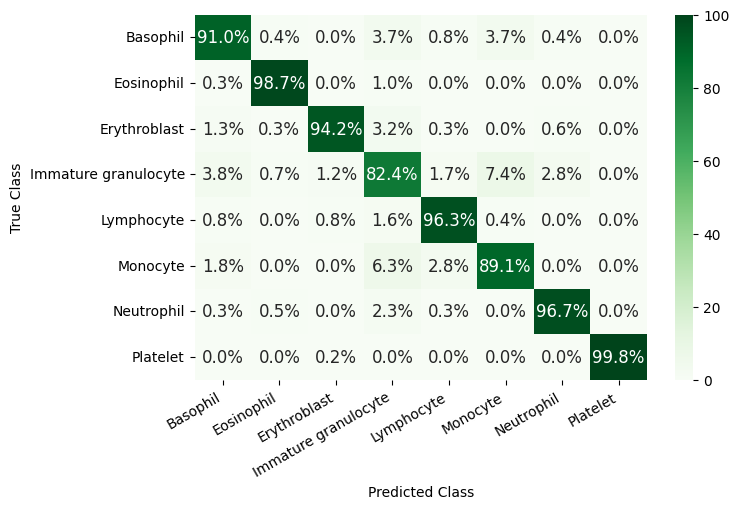

In [12]:
_, _ = plot_confusion_matrix_from_scores(config=config,  T= T_best, s= s_best, patch_size= patch_best, max_lit= maxlit_best, weighted= weighted_best, 
                                   Y_true=Y_test, specialist_name="BloodMNIST_Color_Thermometers", dataset_name=CURRENT_DATASET, save_specialist_name=CURRENT_SPECIALIST, rotate_xlabels=True, figsize=(7.8, 5.2), cmap = "Greens") 

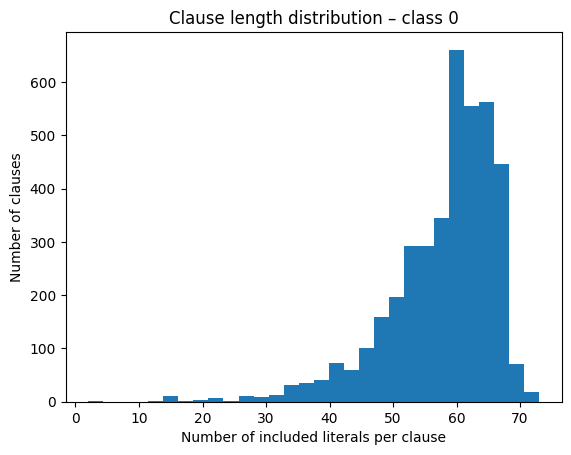

Class 0: median=60.0, mean=57.9, std=8.5


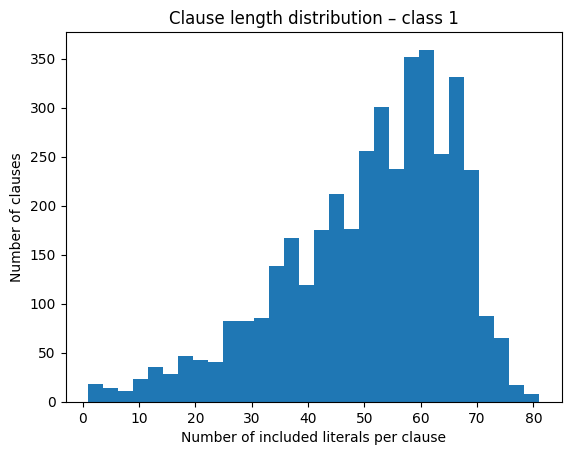

Class 1: median=54.0, mean=50.9, std=15.1


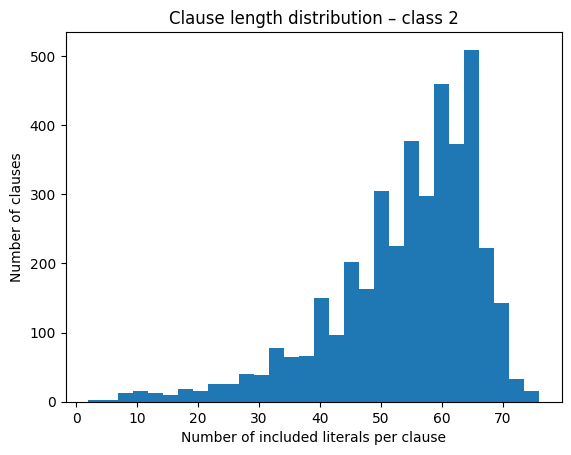

Class 2: median=57.0, mean=54.1, std=12.1


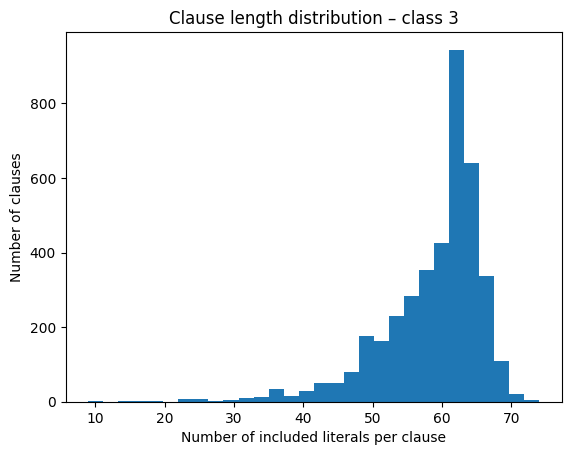

Class 3: median=61.0, mean=58.7, std=7.5


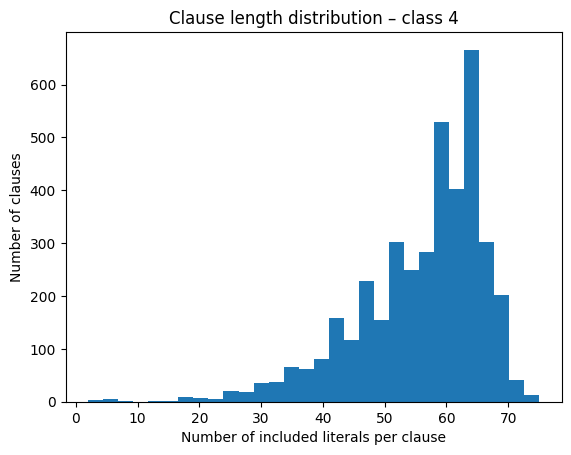

Class 4: median=58.0, mean=55.9, std=10.3


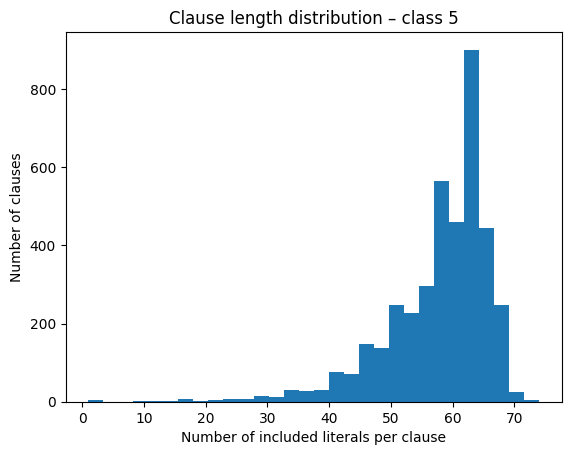

Class 5: median=60.0, mean=57.7, std=8.5


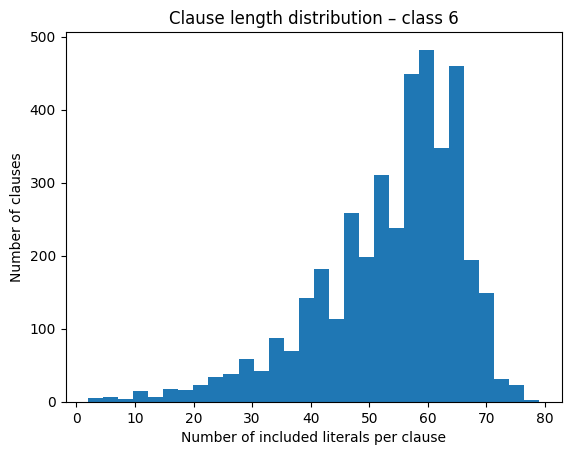

Class 6: median=56.0, mean=53.7, std=12.2


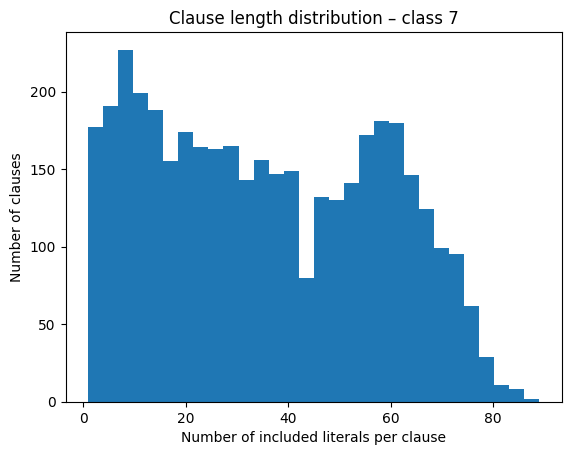

Class 7: median=35.0, mean=35.9, std=22.1


In [15]:
_ = plot_clause_length_distribution(tm)

Test Accuracy: 93.77%
2026-04-04 16:53:48,705 - matplotlib.pyplot - DEBUG - Loaded backend module://matplotlib_inline.backend_inline version unknown.


2026-04-04 16:53:48,708 - matplotlib.pyplot - DEBUG - Loaded backend module://matplotlib_inline.backend_inline version unknown.
2026-04-04 16:53:48,732 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72eb2c7d6240>


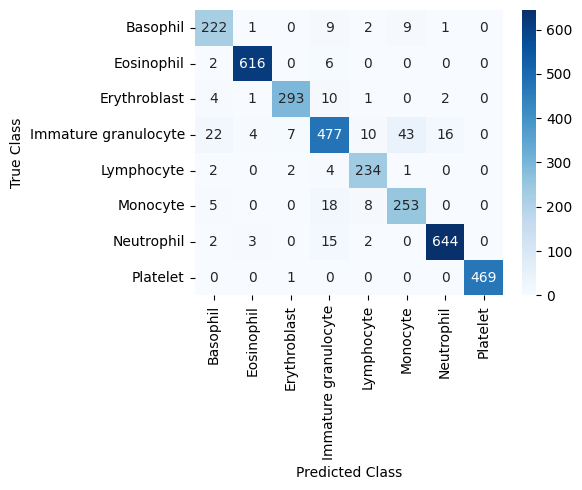

In [11]:
_, _ = plot_confusion_matrix_from_scores(config,  T_best, s_best, patch_best, maxlit_best, weighted_best, 
                                   Y_test, "BloodMNIST_Color_Thermometers") 

# Class 0 Local Examples 

In [10]:
# for i in range(3): 
#     print("============================================")
#     image_index = get_correct_sample_index(tm, X_test, Y_test, target_class=0, random=True)
#     print(f"Selected image index: {image_index}")
#     print(f"True class: {Y_test[image_index]}")
#     print(f"Predicted class: {tm.predict(X_test[image_index:image_index+1])[0]}")

0
2026-04-15 11:36:22,872 - matplotlib.pyplot - DEBUG - Loaded backend module://matplotlib_inline.backend_inline version unknown.
2026-04-15 11:36:22,877 - matplotlib.pyplot - DEBUG - Loaded backend module://matplotlib_inline.backend_inline version unknown.
Visualizing sample 1142  |  predicted class: 0
2026-04-15 11:36:22,913 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x756e6cb71e80>
Saved to saved_heatmaps/color_encoding/blood_color_encoding_lh_c0_s1142_aggr.svg


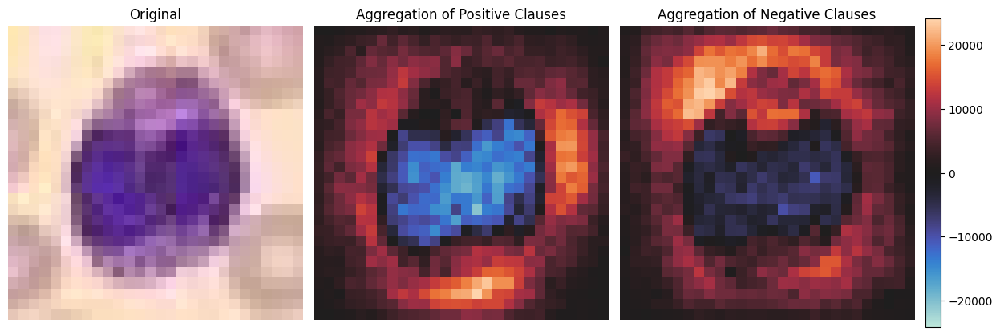

Visualizing sample 1142  |  predicted class: 0
  Channel 0 (Red -)
2026-04-15 11:37:02,772 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x756e6c142f00>
2026-04-15 11:37:02,934 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x756e6c23d100>
2026-04-15 11:37:02,965 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x756e6cb71e80>
2026-04-15 11:37:02,992 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x756e6c0ca5d0>
2026-04-15 11:37:03,019 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x756e2dbaab10>
2026-04-15 11:37:03,047 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x756e2dbdafc0>
2026-04-15 11:37:03,074 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x756e2d98be90>
2026-04-15 11:37:03,101 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ti

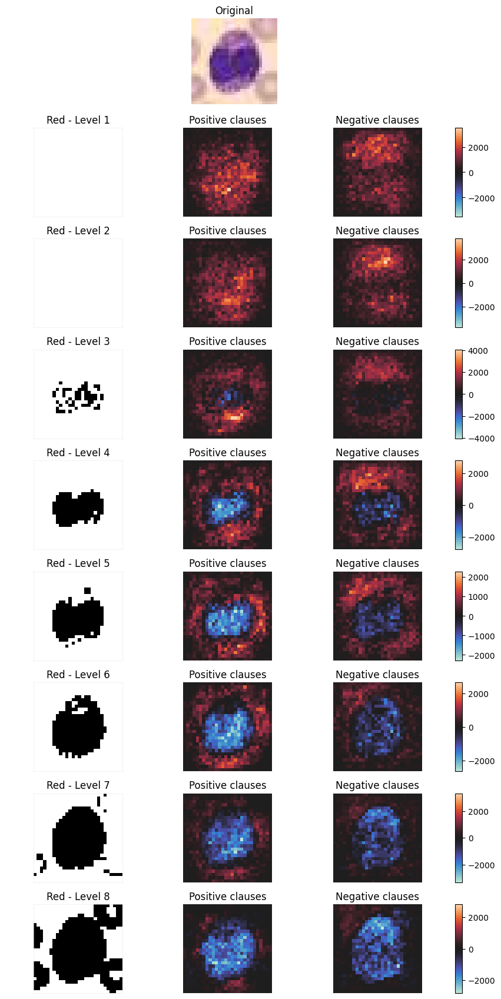

  Channel 1 (Green -)
2026-04-15 11:37:04,579 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x756e4c2a7a40>
2026-04-15 11:37:04,606 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x756e2c5e8da0>
2026-04-15 11:37:04,633 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x756e2d819370>
2026-04-15 11:37:04,762 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x756e2d90c590>
2026-04-15 11:37:04,790 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x756db527cad0>
2026-04-15 11:37:04,816 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x756db51023f0>
2026-04-15 11:37:04,843 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x756db5025f40>
2026-04-15 11:37:04,870 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x756e2d8bf710>
  

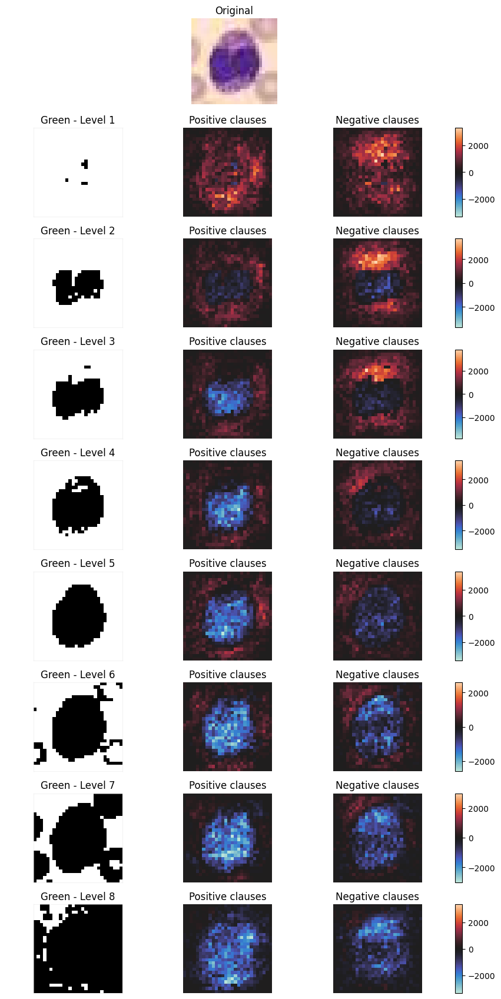

  Channel 2 (Blue -)
2026-04-15 11:37:06,340 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x756db4ea7290>
2026-04-15 11:37:06,368 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x756db4dc6a50>
2026-04-15 11:37:06,395 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x756db4dc5bb0>
2026-04-15 11:37:06,422 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x756db4b5d550>
2026-04-15 11:37:06,449 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x756db4bd9550>
2026-04-15 11:37:06,475 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x756db4965670>
2026-04-15 11:37:06,657 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x756e2d7e1940>
2026-04-15 11:37:06,683 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x756db4cf90a0>
  S

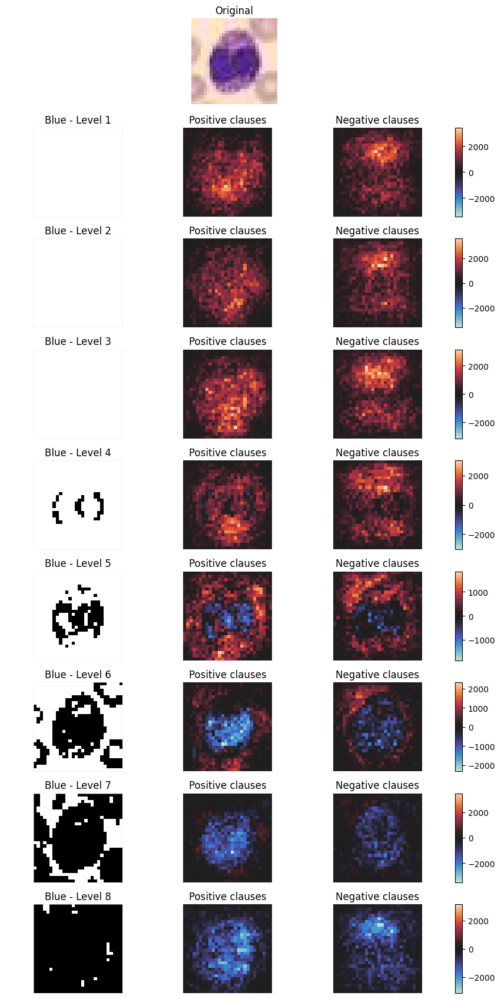

In [10]:
image_index =  1142
target_class = Y_test[image_index]
print(Y_test[image_index])
save_path_aggregated=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.AGGREGATED_HEATMAP, image_index)
visualize_aggregated_heatmap(X_test, X_test_org, tm, image_index,
    resolution= CURRENT_RESOLUTION, n_channels = config.CHANNELS, image_shape=(28, 28), show_diff=False, save_path=save_path_aggregated)

    
save_path_per_channel_r=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_R, image_index)
save_path_per_channel_g=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_G, image_index)
save_path_per_channel_b=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_B, image_index)
visualize_per_channel_level_heatmaps(X_test, X_test_org, tm, image_index,
    resolution= CURRENT_RESOLUTION, n_channels = config.CHANNELS, image_shape=(28, 28), show_diff=False, channel_names=["Red -", "Green -", "Blue -"], save_path=[save_path_per_channel_r, save_path_per_channel_g, save_path_per_channel_b])

0
Visualizing sample 2206  |  predicted class: 0
2026-04-10 15:52:27,832 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da405f6a20>
Saved to saved_heatmaps/color_encoding/blood_color_encoding_lh_c0_s2206_aggr.svg


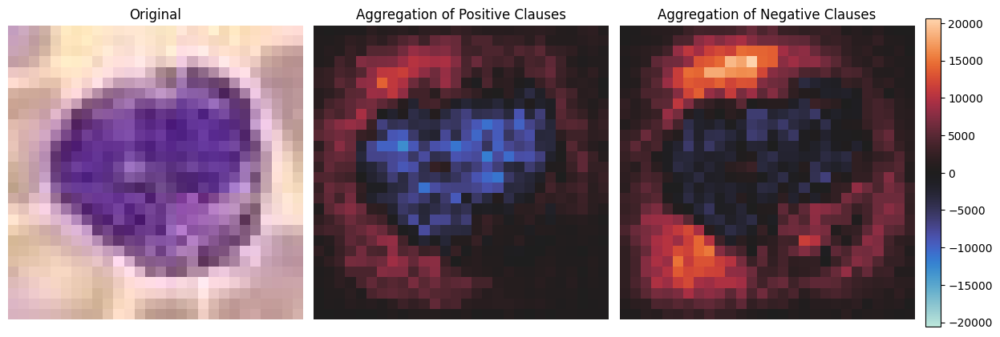

Visualizing sample 2206  |  predicted class: 0
  Channel 0 (Red -)
2026-04-10 15:52:55,621 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da4057b260>
2026-04-10 15:52:55,652 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da40a57b60>
2026-04-10 15:52:55,689 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da61c71280>
2026-04-10 15:52:55,761 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c33a97c0>
2026-04-10 15:52:55,845 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da40926d50>
2026-04-10 15:52:55,886 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c32b0320>
2026-04-10 15:52:55,963 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da4067e000>
2026-04-10 15:52:56,407 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ti

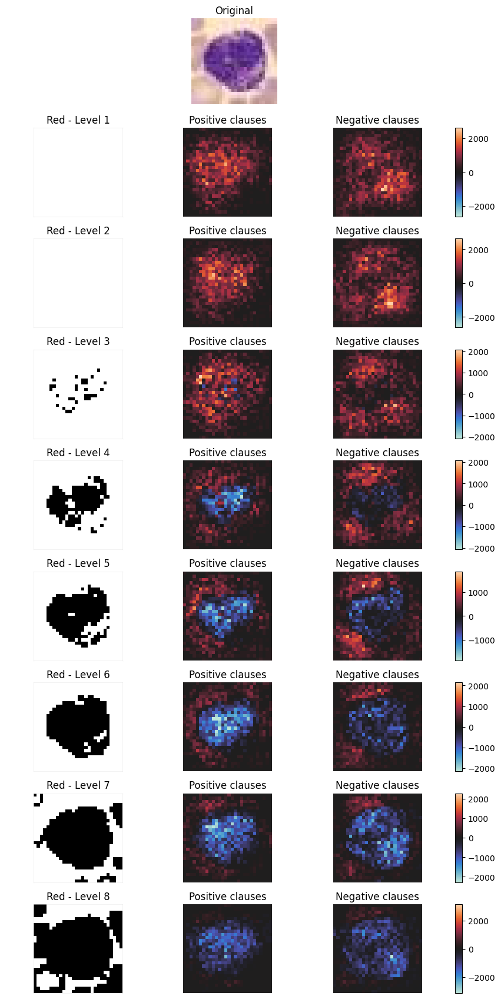

  Channel 1 (Green -)
2026-04-10 15:52:58,696 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c34a1280>
2026-04-10 15:52:58,727 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f762840>
2026-04-10 15:52:58,758 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f3ed9a0>
2026-04-10 15:52:58,790 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c8149160>
2026-04-10 15:52:58,822 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da40226a50>
2026-04-10 15:52:58,854 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da4064f8c0>
2026-04-10 15:52:58,885 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da404414c0>
2026-04-10 15:52:58,916 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c8169790>
  

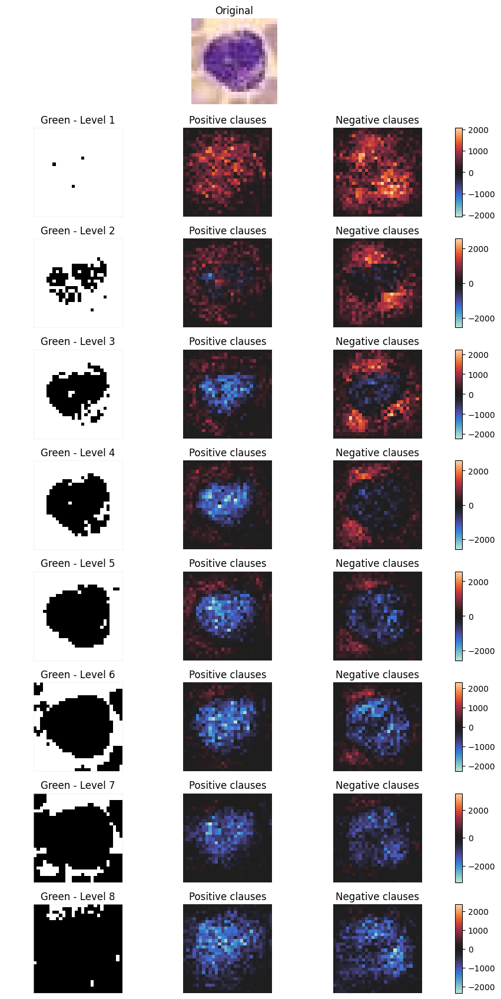

  Channel 2 (Blue -)
2026-04-10 15:53:01,369 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da40a577d0>
2026-04-10 15:53:01,398 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c35c94f0>
2026-04-10 15:53:01,427 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da40953b00>
2026-04-10 15:53:01,456 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c3208ad0>
2026-04-10 15:53:01,484 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da404a7e30>
2026-04-10 15:53:01,513 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c34d8680>
2026-04-10 15:53:01,541 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da61c70740>
2026-04-10 15:53:01,570 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da4041aea0>
  S

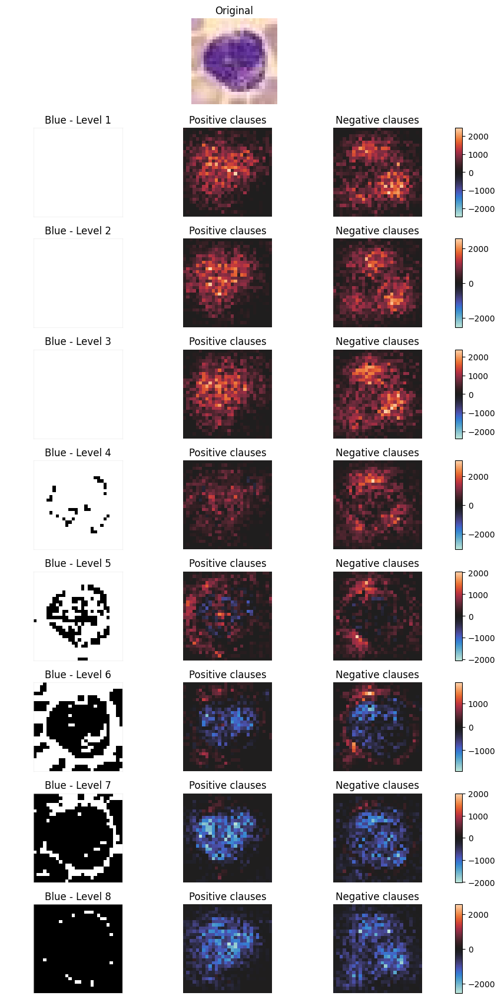

In [12]:
image_index =  2206
target_class = Y_test[image_index]
print(Y_test[image_index])
save_path_aggregated=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.AGGREGATED_HEATMAP, image_index)
visualize_aggregated_heatmap(X_test, X_test_org, tm, image_index,
    resolution= CURRENT_RESOLUTION, n_channels = config.CHANNELS, image_shape=(28, 28), show_diff=False, save_path=save_path_aggregated)

    
save_path_per_channel_r=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_R, image_index)
save_path_per_channel_g=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_G, image_index)
save_path_per_channel_b=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_B, image_index)
visualize_per_channel_level_heatmaps(X_test, X_test_org, tm, image_index,
    resolution= CURRENT_RESOLUTION, n_channels = config.CHANNELS, image_shape=(28, 28), show_diff=False, channel_names=["Red -", "Green -", "Blue -"], save_path=[save_path_per_channel_r, save_path_per_channel_g, save_path_per_channel_b])

0


Visualizing sample 1317  |  predicted class: 0
2026-04-10 15:53:35,095 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c81147d0>
Saved to saved_heatmaps/color_encoding/blood_color_encoding_lh_c0_s1317_aggr.svg


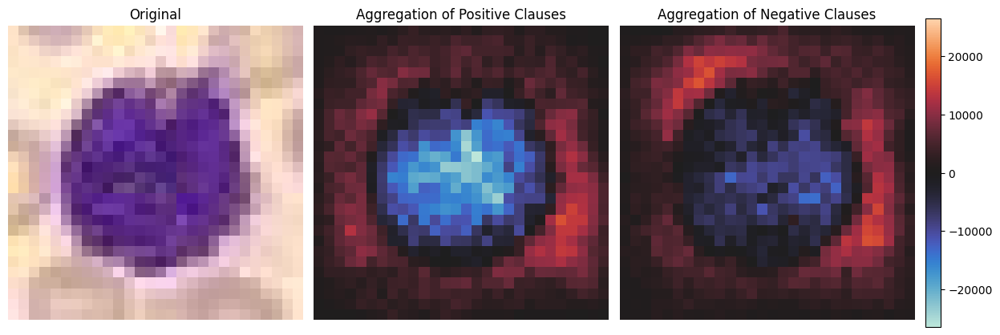

Visualizing sample 1317  |  predicted class: 0
  Channel 0 (Red -)
2026-04-10 15:54:07,574 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da403a9f10>
2026-04-10 15:54:07,603 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da402dade0>
2026-04-10 15:54:07,633 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da402769f0>
2026-04-10 15:54:07,662 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da40a4a240>
2026-04-10 15:54:07,693 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da40443ec0>
2026-04-10 15:54:07,725 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da4054c8c0>
2026-04-10 15:54:07,759 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da4074cef0>
2026-04-10 15:54:07,788 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ti

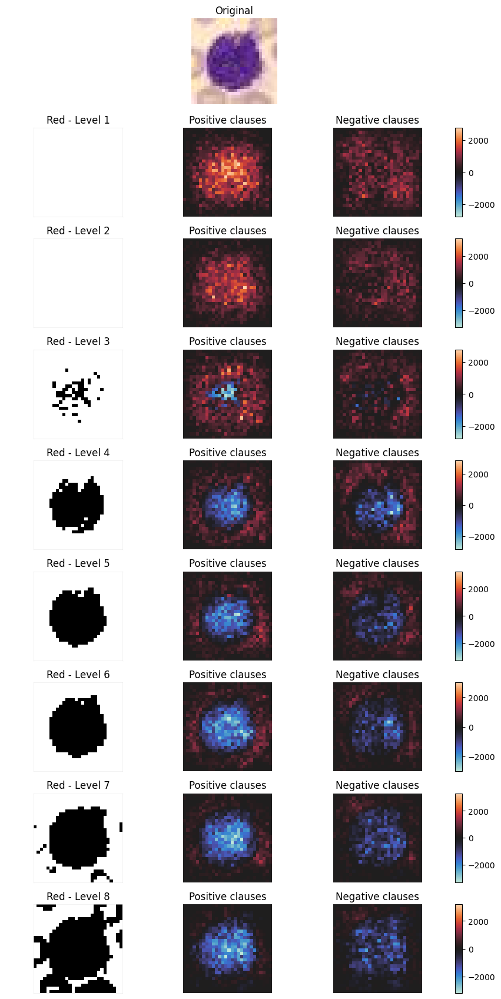

  Channel 1 (Green -)
2026-04-10 15:54:09,953 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da40a2b380>
2026-04-10 15:54:10,115 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da61bfccb0>
2026-04-10 15:54:10,141 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f64f560>
2026-04-10 15:54:10,169 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f82f410>
2026-04-10 15:54:10,197 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f8d5850>
2026-04-10 15:54:10,224 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f7537a0>
2026-04-10 15:54:10,253 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c8133770>
2026-04-10 15:54:10,281 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c8130590>
  

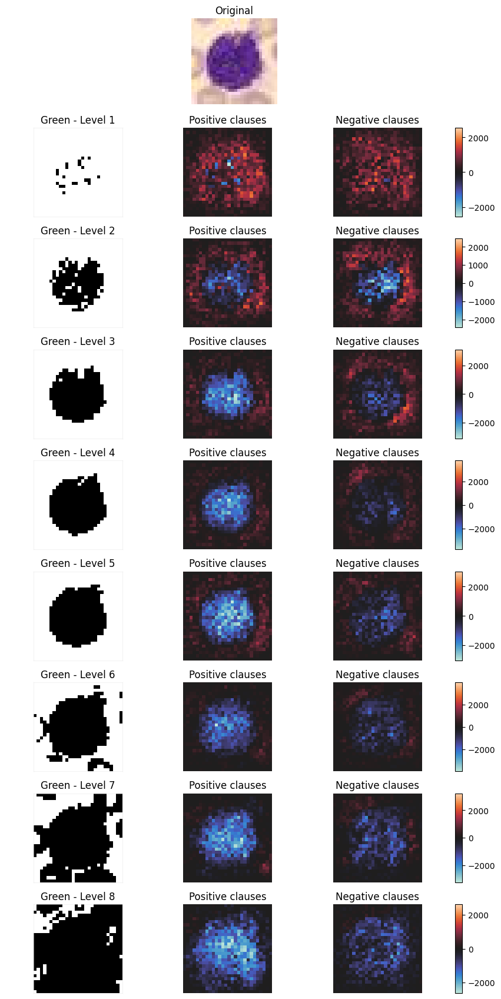

  Channel 2 (Blue -)
2026-04-10 15:54:11,784 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c37f17c0>
2026-04-10 15:54:11,812 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c330b680>
2026-04-10 15:54:11,838 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c315ec00>
2026-04-10 15:54:11,865 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f6202c0>
2026-04-10 15:54:12,043 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c369c350>
2026-04-10 15:54:12,070 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c3579df0>
2026-04-10 15:54:12,097 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c315d5b0>
2026-04-10 15:54:12,123 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c81039b0>
  S

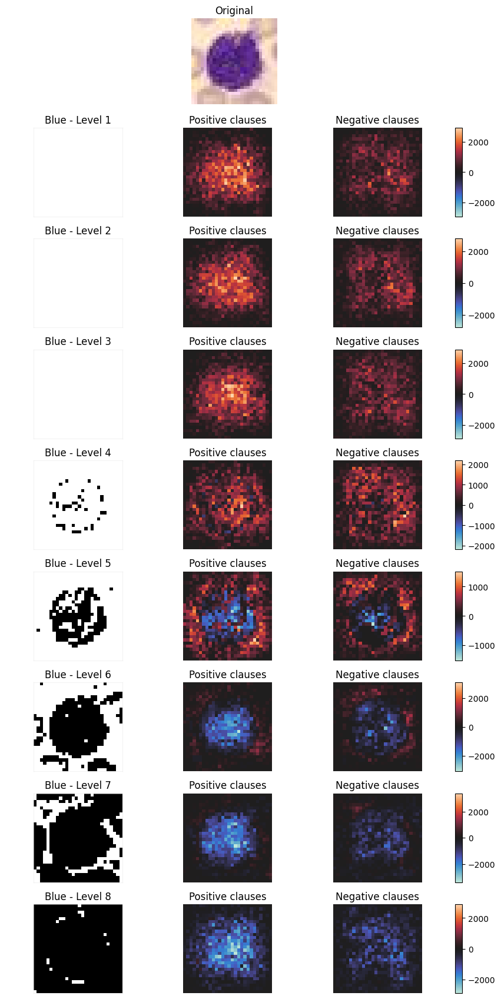

In [13]:
image_index =  1317
target_class = Y_test[image_index]
print(Y_test[image_index])
save_path_aggregated=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.AGGREGATED_HEATMAP, image_index)
visualize_aggregated_heatmap(X_test, X_test_org, tm, image_index,
    resolution= CURRENT_RESOLUTION, n_channels = config.CHANNELS, image_shape=(28, 28), show_diff=False, save_path=save_path_aggregated)

    
save_path_per_channel_r=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_R, image_index)
save_path_per_channel_g=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_G, image_index)
save_path_per_channel_b=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_B, image_index)
visualize_per_channel_level_heatmaps(X_test, X_test_org, tm, image_index,
    resolution= CURRENT_RESOLUTION, n_channels = config.CHANNELS, image_shape=(28, 28), show_diff=False, channel_names=["Red -", "Green -", "Blue -"], save_path=[save_path_per_channel_r, save_path_per_channel_g, save_path_per_channel_b])

# Class 1 Local Examples 

In [14]:
# for i in range(3): 
#     print("============================================")
#     image_index = get_correct_sample_index(tm, X_test, Y_test, target_class=1, random=True)
#     print(f"Selected image index: {image_index}")
#     print(f"True class: {Y_test[image_index]}")
#     print(f"Predicted class: {tm.predict(X_test[image_index:image_index+1])[0]}")

1
Visualizing sample 3001  |  predicted class: 1
2026-04-10 15:55:33,903 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da404050d0>
Saved to saved_heatmaps/color_encoding/blood_color_encoding_lh_c1_s3001_aggr.svg


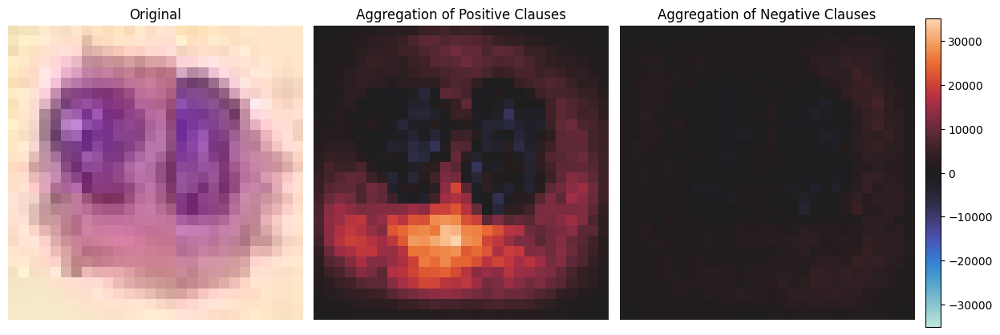

Visualizing sample 3001  |  predicted class: 1
  Channel 0 (Red -)
2026-04-10 15:56:59,945 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f620950>
2026-04-10 15:56:59,978 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da405f7c50>
2026-04-10 15:57:00,011 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da4064ec00>
2026-04-10 15:57:00,049 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da40314bc0>
2026-04-10 15:57:00,082 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c37adfd0>
2026-04-10 15:57:00,345 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da404d6b70>
2026-04-10 15:57:00,378 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da408ca1b0>
2026-04-10 15:57:00,409 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ti

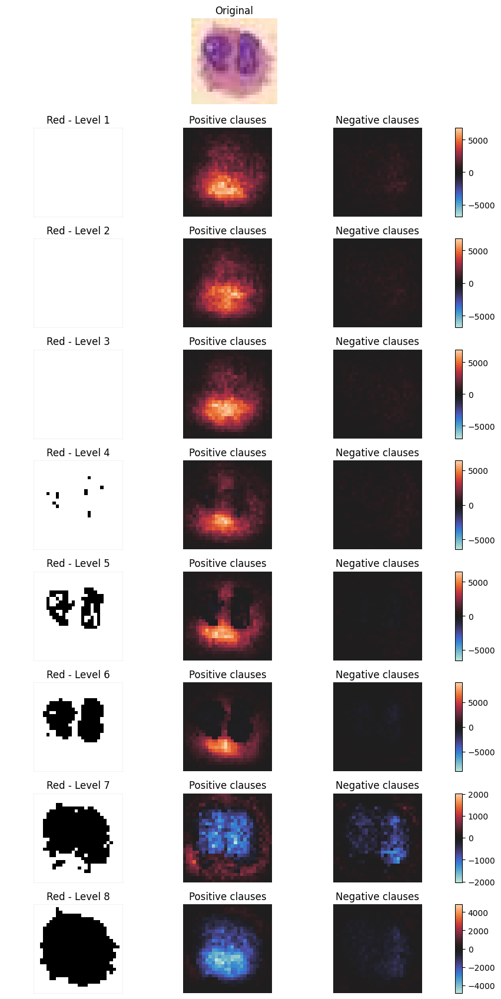

  Channel 1 (Green -)
2026-04-10 15:57:02,183 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c819adb0>
2026-04-10 15:57:02,216 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c36f7890>
2026-04-10 15:57:02,250 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c35fa600>
2026-04-10 15:57:02,282 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c8182c00>
2026-04-10 15:57:02,316 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c81991c0>
2026-04-10 15:57:02,349 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c335b530>
2026-04-10 15:57:02,382 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c37a0860>
2026-04-10 15:57:02,572 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c364b200>
  

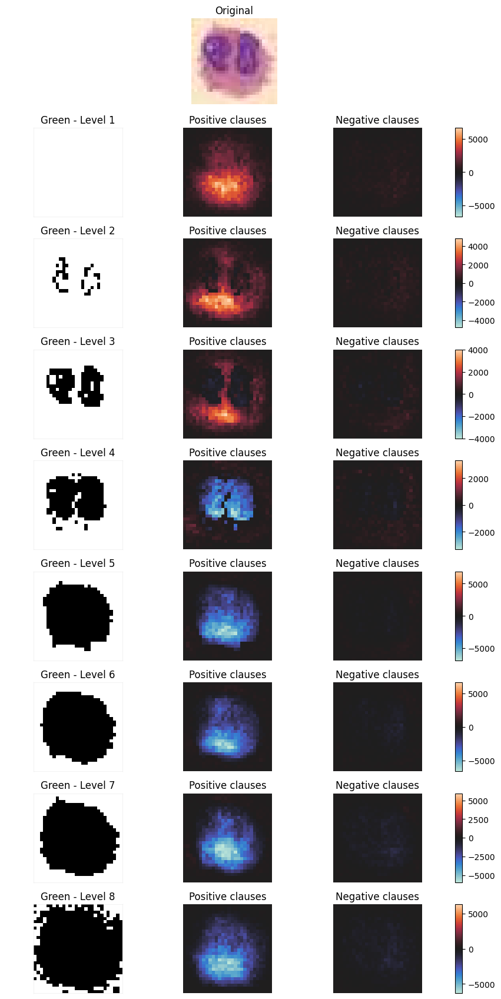

  Channel 2 (Blue -)
2026-04-10 15:57:04,373 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c347c3e0>
2026-04-10 15:57:04,406 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f544e30>
2026-04-10 15:57:04,441 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c36748f0>
2026-04-10 15:57:04,472 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f409250>
2026-04-10 15:57:04,503 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da402f68d0>
2026-04-10 15:57:04,536 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c3764ef0>
2026-04-10 15:57:04,568 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c335dbb0>
2026-04-10 15:57:04,599 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c335cd10>
  S

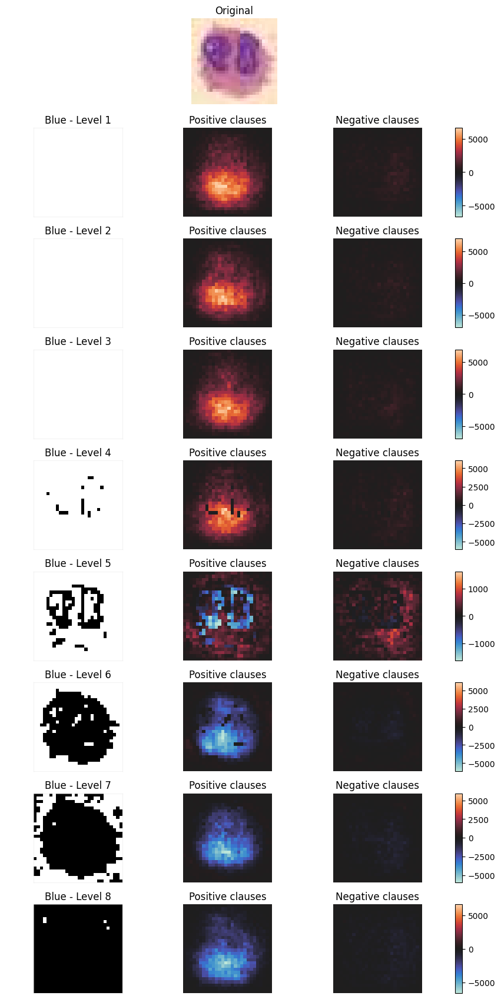

In [15]:
image_index =  3001
target_class = Y_test[image_index]
print(Y_test[image_index])
save_path_aggregated=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.AGGREGATED_HEATMAP, image_index)
visualize_aggregated_heatmap(X_test, X_test_org, tm, image_index,
    resolution= CURRENT_RESOLUTION, n_channels = config.CHANNELS, image_shape=(28, 28), show_diff=False, save_path=save_path_aggregated)

    
save_path_per_channel_r=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_R, image_index)
save_path_per_channel_g=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_G, image_index)
save_path_per_channel_b=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_B, image_index)
visualize_per_channel_level_heatmaps(X_test, X_test_org, tm, image_index,
    resolution= CURRENT_RESOLUTION, n_channels = config.CHANNELS, image_shape=(28, 28), show_diff=False, channel_names=["Red -", "Green -", "Blue -"], save_path=[save_path_per_channel_r, save_path_per_channel_g, save_path_per_channel_b])

1


Visualizing sample 2999  |  predicted class: 1
2026-04-10 15:58:31,495 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c2f35f10>
Saved to saved_heatmaps/color_encoding/blood_color_encoding_lh_c1_s2999_aggr.svg


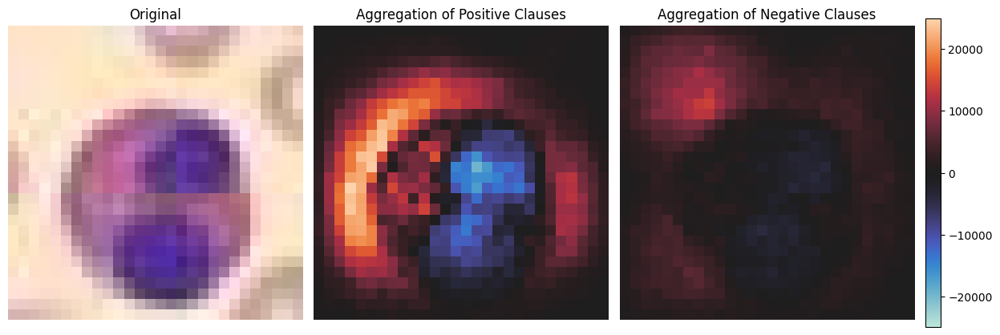

Visualizing sample 2999  |  predicted class: 1
  Channel 0 (Red -)
2026-04-10 15:59:43,284 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c30441d0>
2026-04-10 15:59:43,317 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c347ee10>
2026-04-10 15:59:43,345 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c33e3bf0>
2026-04-10 15:59:43,375 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f94f440>
2026-04-10 15:59:43,403 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da403319a0>
2026-04-10 15:59:43,433 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da61bfe210>
2026-04-10 15:59:43,464 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c81994c0>
2026-04-10 15:59:43,492 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ti

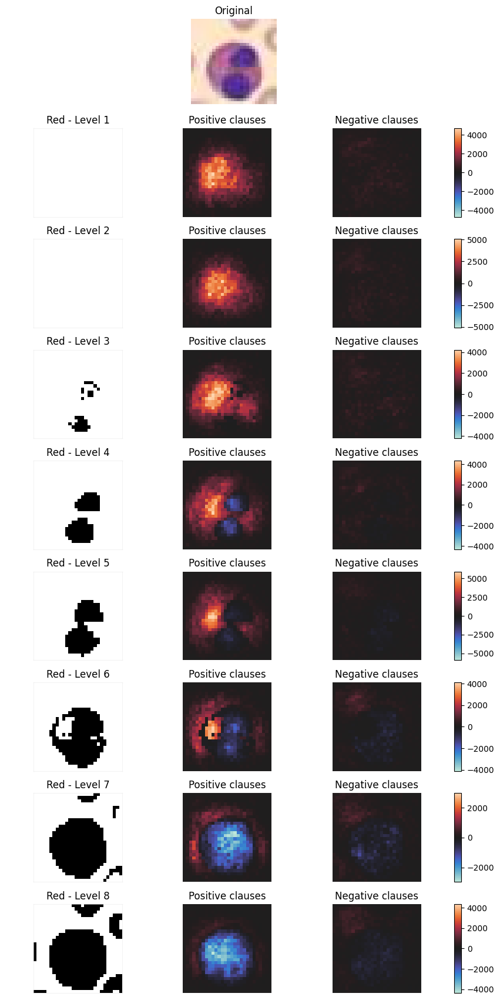

  Channel 1 (Green -)
2026-04-10 15:59:45,096 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c37f0c50>
2026-04-10 15:59:45,260 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c814b7d0>
2026-04-10 15:59:45,288 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c37aecc0>
2026-04-10 15:59:45,315 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da4054d340>
2026-04-10 15:59:45,342 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c37a1ac0>
2026-04-10 15:59:45,369 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da61c705f0>
2026-04-10 15:59:45,397 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da403c1bb0>
2026-04-10 15:59:45,424 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da401a8140>
  

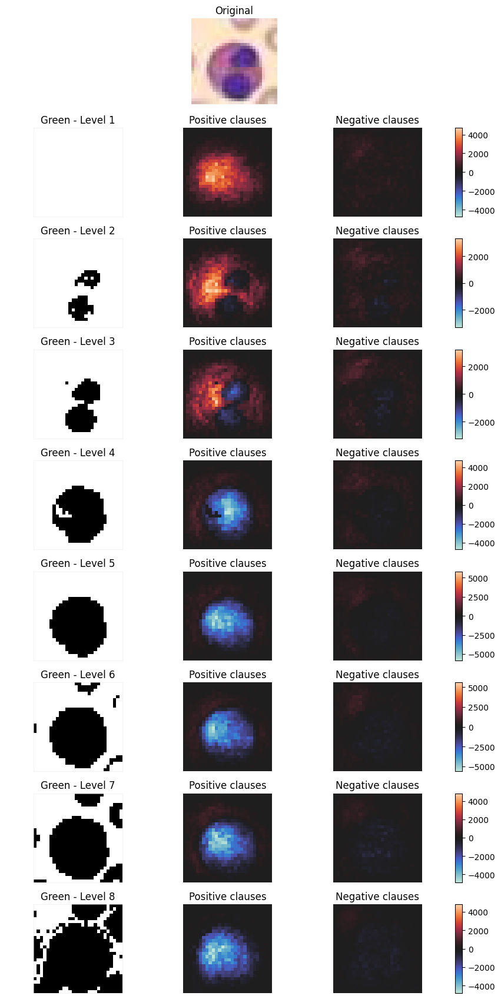

  Channel 2 (Blue -)
2026-04-10 15:59:47,054 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da409cbbf0>
2026-04-10 15:59:47,083 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da4064fb60>
2026-04-10 15:59:47,111 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da4021e6c0>
2026-04-10 15:59:47,301 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c3309c40>
2026-04-10 15:59:47,330 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da40724770>
2026-04-10 15:59:47,356 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c309e9f0>
2026-04-10 15:59:47,385 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f750b90>
2026-04-10 15:59:47,412 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c347e4b0>
  S

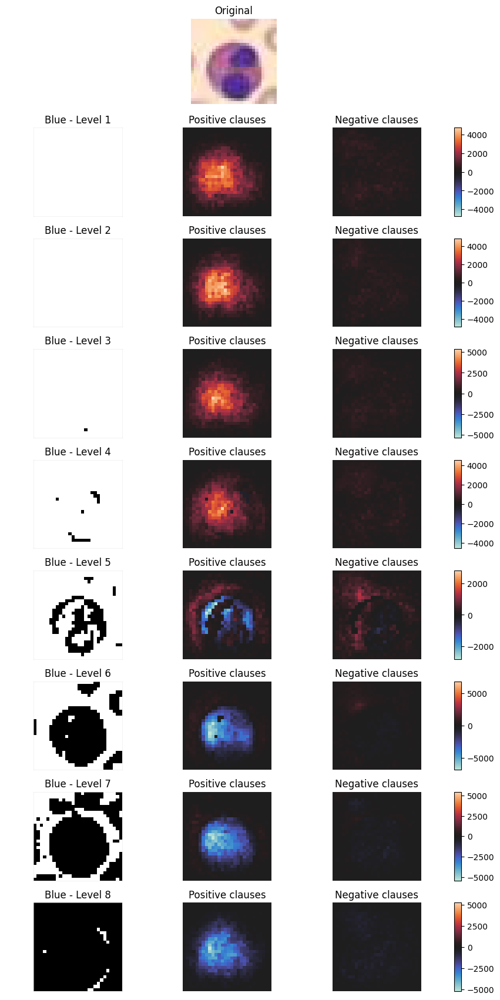

In [16]:
image_index =  2999
target_class = Y_test[image_index]
print(Y_test[image_index])
save_path_aggregated=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.AGGREGATED_HEATMAP, image_index)
visualize_aggregated_heatmap(X_test, X_test_org, tm, image_index,
    resolution= CURRENT_RESOLUTION, n_channels = config.CHANNELS, image_shape=(28, 28), show_diff=False, save_path=save_path_aggregated)

    
save_path_per_channel_r=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_R, image_index)
save_path_per_channel_g=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_G, image_index)
save_path_per_channel_b=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_B, image_index)
visualize_per_channel_level_heatmaps(X_test, X_test_org, tm, image_index,
    resolution= CURRENT_RESOLUTION, n_channels = config.CHANNELS, image_shape=(28, 28), show_diff=False, channel_names=["Red -", "Green -", "Blue -"], save_path=[save_path_per_channel_r, save_path_per_channel_g, save_path_per_channel_b])

1


Visualizing sample 3161  |  predicted class: 1
2026-04-10 16:00:42,327 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c30e5070>
Saved to saved_heatmaps/color_encoding/blood_color_encoding_lh_c1_s3161_aggr.svg


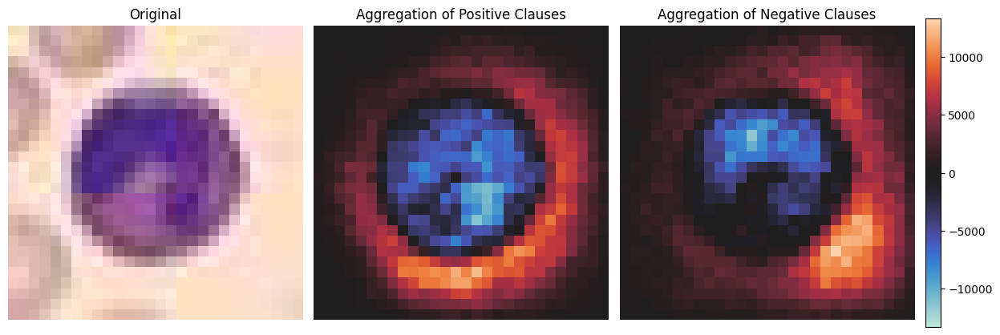

Visualizing sample 3161  |  predicted class: 1
  Channel 0 (Red -)
2026-04-10 16:01:35,749 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da401fc0e0>
2026-04-10 16:01:35,778 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da4074c5c0>
2026-04-10 16:01:35,806 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da408cba70>
2026-04-10 16:01:35,832 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da406d5bb0>
2026-04-10 16:01:36,061 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da4074c620>
2026-04-10 16:01:36,088 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da4064ed80>
2026-04-10 16:01:36,115 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c8103b90>
2026-04-10 16:01:36,142 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ti

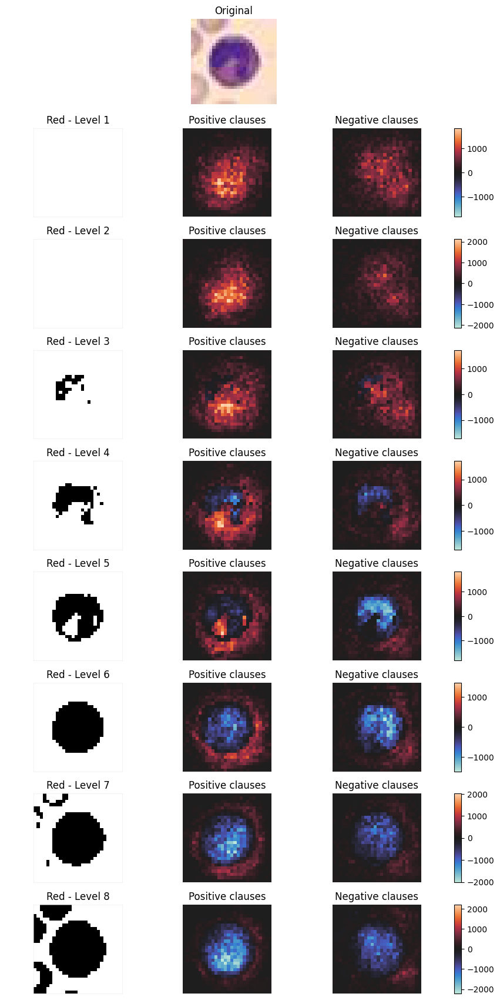

  Channel 1 (Green -)
2026-04-10 16:01:37,657 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da409c90d0>
2026-04-10 16:01:37,684 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c3290140>
2026-04-10 16:01:37,711 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c37ae210>
2026-04-10 16:01:37,738 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da4067cd10>
2026-04-10 16:01:37,765 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da408f8530>
2026-04-10 16:01:37,794 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da40a54650>
2026-04-10 16:01:37,956 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c36eb7d0>
2026-04-10 16:01:37,983 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da61c71010>
  

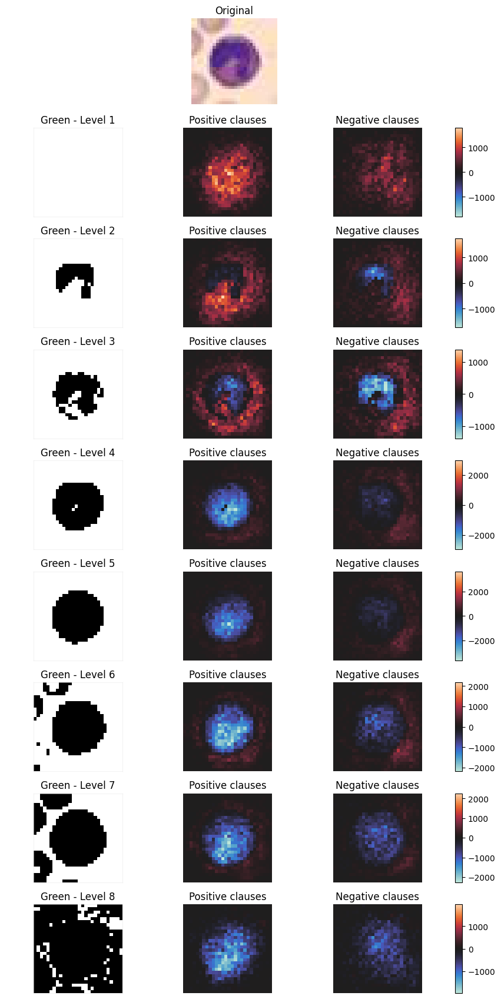

  Channel 2 (Blue -)
2026-04-10 16:01:39,487 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da405ccbc0>
2026-04-10 16:01:39,514 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c30c9a00>
2026-04-10 16:01:39,540 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da403eaab0>
2026-04-10 16:01:39,568 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c30b7350>
2026-04-10 16:01:39,596 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da403e94c0>
2026-04-10 16:01:39,623 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c3234c20>
2026-04-10 16:01:39,650 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c2f34770>
2026-04-10 16:01:39,677 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f3a6750>
  S

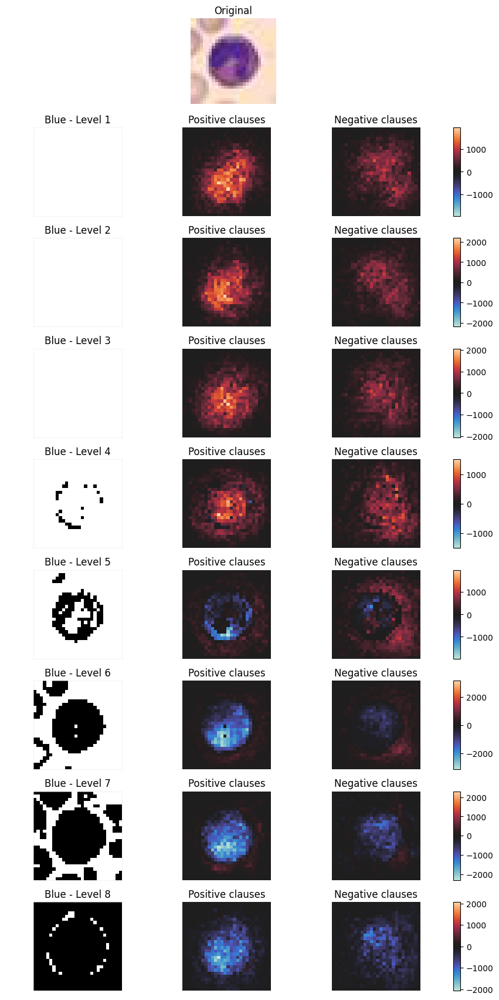

In [17]:
image_index =  3161
target_class = Y_test[image_index]
print(Y_test[image_index])
save_path_aggregated=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.AGGREGATED_HEATMAP, image_index)
visualize_aggregated_heatmap(X_test, X_test_org, tm, image_index,
    resolution= CURRENT_RESOLUTION, n_channels = config.CHANNELS, image_shape=(28, 28), show_diff=False, save_path=save_path_aggregated)

    
save_path_per_channel_r=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_R, image_index)
save_path_per_channel_g=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_G, image_index)
save_path_per_channel_b=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_B, image_index)
visualize_per_channel_level_heatmaps(X_test, X_test_org, tm, image_index,
    resolution= CURRENT_RESOLUTION, n_channels = config.CHANNELS, image_shape=(28, 28), show_diff=False, channel_names=["Red -", "Green -", "Blue -"], save_path=[save_path_per_channel_r, save_path_per_channel_g, save_path_per_channel_b])

# Class 2 Local Examples 

In [18]:
# for i in range(3): 
#     print("============================================")
#     image_index = get_correct_sample_index(tm, X_test, Y_test, target_class=2, random=True)
#     print(f"Selected image index: {image_index}")
#     print(f"True class: {Y_test[image_index]}")
#     print(f"Predicted class: {tm.predict(X_test[image_index:image_index+1])[0]}")

2


Visualizing sample 56  |  predicted class: 2
2026-04-10 16:02:13,156 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c35613a0>
Saved to saved_heatmaps/color_encoding/blood_color_encoding_lh_c2_s56_aggr.svg


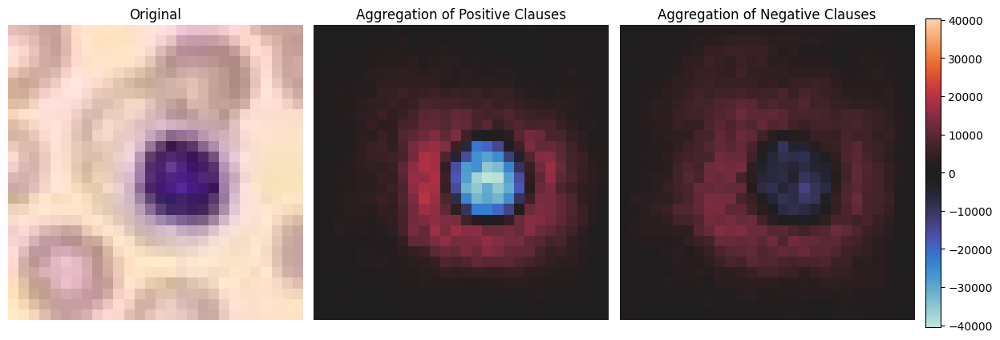

Visualizing sample 56  |  predicted class: 2
  Channel 0 (Red -)
2026-04-10 16:02:44,984 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c8130440>
2026-04-10 16:02:45,012 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f760a10>
2026-04-10 16:02:45,040 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f5462a0>
2026-04-10 16:02:45,067 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c354a5a0>
2026-04-10 16:02:45,095 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c36f4560>
2026-04-10 16:02:45,121 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c32b2b10>
2026-04-10 16:02:45,149 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da40a543b0>
2026-04-10 16:02:45,176 - matplotlib.colorbar - DEBUG - locator: <matplotlib.tick

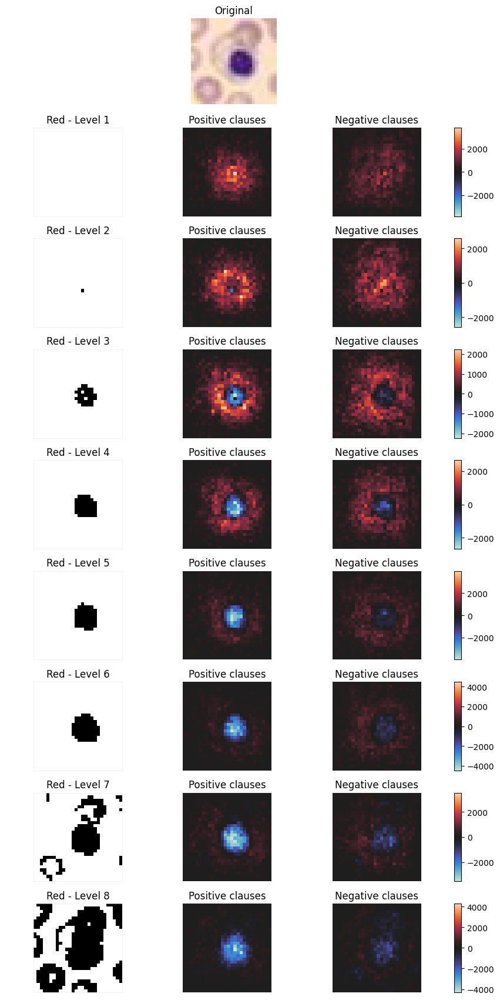

  Channel 1 (Green -)
2026-04-10 16:02:46,807 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da402f5310>
2026-04-10 16:02:46,834 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da4054da00>
2026-04-10 16:02:46,862 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c35628d0>
2026-04-10 16:02:46,889 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f86cd70>
2026-04-10 16:02:46,916 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da408cbaa0>
2026-04-10 16:02:46,943 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f5a6840>
2026-04-10 16:02:46,971 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c376d190>
2026-04-10 16:02:46,999 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c2f1c920>
  

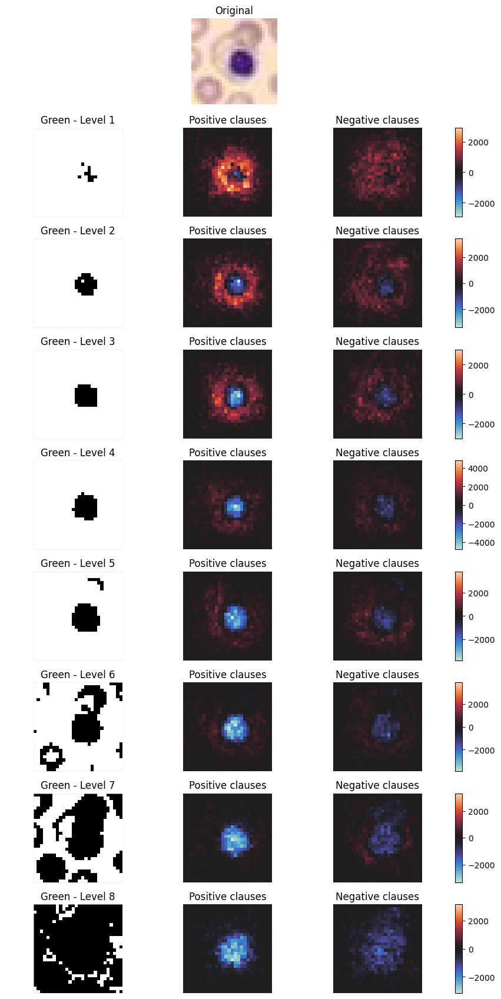

  Channel 2 (Blue -)
2026-04-10 16:02:48,555 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da406d4680>
2026-04-10 16:02:48,584 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f8d60c0>
2026-04-10 16:02:48,764 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da407265a0>
2026-04-10 16:02:48,792 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da40977560>
2026-04-10 16:02:48,819 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c325a9f0>
2026-04-10 16:02:48,847 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c310dc10>
2026-04-10 16:02:48,876 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c35490d0>
2026-04-10 16:02:48,904 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c309c920>
  S

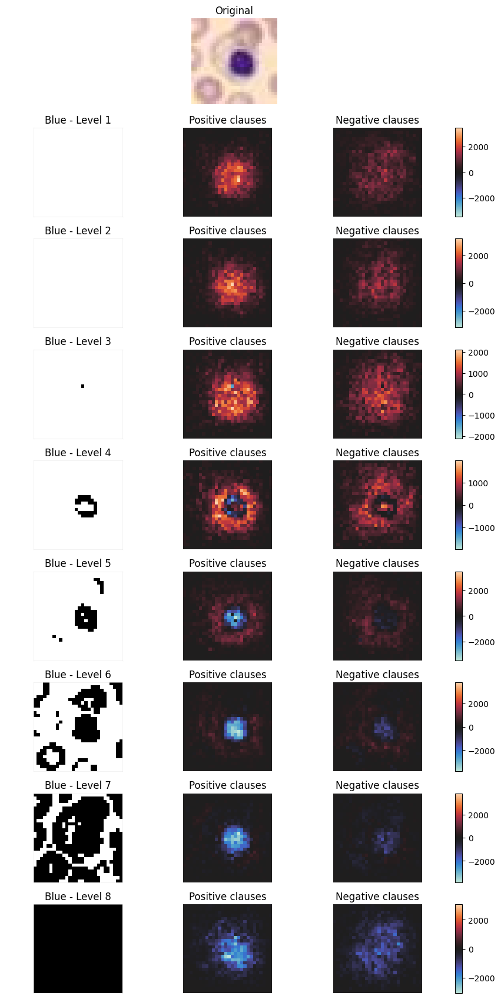

In [19]:
image_index =  56
target_class = Y_test[image_index]
print(Y_test[image_index])
save_path_aggregated=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.AGGREGATED_HEATMAP, image_index)
visualize_aggregated_heatmap(X_test, X_test_org, tm, image_index,
    resolution= CURRENT_RESOLUTION, n_channels = config.CHANNELS, image_shape=(28, 28), show_diff=False, save_path=save_path_aggregated)

    
save_path_per_channel_r=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_R, image_index)
save_path_per_channel_g=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_G, image_index)
save_path_per_channel_b=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_B, image_index)
visualize_per_channel_level_heatmaps(X_test, X_test_org, tm, image_index,
    resolution= CURRENT_RESOLUTION, n_channels = config.CHANNELS, image_shape=(28, 28), show_diff=False, channel_names=["Red -", "Green -", "Blue -"], save_path=[save_path_per_channel_r, save_path_per_channel_g, save_path_per_channel_b])

2


Visualizing sample 188  |  predicted class: 2
2026-04-10 16:03:22,140 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c35f92b0>
Saved to saved_heatmaps/color_encoding/blood_color_encoding_lh_c2_s188_aggr.svg


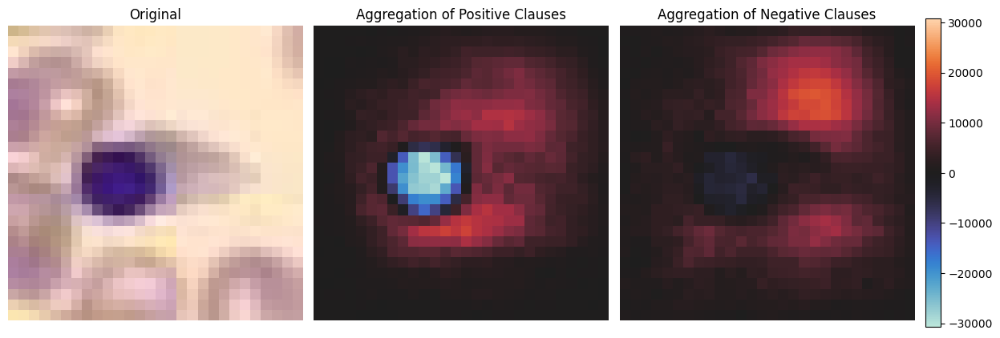

Visualizing sample 188  |  predicted class: 2
  Channel 0 (Red -)
2026-04-10 16:03:53,469 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da40897020>
2026-04-10 16:03:53,499 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c30112b0>
2026-04-10 16:03:53,530 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c335e1e0>
2026-04-10 16:03:53,767 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da67ae26c0>
2026-04-10 16:03:53,795 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f40b470>
2026-04-10 16:03:53,821 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da40523170>
2026-04-10 16:03:53,848 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f42bfe0>
2026-04-10 16:03:53,876 - matplotlib.colorbar - DEBUG - locator: <matplotlib.tic

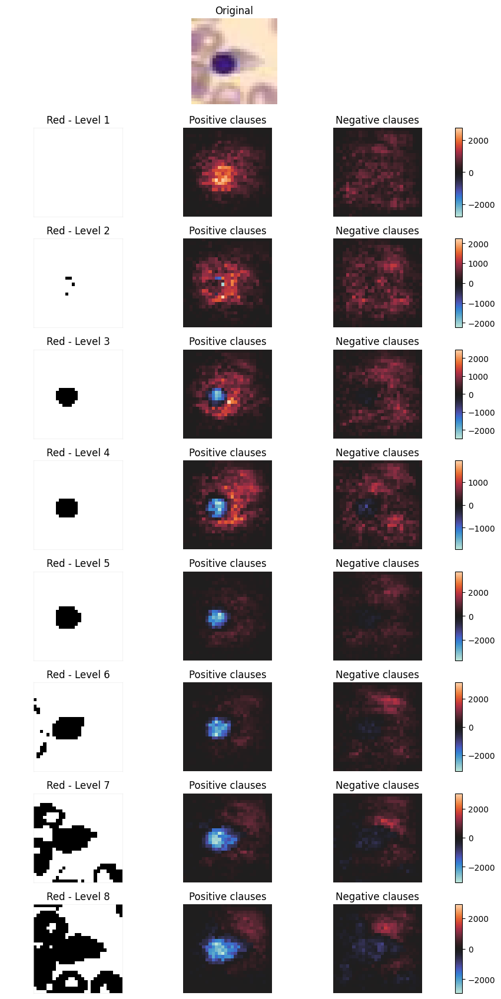

  Channel 1 (Green -)
2026-04-10 16:03:55,398 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c2e11eb0>
2026-04-10 16:03:55,426 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f4aa090>
2026-04-10 16:03:55,453 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da408f88c0>
2026-04-10 16:03:55,481 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c3549ac0>
2026-04-10 16:03:55,509 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c8116c90>
2026-04-10 16:03:55,539 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c30e6fc0>
2026-04-10 16:03:55,706 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da403324b0>
2026-04-10 16:03:55,734 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da4094c440>
  

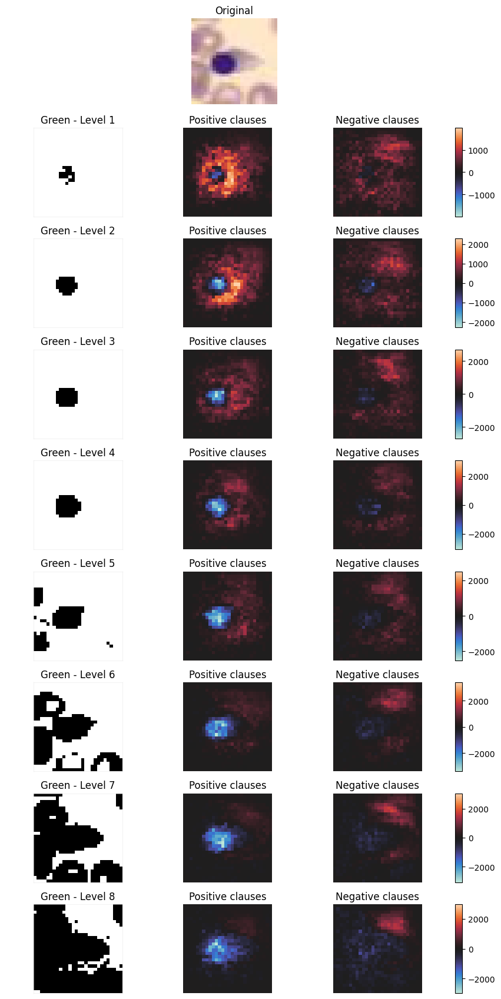

  Channel 2 (Blue -)
2026-04-10 16:03:57,230 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c320a480>
2026-04-10 16:03:57,258 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c310f380>
2026-04-10 16:03:57,286 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c368dfa0>
2026-04-10 16:03:57,313 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c2fbfe60>
2026-04-10 16:03:57,340 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da40443bc0>
2026-04-10 16:03:57,367 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c34543b0>
2026-04-10 16:03:57,394 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da61cc4980>
2026-04-10 16:03:57,421 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c3359910>
  S

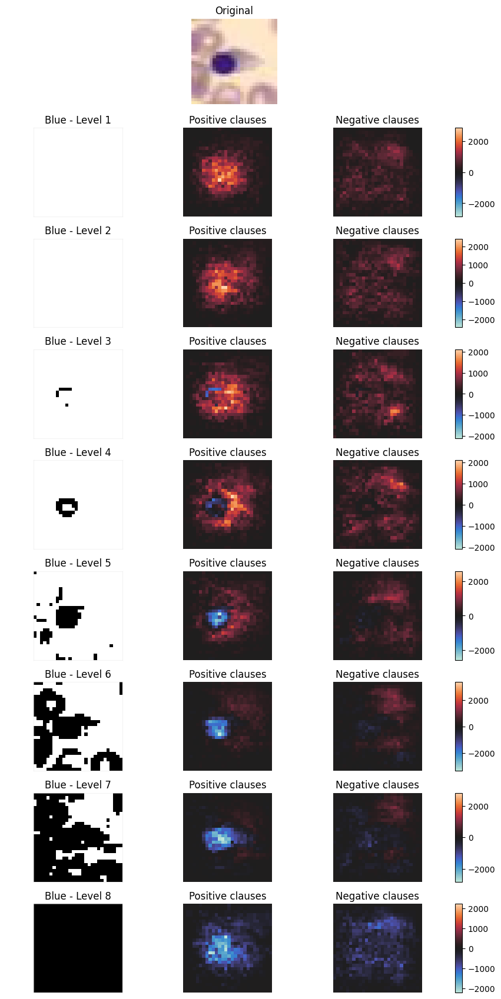

In [20]:
image_index =  188
target_class = Y_test[image_index]
print(Y_test[image_index])
save_path_aggregated=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.AGGREGATED_HEATMAP, image_index)
visualize_aggregated_heatmap(X_test, X_test_org, tm, image_index,
    resolution= CURRENT_RESOLUTION, n_channels = config.CHANNELS, image_shape=(28, 28), show_diff=False, save_path=save_path_aggregated)

    
save_path_per_channel_r=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_R, image_index)
save_path_per_channel_g=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_G, image_index)
save_path_per_channel_b=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_B, image_index)
visualize_per_channel_level_heatmaps(X_test, X_test_org, tm, image_index,
    resolution= CURRENT_RESOLUTION, n_channels = config.CHANNELS, image_shape=(28, 28), show_diff=False, channel_names=["Red -", "Green -", "Blue -"], save_path=[save_path_per_channel_r, save_path_per_channel_g, save_path_per_channel_b])

2


Visualizing sample 3140  |  predicted class: 2
2026-04-10 16:04:31,767 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da40927800>


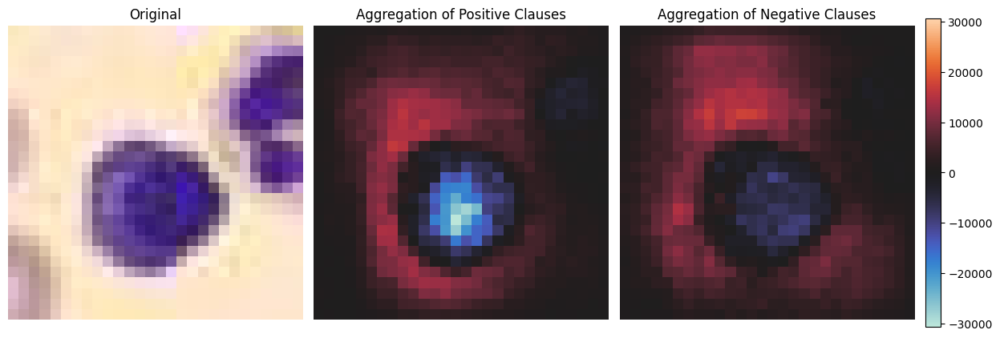

Visualizing sample 3140  |  predicted class: 2
2026-04-10 16:05:04,747 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c3293350>
2026-04-10 16:05:04,776 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c36f58e0>
2026-04-10 16:05:04,804 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f7b28d0>


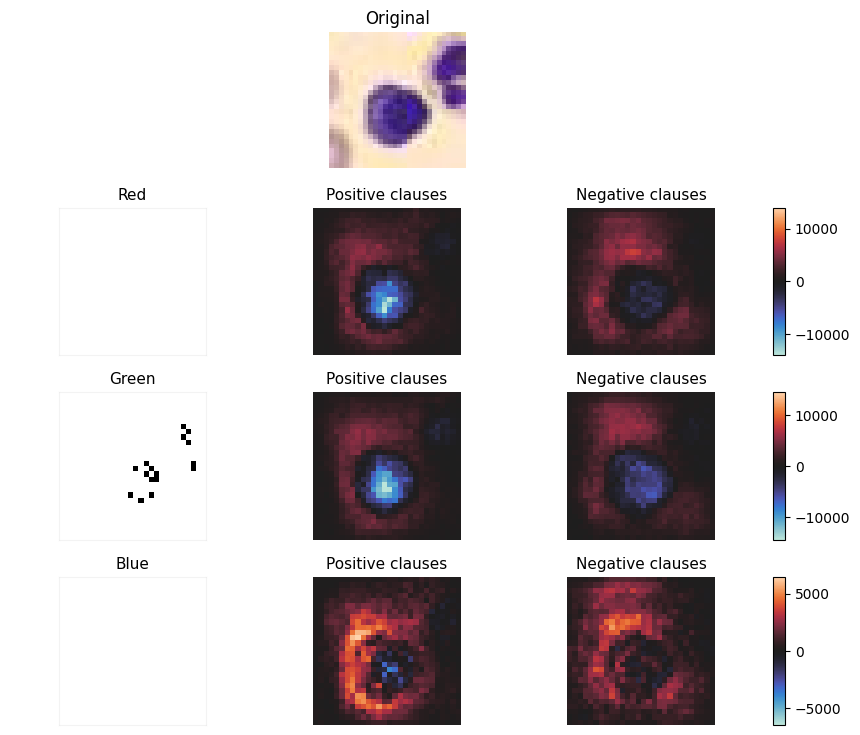

Visualizing sample 3140  |  predicted class: 2
  Channel 0 (Ch0)
2026-04-10 16:05:38,139 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c309c200>
2026-04-10 16:05:38,168 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da61c05640>
2026-04-10 16:05:38,197 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f8dc5f0>
2026-04-10 16:05:38,225 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f7538c0>
2026-04-10 16:05:38,254 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da61c3ffe0>
2026-04-10 16:05:38,281 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f751b80>
2026-04-10 16:05:38,491 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c369d610>
2026-04-10 16:05:38,518 - matplotlib.colorbar - DEBUG - locator: <matplotlib.tick

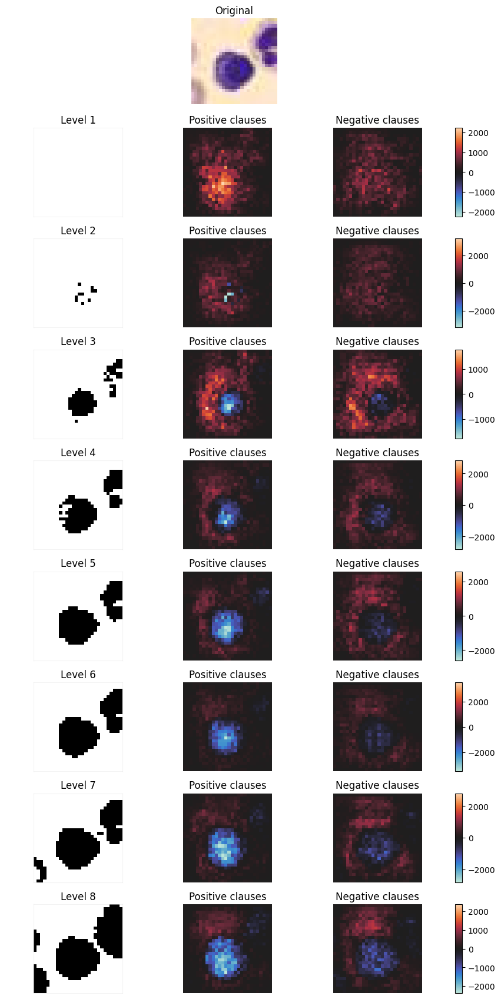

  Channel 1 (Ch1)
2026-04-10 16:05:39,216 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c325aa50>
2026-04-10 16:05:39,243 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c2f1fe00>
2026-04-10 16:05:39,271 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c3516000>
2026-04-10 16:05:39,299 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da409b6e10>
2026-04-10 16:05:39,325 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c351fbf0>
2026-04-10 16:05:39,353 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c3359970>
2026-04-10 16:05:39,380 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da4021d190>
2026-04-10 16:05:39,408 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c819b740>


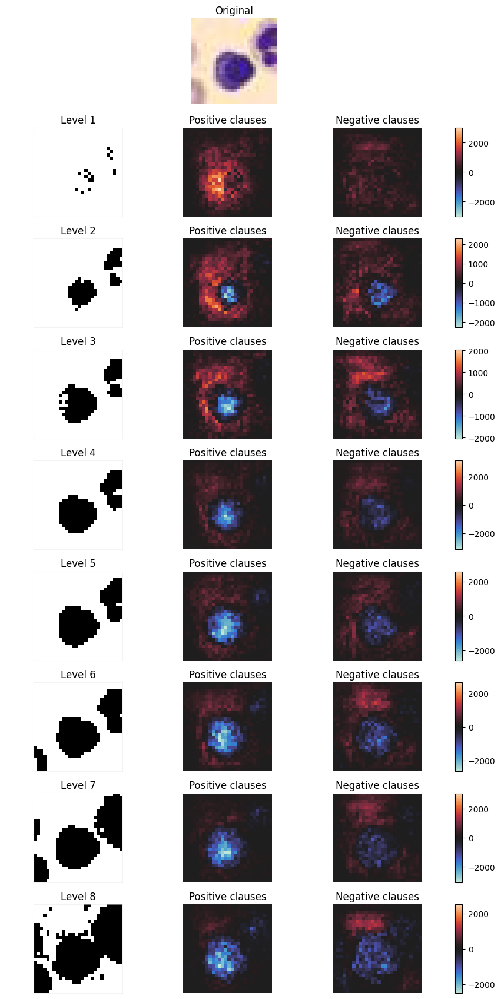

  Channel 2 (Ch2)
2026-04-10 16:05:40,247 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da407fdbe0>
2026-04-10 16:05:40,274 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da402256d0>
2026-04-10 16:05:40,302 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da404d59d0>
2026-04-10 16:05:40,330 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c37a19a0>
2026-04-10 16:05:40,356 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da40926db0>
2026-04-10 16:05:40,383 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da40453080>
2026-04-10 16:05:40,411 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c33e0110>
2026-04-10 16:05:40,439 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c30108c0>


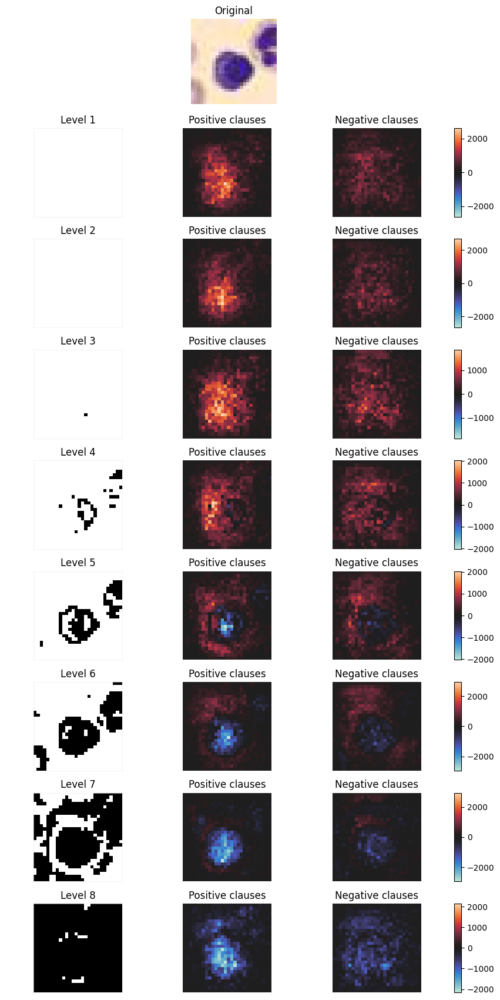

In [21]:
image_index =  3140
target_class = Y_test[image_index]
print(Y_test[image_index])
visualize_aggregated_heatmap(X_test, X_test_org, tm, image_index,
    resolution=8, n_channels=3, image_shape=(28, 28), show_diff=False)
visualize_per_channel_heatmaps(X_test, X_test_org, tm, image_index,
    resolution=8, n_channels=3, image_shape=(28, 28), show_diff=False, channel_names=["Red", "Green", "Blue"])
visualize_per_channel_level_heatmaps(X_test, X_test_org, tm, image_index, 
    resolution=8, n_channels=3, image_shape=(28, 28), show_diff=False)

# Class 3 Local Examples 

In [22]:
# for i in range(3): 
#     print("============================================")
#     image_index = get_correct_sample_index(tm, X_test, Y_test, target_class=3, random=True)
#     print(f"Selected image index: {image_index}")
#     print(f"True class: {Y_test[image_index]}")
#     print(f"Predicted class: {tm.predict(X_test[image_index:image_index+1])[0]}")

3


Visualizing sample 2293  |  predicted class: 3
2026-04-10 16:06:26,430 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da408c9160>
Saved to saved_heatmaps/color_encoding/blood_color_encoding_lh_c3_s2293_aggr.svg


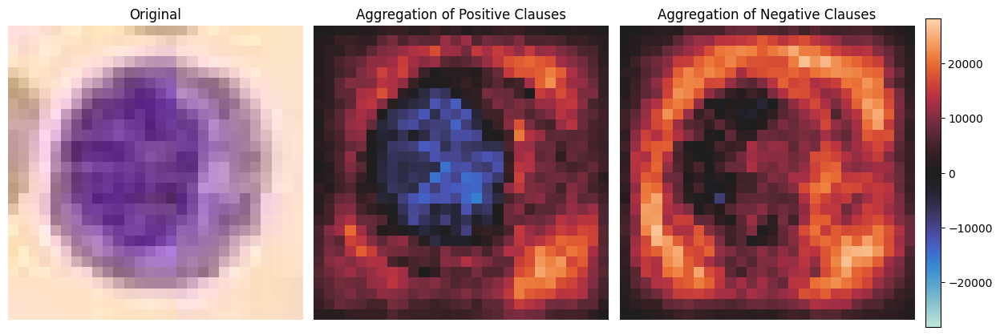

Visualizing sample 2293  |  predicted class: 3
  Channel 0 (Red -)
2026-04-10 16:07:12,838 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c37a3830>
2026-04-10 16:07:12,867 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c315cf50>
2026-04-10 16:07:12,898 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da40277dd0>
2026-04-10 16:07:12,926 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da405cfc50>
2026-04-10 16:07:12,954 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c81319d0>
2026-04-10 16:07:12,982 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c37c3440>
2026-04-10 16:07:13,011 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da4021c080>
2026-04-10 16:07:13,041 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ti

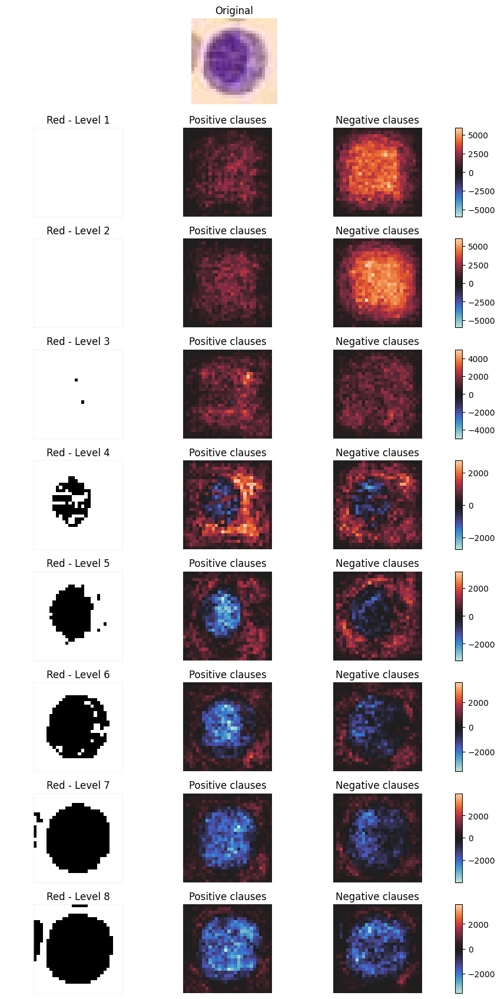

  Channel 1 (Green -)
2026-04-10 16:07:14,574 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c37af1a0>
2026-04-10 16:07:14,738 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c3359520>
2026-04-10 16:07:14,766 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f7de0f0>
2026-04-10 16:07:14,793 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c30e60c0>
2026-04-10 16:07:14,821 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c8117e00>
2026-04-10 16:07:14,848 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c33e1e50>
2026-04-10 16:07:14,876 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da407e69f0>
2026-04-10 16:07:14,904 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f89b800>
  

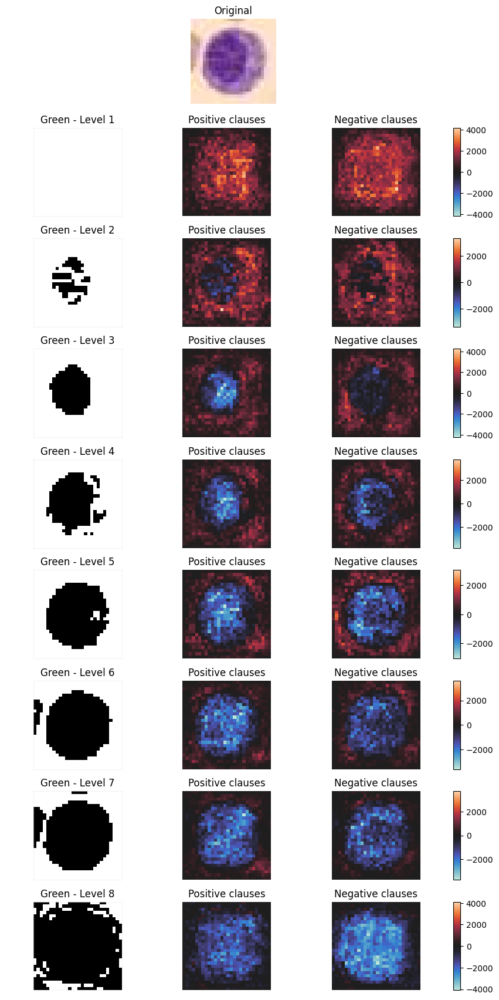

  Channel 2 (Blue -)
2026-04-10 16:07:16,445 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da4057ab70>
2026-04-10 16:07:16,474 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c81b1c10>
2026-04-10 16:07:16,502 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da408a19d0>
2026-04-10 16:07:16,696 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da402dab40>
2026-04-10 16:07:16,724 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c35fa900>
2026-04-10 16:07:16,751 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c3516cc0>
2026-04-10 16:07:16,778 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da4064c620>
2026-04-10 16:07:16,805 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da40329970>
  S

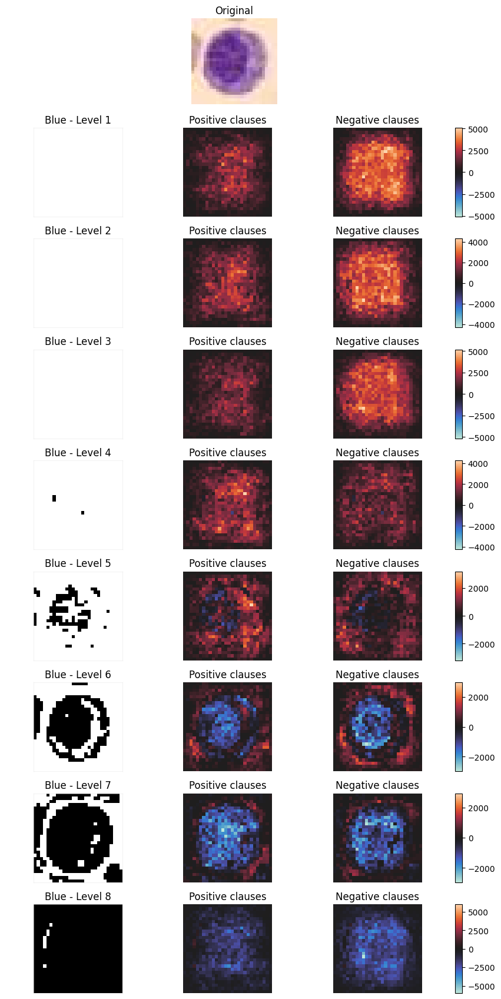

In [23]:
image_index =  2293
target_class = Y_test[image_index]
print(Y_test[image_index])
save_path_aggregated=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.AGGREGATED_HEATMAP, image_index)
visualize_aggregated_heatmap(X_test, X_test_org, tm, image_index,
    resolution= CURRENT_RESOLUTION, n_channels = config.CHANNELS, image_shape=(28, 28), show_diff=False, save_path=save_path_aggregated)

    
save_path_per_channel_r=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_R, image_index)
save_path_per_channel_g=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_G, image_index)
save_path_per_channel_b=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_B, image_index)
visualize_per_channel_level_heatmaps(X_test, X_test_org, tm, image_index,
    resolution= CURRENT_RESOLUTION, n_channels = config.CHANNELS, image_shape=(28, 28), show_diff=False, channel_names=["Red -", "Green -", "Blue -"], save_path=[save_path_per_channel_r, save_path_per_channel_g, save_path_per_channel_b])

3


Visualizing sample 1103  |  predicted class: 3
2026-04-10 16:07:44,130 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c3549e80>
Saved to saved_heatmaps/color_encoding/blood_color_encoding_lh_c3_s1103_aggr.svg


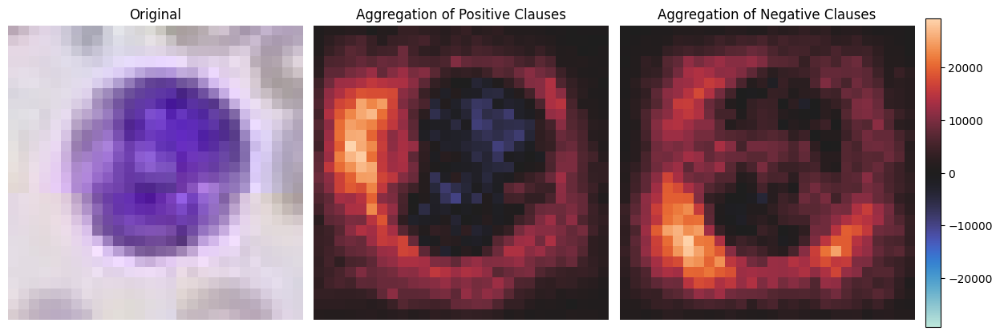

Visualizing sample 1103  |  predicted class: 3
  Channel 0 (Red -)
2026-04-10 16:08:09,318 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f4444d0>
2026-04-10 16:08:09,347 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c3387aa0>
2026-04-10 16:08:09,374 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c305d190>
2026-04-10 16:08:09,402 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c3387c80>
2026-04-10 16:08:09,643 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da402929c0>
2026-04-10 16:08:09,670 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da40290530>
2026-04-10 16:08:09,696 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c81b3560>
2026-04-10 16:08:09,722 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ti

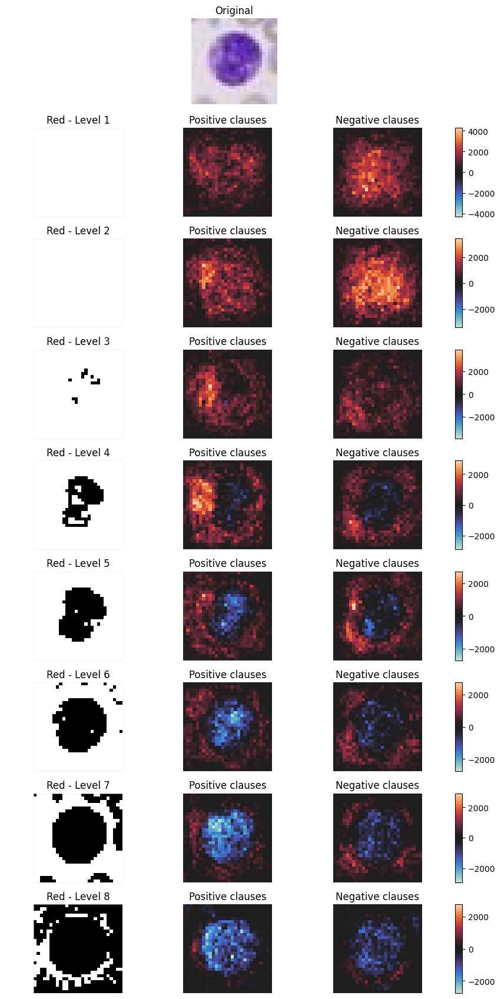

  Channel 1 (Green -)
2026-04-10 16:08:11,218 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da40895490>
2026-04-10 16:08:11,245 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c3293e30>
2026-04-10 16:08:11,273 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f8e3470>
2026-04-10 16:08:11,301 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f82d550>
2026-04-10 16:08:11,328 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c8181820>
2026-04-10 16:08:11,356 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da405ce3c0>
2026-04-10 16:08:11,382 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c3507fb0>
2026-04-10 16:08:11,528 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c34549b0>
  

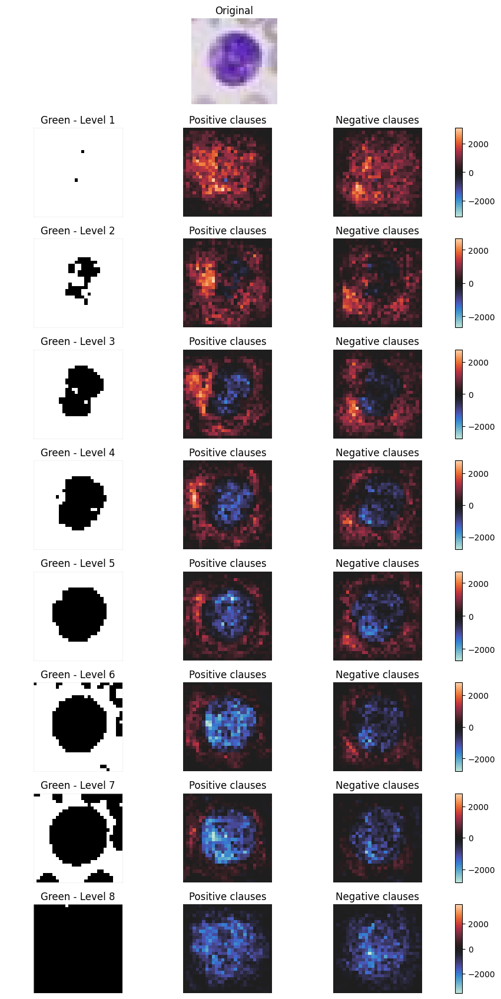

  Channel 2 (Blue -)
2026-04-10 16:08:13,011 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c3787470>
2026-04-10 16:08:13,038 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da404fdaf0>
2026-04-10 16:08:13,065 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c347ed80>
2026-04-10 16:08:13,092 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c37c1e50>
2026-04-10 16:08:13,119 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c309ec90>
2026-04-10 16:08:13,146 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c309cbc0>
2026-04-10 16:08:13,173 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c2f012b0>
2026-04-10 16:08:13,200 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c3382960>
  S

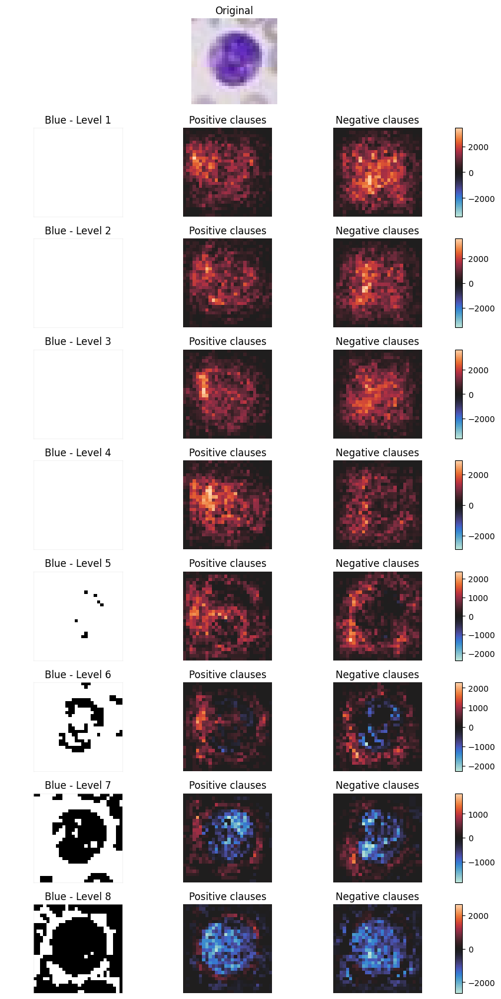

In [24]:
image_index =  1103
target_class = Y_test[image_index]
print(Y_test[image_index])
save_path_aggregated=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.AGGREGATED_HEATMAP, image_index)
visualize_aggregated_heatmap(X_test, X_test_org, tm, image_index,
    resolution= CURRENT_RESOLUTION, n_channels = config.CHANNELS, image_shape=(28, 28), show_diff=False, save_path=save_path_aggregated)

    
save_path_per_channel_r=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_R, image_index)
save_path_per_channel_g=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_G, image_index)
save_path_per_channel_b=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_B, image_index)
visualize_per_channel_level_heatmaps(X_test, X_test_org, tm, image_index,
    resolution= CURRENT_RESOLUTION, n_channels = config.CHANNELS, image_shape=(28, 28), show_diff=False, channel_names=["Red -", "Green -", "Blue -"], save_path=[save_path_per_channel_r, save_path_per_channel_g, save_path_per_channel_b])

3


Visualizing sample 1936  |  predicted class: 3
2026-04-10 16:09:02,731 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c354e690>
Saved to saved_heatmaps/color_encoding/blood_color_encoding_lh_c3_s1936_aggr.svg


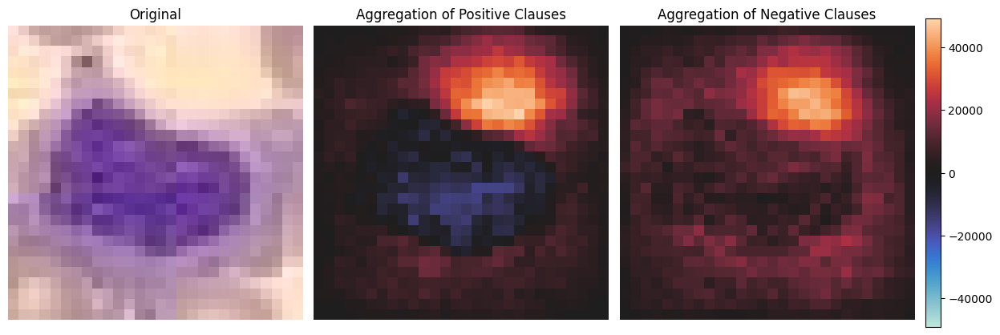

Visualizing sample 1936  |  predicted class: 3
  Channel 0 (Red -)
2026-04-10 16:09:50,901 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da409f7140>
2026-04-10 16:09:50,928 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da403e9280>
2026-04-10 16:09:50,955 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c2f1edb0>
2026-04-10 16:09:50,983 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f544200>
2026-04-10 16:09:51,010 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c36f6930>
2026-04-10 16:09:51,037 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da40225fd0>
2026-04-10 16:09:51,064 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da409268a0>
2026-04-10 16:09:51,090 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ti

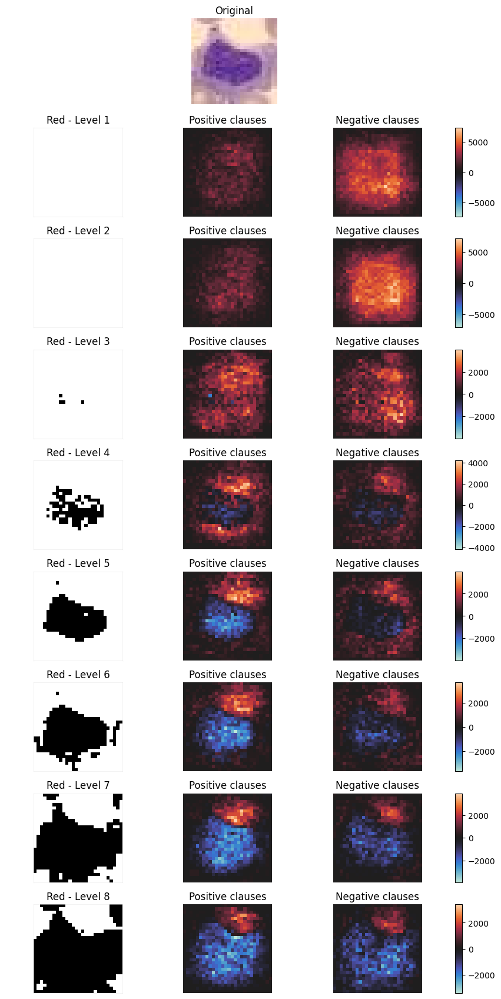

  Channel 1 (Green -)
2026-04-10 16:09:52,707 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da4094f560>
2026-04-10 16:09:52,734 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da4064d040>
2026-04-10 16:09:52,761 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c310cc50>
2026-04-10 16:09:52,789 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c2fbf8c0>
2026-04-10 16:09:52,818 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da677e7cb0>
2026-04-10 16:09:52,845 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da40521490>
2026-04-10 16:09:52,871 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da40520bc0>
2026-04-10 16:09:52,898 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c3291400>
  

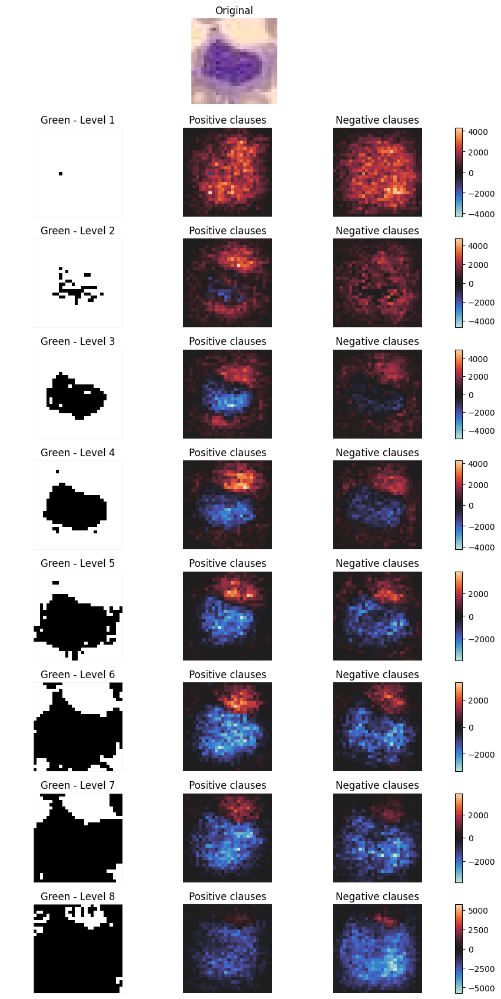

  Channel 2 (Blue -)
2026-04-10 16:09:54,452 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c3384ad0>
2026-04-10 16:09:54,479 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da4057bb60>
2026-04-10 16:09:54,507 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da408a1b80>
2026-04-10 16:09:54,685 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c3384620>
2026-04-10 16:09:54,713 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da40a2b7d0>
2026-04-10 16:09:54,740 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da61c73500>
2026-04-10 16:09:54,766 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c368d9a0>
2026-04-10 16:09:54,792 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c30e4cb0>
  S

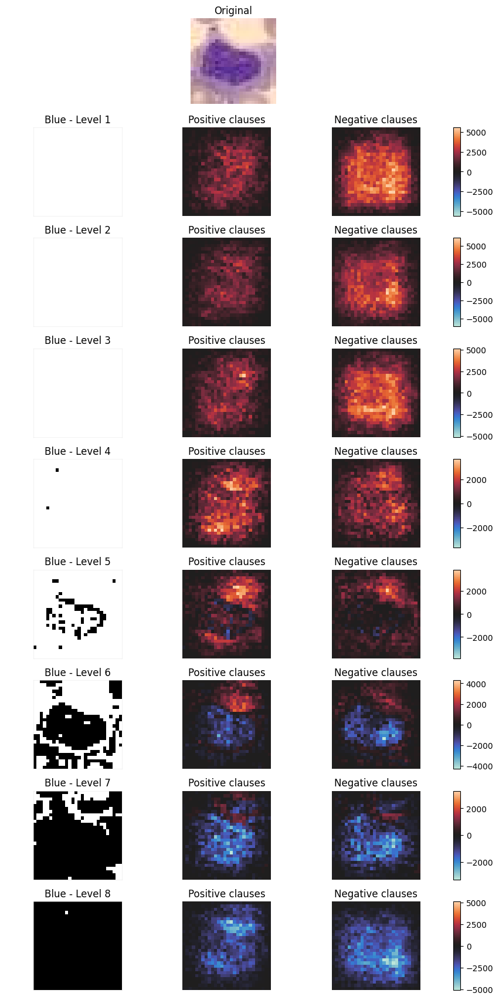

In [25]:
image_index =  1936
target_class = Y_test[image_index]
print(Y_test[image_index])
save_path_aggregated=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.AGGREGATED_HEATMAP, image_index)
visualize_aggregated_heatmap(X_test, X_test_org, tm, image_index,
    resolution= CURRENT_RESOLUTION, n_channels = config.CHANNELS, image_shape=(28, 28), show_diff=False, save_path=save_path_aggregated)

    
save_path_per_channel_r=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_R, image_index)
save_path_per_channel_g=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_G, image_index)
save_path_per_channel_b=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_B, image_index)
visualize_per_channel_level_heatmaps(X_test, X_test_org, tm, image_index,
    resolution= CURRENT_RESOLUTION, n_channels = config.CHANNELS, image_shape=(28, 28), show_diff=False, channel_names=["Red -", "Green -", "Blue -"], save_path=[save_path_per_channel_r, save_path_per_channel_g, save_path_per_channel_b])

# Class 4 Local Examples 

In [26]:
# for i in range(3): 
#     print("============================================")
#     image_index = get_correct_sample_index(tm, X_test, Y_test, target_class=4, random=True)
#     print(f"Selected image index: {image_index}")
#     print(f"True class: {Y_test[image_index]}")
#     print(f"Predicted class: {tm.predict(X_test[image_index:image_index+1])[0]}")

4


Visualizing sample 2055  |  predicted class: 4
2026-04-10 16:10:36,736 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c3237c50>
Saved to saved_heatmaps/color_encoding/blood_color_encoding_lh_c4_s2055_aggr.svg


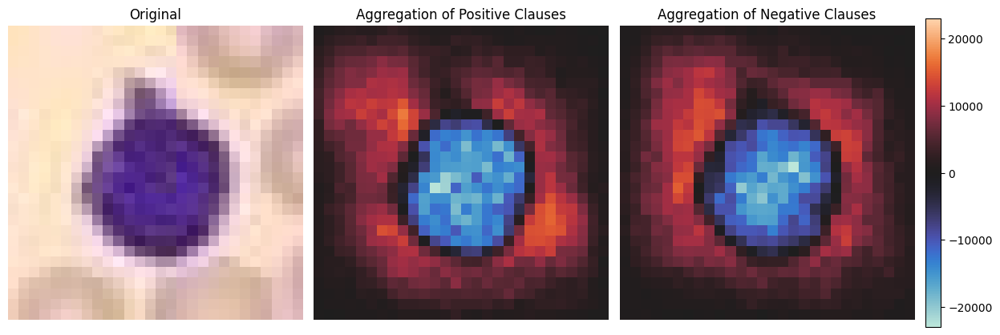

Visualizing sample 2055  |  predicted class: 4
  Channel 0 (Red -)
2026-04-10 16:11:16,245 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c2fbd310>
2026-04-10 16:11:16,274 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c34a04d0>
2026-04-10 16:11:16,303 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c36774d0>
2026-04-10 16:11:16,331 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f547710>
2026-04-10 16:11:16,575 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da403ab380>
2026-04-10 16:11:16,602 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da405780b0>
2026-04-10 16:11:16,629 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da409e1190>
2026-04-10 16:11:16,656 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ti

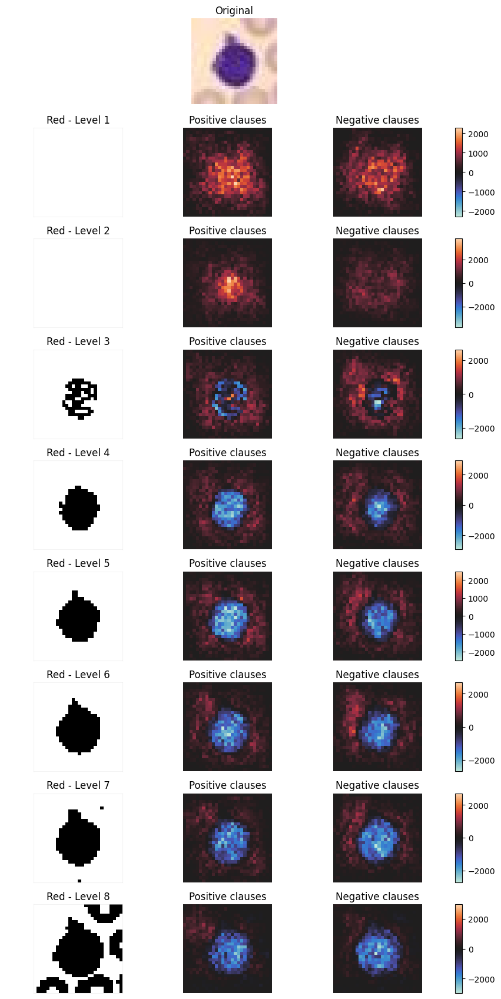

  Channel 1 (Green -)
2026-04-10 16:11:18,181 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da40317350>
2026-04-10 16:11:18,209 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c35a5880>
2026-04-10 16:11:18,237 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c335a4e0>
2026-04-10 16:11:18,264 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da408fa5d0>
2026-04-10 16:11:18,292 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c364b170>
2026-04-10 16:11:18,320 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da402919d0>
2026-04-10 16:11:18,511 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f376ff0>
2026-04-10 16:11:18,539 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f763890>
  

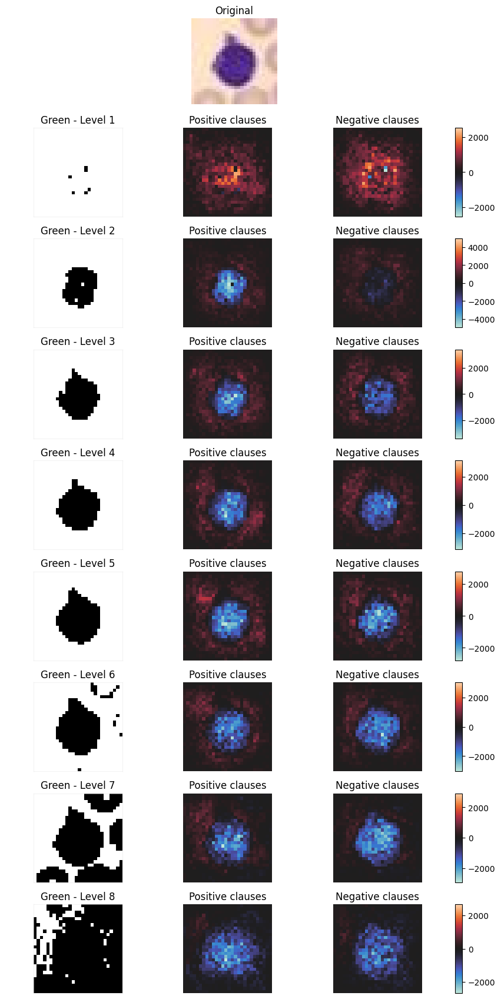

  Channel 2 (Blue -)
2026-04-10 16:11:20,026 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c34db2f0>
2026-04-10 16:11:20,054 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da40951910>
2026-04-10 16:11:20,080 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f4a9010>
2026-04-10 16:11:20,108 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c3505550>
2026-04-10 16:11:20,135 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c3455520>
2026-04-10 16:11:20,162 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c30e4f80>
2026-04-10 16:11:20,190 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c307eb40>
2026-04-10 16:11:20,217 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da404fca10>
  S

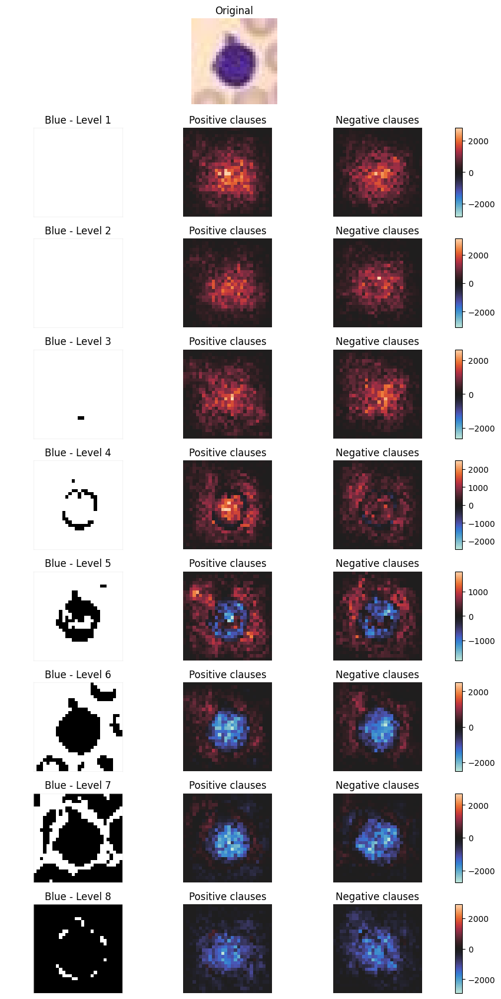

In [27]:
image_index =  2055
target_class = Y_test[image_index]
print(Y_test[image_index])
save_path_aggregated=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.AGGREGATED_HEATMAP, image_index)
visualize_aggregated_heatmap(X_test, X_test_org, tm, image_index,
    resolution= CURRENT_RESOLUTION, n_channels = config.CHANNELS, image_shape=(28, 28), show_diff=False, save_path=save_path_aggregated)

    
save_path_per_channel_r=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_R, image_index)
save_path_per_channel_g=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_G, image_index)
save_path_per_channel_b=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_B, image_index)
visualize_per_channel_level_heatmaps(X_test, X_test_org, tm, image_index,
    resolution= CURRENT_RESOLUTION, n_channels = config.CHANNELS, image_shape=(28, 28), show_diff=False, channel_names=["Red -", "Green -", "Blue -"], save_path=[save_path_per_channel_r, save_path_per_channel_g, save_path_per_channel_b])

4
Visualizing sample 1728  |  predicted class: 4
2026-04-10 16:11:55,576 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c36e8c50>
Saved to saved_heatmaps/color_encoding/blood_color_encoding_lh_c4_s1728_aggr.svg


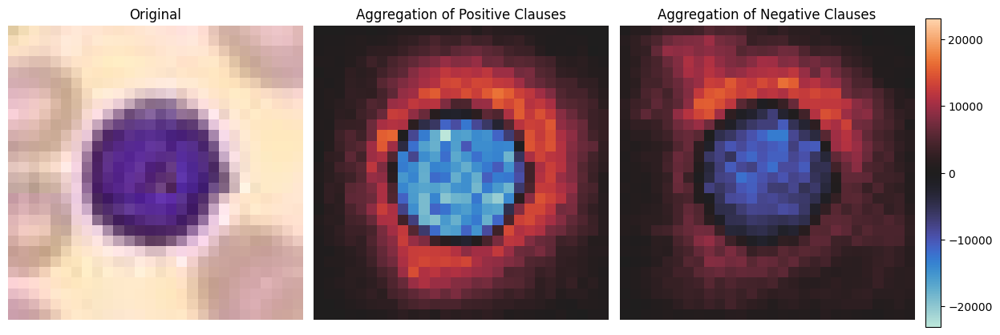

Visualizing sample 1728  |  predicted class: 4
  Channel 0 (Red -)
2026-04-10 16:12:29,487 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f3c1e50>
2026-04-10 16:12:29,516 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c307dac0>
2026-04-10 16:12:29,544 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f3c1f70>
2026-04-10 16:12:29,572 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f725310>
2026-04-10 16:12:29,600 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da401fdca0>
2026-04-10 16:12:29,628 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f8d60f0>
2026-04-10 16:12:29,657 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da40521010>
2026-04-10 16:12:29,685 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ti

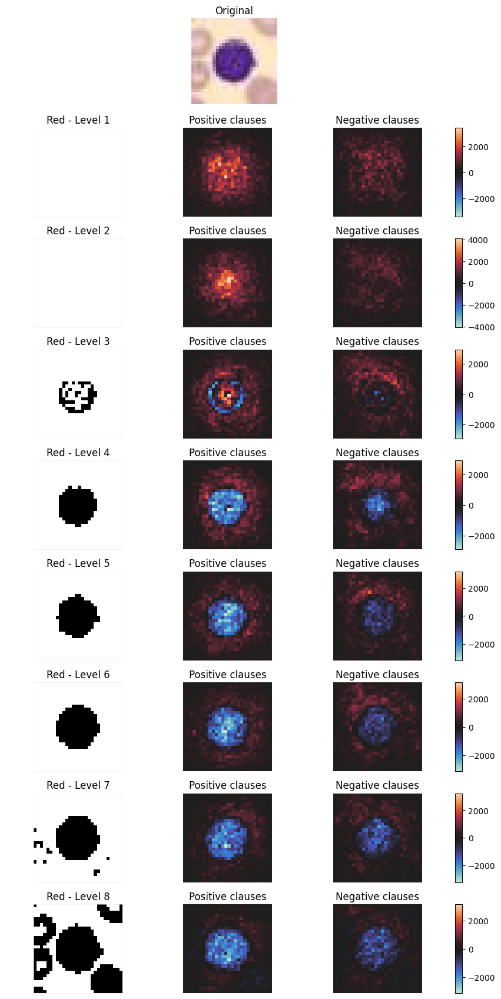

  Channel 1 (Green -)
2026-04-10 16:12:31,336 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da40a2b380>
2026-04-10 16:12:31,364 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c305e990>
2026-04-10 16:12:31,392 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c315e210>
2026-04-10 16:12:31,420 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da4094c3e0>
2026-04-10 16:12:31,447 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c3742ae0>
2026-04-10 16:12:31,476 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f6c7dd0>
2026-04-10 16:12:31,503 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da40293500>
2026-04-10 16:12:31,532 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f5a66c0>
  

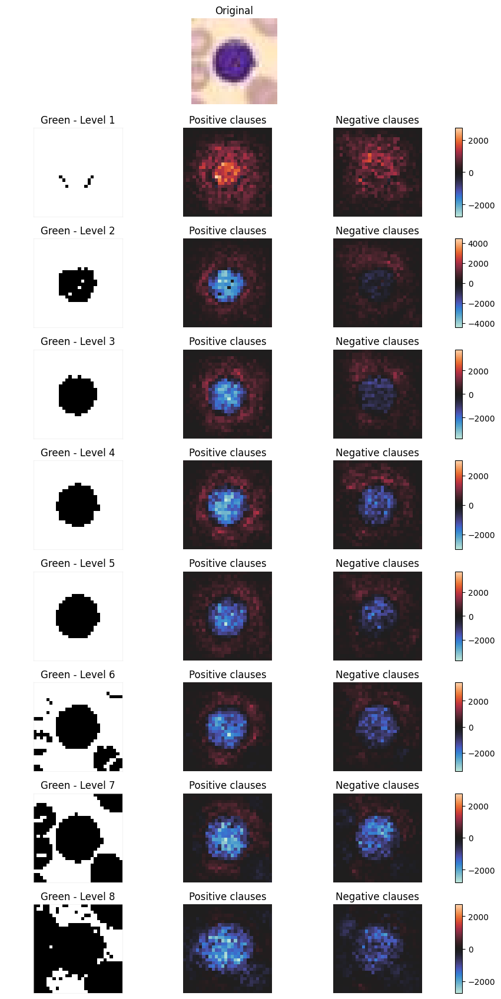

  Channel 2 (Blue -)
2026-04-10 16:12:33,042 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f42aff0>
2026-04-10 16:12:33,069 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c30e7ef0>
2026-04-10 16:12:33,265 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c364ce30>
2026-04-10 16:12:33,292 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f429a90>
2026-04-10 16:12:33,320 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f7871d0>
2026-04-10 16:12:33,347 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c347d130>
2026-04-10 16:12:33,374 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da61c3fb00>
2026-04-10 16:12:33,402 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c8131c10>
  S

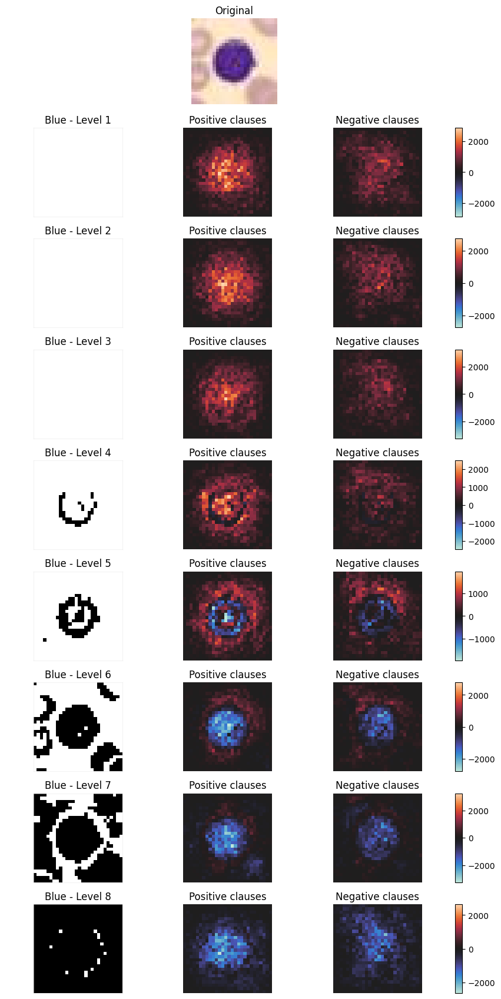

In [28]:
image_index =  1728
target_class = Y_test[image_index]
print(Y_test[image_index])
save_path_aggregated=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.AGGREGATED_HEATMAP, image_index)
visualize_aggregated_heatmap(X_test, X_test_org, tm, image_index,
    resolution= CURRENT_RESOLUTION, n_channels = config.CHANNELS, image_shape=(28, 28), show_diff=False, save_path=save_path_aggregated)

    
save_path_per_channel_r=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_R, image_index)
save_path_per_channel_g=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_G, image_index)
save_path_per_channel_b=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_B, image_index)
visualize_per_channel_level_heatmaps(X_test, X_test_org, tm, image_index,
    resolution= CURRENT_RESOLUTION, n_channels = config.CHANNELS, image_shape=(28, 28), show_diff=False, channel_names=["Red -", "Green -", "Blue -"], save_path=[save_path_per_channel_r, save_path_per_channel_g, save_path_per_channel_b])

4
Visualizing sample 1892  |  predicted class: 4
2026-04-10 16:13:13,940 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da408f88c0>
Saved to saved_heatmaps/color_encoding/blood_color_encoding_lh_c4_s1892_aggr.svg


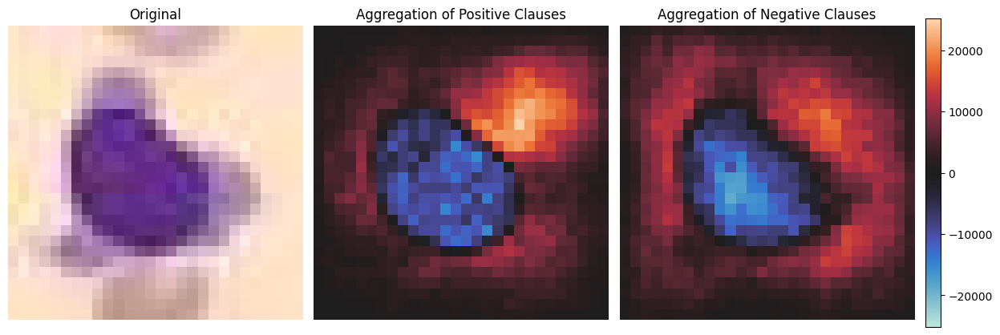

Visualizing sample 1892  |  predicted class: 4
  Channel 0 (Red -)
2026-04-10 16:13:53,534 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f86f0b0>
2026-04-10 16:13:53,563 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da401a8d40>
2026-04-10 16:13:53,591 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c32379e0>
2026-04-10 16:13:53,861 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da94746750>
2026-04-10 16:13:53,890 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f94d9a0>
2026-04-10 16:13:53,919 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c333c290>
2026-04-10 16:13:53,948 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f429a00>
2026-04-10 16:13:53,978 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ti

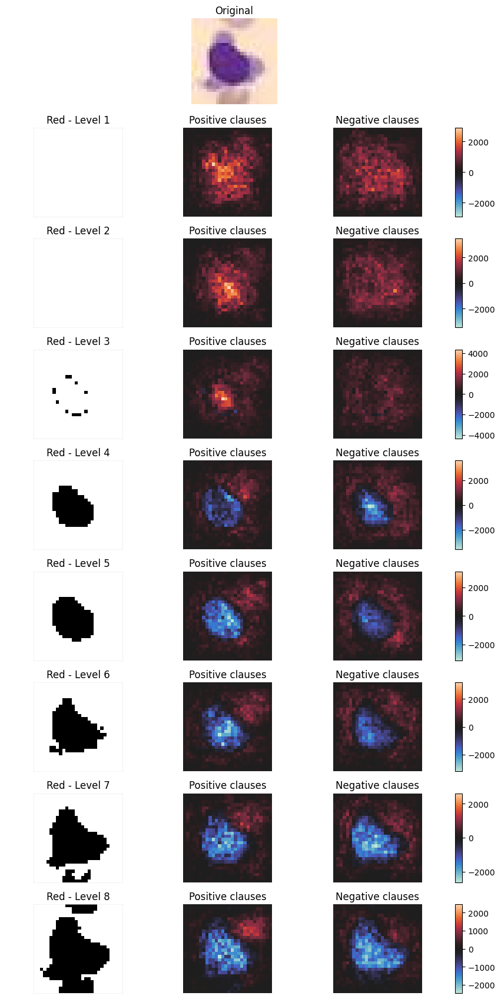

  Channel 1 (Green -)
2026-04-10 16:13:55,504 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c3024d10>
2026-04-10 16:13:55,532 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da40a48b00>
2026-04-10 16:13:55,560 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c347d940>
2026-04-10 16:13:55,587 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f7a6180>
2026-04-10 16:13:55,615 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c36482f0>
2026-04-10 16:13:55,643 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c369ea20>
2026-04-10 16:13:55,795 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c2e4e510>
2026-04-10 16:13:55,823 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f375d00>
  

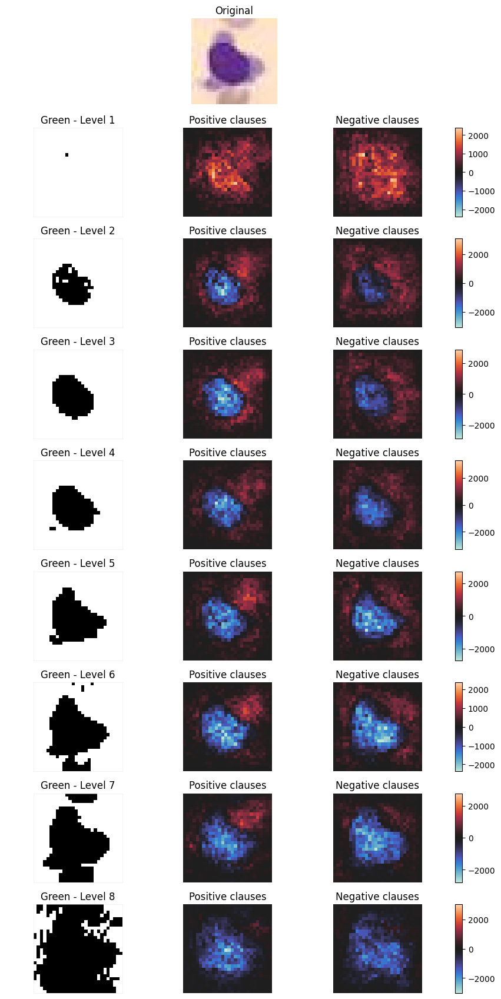

  Channel 2 (Blue -)
2026-04-10 16:13:57,338 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da408a2720>
2026-04-10 16:13:57,367 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da407d4fb0>
2026-04-10 16:13:57,395 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da405a5b20>
2026-04-10 16:13:57,423 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c8130110>
2026-04-10 16:13:57,451 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da61c05f10>
2026-04-10 16:13:57,478 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c30b6780>
2026-04-10 16:13:57,506 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c3293a10>
2026-04-10 16:13:57,534 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da4064f560>
  S

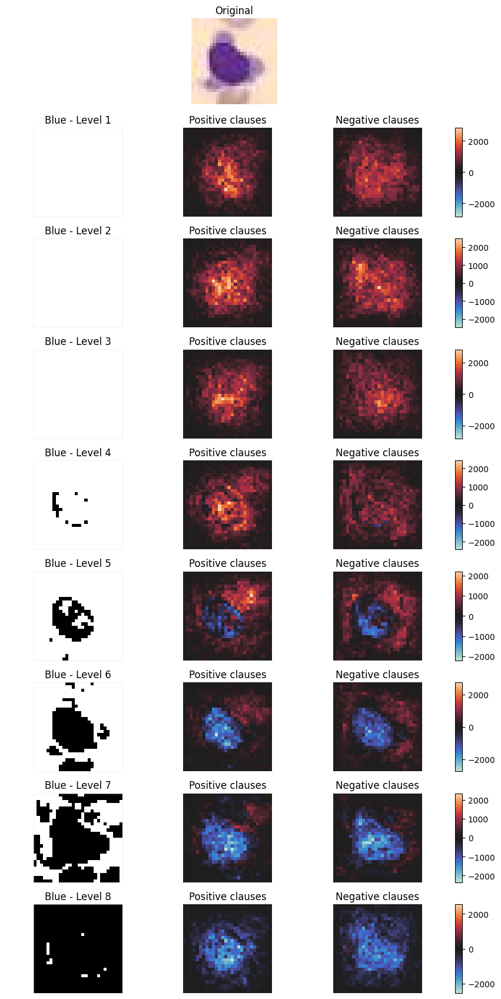

In [29]:
image_index =  1892
target_class = Y_test[image_index]
print(Y_test[image_index])
save_path_aggregated=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.AGGREGATED_HEATMAP, image_index)
visualize_aggregated_heatmap(X_test, X_test_org, tm, image_index,
    resolution= CURRENT_RESOLUTION, n_channels = config.CHANNELS, image_shape=(28, 28), show_diff=False, save_path=save_path_aggregated)

    
save_path_per_channel_r=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_R, image_index)
save_path_per_channel_g=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_G, image_index)
save_path_per_channel_b=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_B, image_index)
visualize_per_channel_level_heatmaps(X_test, X_test_org, tm, image_index,
    resolution= CURRENT_RESOLUTION, n_channels = config.CHANNELS, image_shape=(28, 28), show_diff=False, channel_names=["Red -", "Green -", "Blue -"], save_path=[save_path_per_channel_r, save_path_per_channel_g, save_path_per_channel_b])

# Class 5 Local Examples 

In [30]:
# for i in range(3): 
#     print("============================================")
#     image_index = get_correct_sample_index(tm, X_test, Y_test, target_class=5, random=True)
#     print(f"Selected image index: {image_index}")
#     print(f"True class: {Y_test[image_index]}")
#     print(f"Predicted class: {tm.predict(X_test[image_index:image_index+1])[0]}")

5
Visualizing sample 1102  |  predicted class: 5
2026-04-10 16:14:33,197 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da4024ee40>
Saved to saved_heatmaps/color_encoding/blood_color_encoding_lh_c5_s1102_aggr.svg


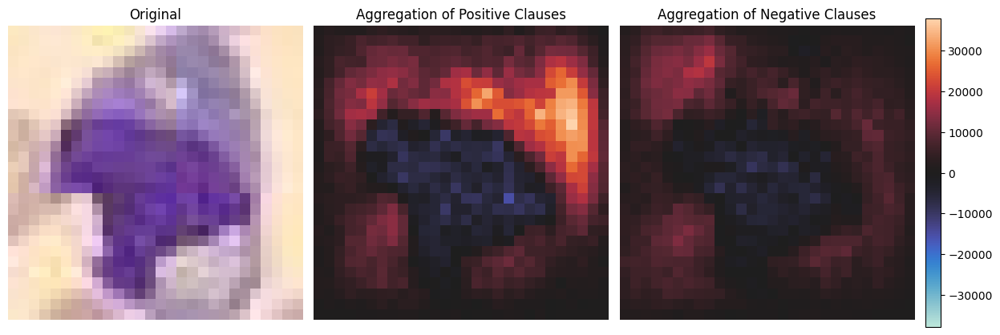

Visualizing sample 1102  |  predicted class: 5
  Channel 0 (Red -)
2026-04-10 16:15:07,619 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c3631b20>
2026-04-10 16:15:07,648 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da409cbb60>
2026-04-10 16:15:07,677 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da40951910>
2026-04-10 16:15:07,706 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da409c9250>
2026-04-10 16:15:07,735 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c34543e0>
2026-04-10 16:15:07,762 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c3235c10>
2026-04-10 16:15:07,790 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da406d7c50>
2026-04-10 16:15:07,818 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ti

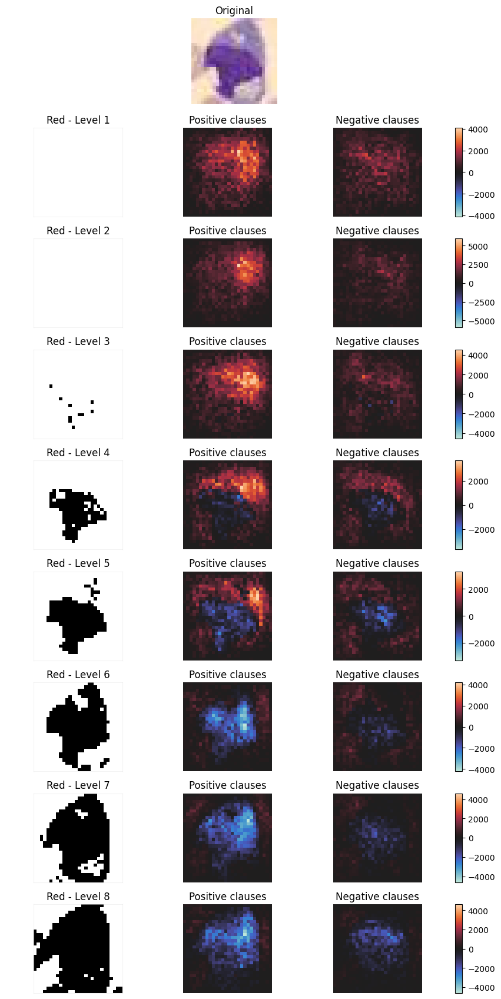

  Channel 1 (Green -)
2026-04-10 16:15:09,564 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c2e73e00>
2026-04-10 16:15:09,591 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da407d5a00>
2026-04-10 16:15:09,618 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c351f410>
2026-04-10 16:15:09,646 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f82d520>
2026-04-10 16:15:09,673 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c34dac00>
2026-04-10 16:15:09,700 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da40724fb0>
2026-04-10 16:15:09,728 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f725580>
2026-04-10 16:15:09,755 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da409e2810>
  

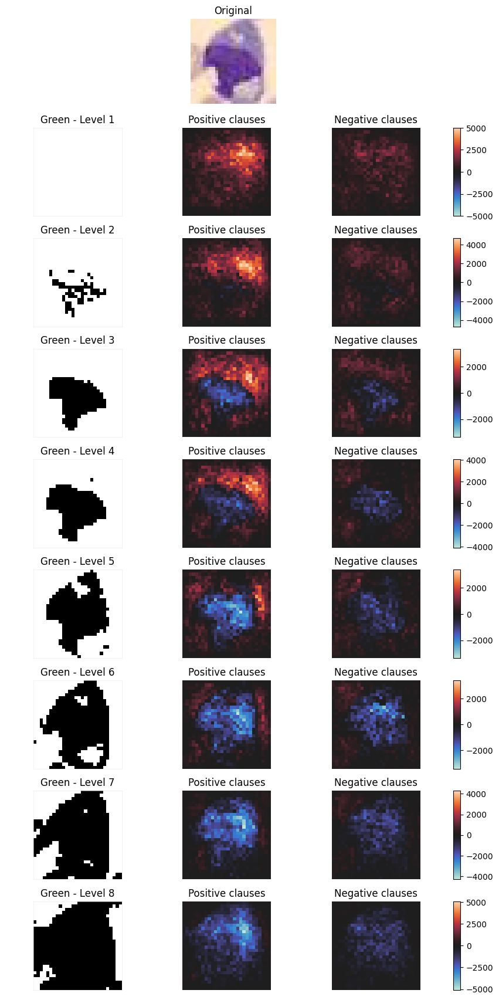

  Channel 2 (Blue -)
2026-04-10 16:15:11,322 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da4057b440>
2026-04-10 16:15:11,350 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c814a630>
2026-04-10 16:15:11,535 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c8149790>
2026-04-10 16:15:11,563 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da61cc6030>
2026-04-10 16:15:11,591 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c315f050>
2026-04-10 16:15:11,619 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da404fd520>
2026-04-10 16:15:11,646 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da40a55fd0>
2026-04-10 16:15:11,674 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c2f03bc0>
  S

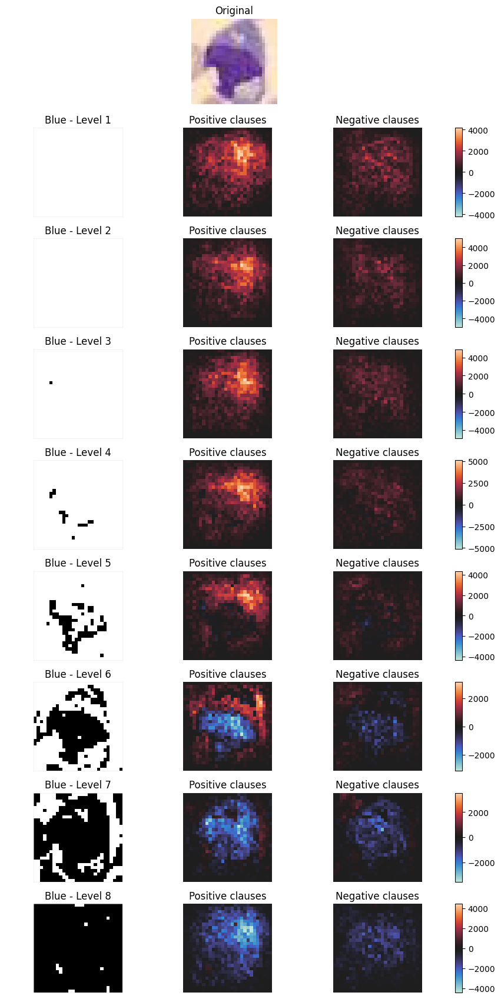

In [31]:
image_index =  1102
target_class = Y_test[image_index]
print(Y_test[image_index])
save_path_aggregated=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.AGGREGATED_HEATMAP, image_index)
visualize_aggregated_heatmap(X_test, X_test_org, tm, image_index,
    resolution= CURRENT_RESOLUTION, n_channels = config.CHANNELS, image_shape=(28, 28), show_diff=False, save_path=save_path_aggregated)

    
save_path_per_channel_r=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_R, image_index)
save_path_per_channel_g=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_G, image_index)
save_path_per_channel_b=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_B, image_index)
visualize_per_channel_level_heatmaps(X_test, X_test_org, tm, image_index,
    resolution= CURRENT_RESOLUTION, n_channels = config.CHANNELS, image_shape=(28, 28), show_diff=False, channel_names=["Red -", "Green -", "Blue -"], save_path=[save_path_per_channel_r, save_path_per_channel_g, save_path_per_channel_b])

5


Visualizing sample 1599  |  predicted class: 5
2026-04-10 16:15:51,045 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f8e37a0>
Saved to saved_heatmaps/color_encoding/blood_color_encoding_lh_c5_s1599_aggr.svg


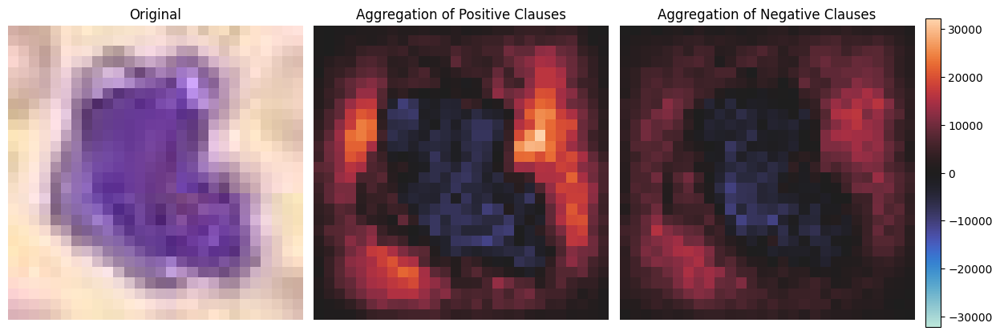

Visualizing sample 1599  |  predicted class: 5
  Channel 0 (Red -)
2026-04-10 16:16:29,570 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c3385100>
2026-04-10 16:16:29,597 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da408533b0>
2026-04-10 16:16:29,625 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da402b16d0>
2026-04-10 16:16:29,851 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da4094e9f0>
2026-04-10 16:16:29,878 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da40293410>
2026-04-10 16:16:29,905 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c8116f90>
2026-04-10 16:16:29,932 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da40a55610>
2026-04-10 16:16:29,959 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ti

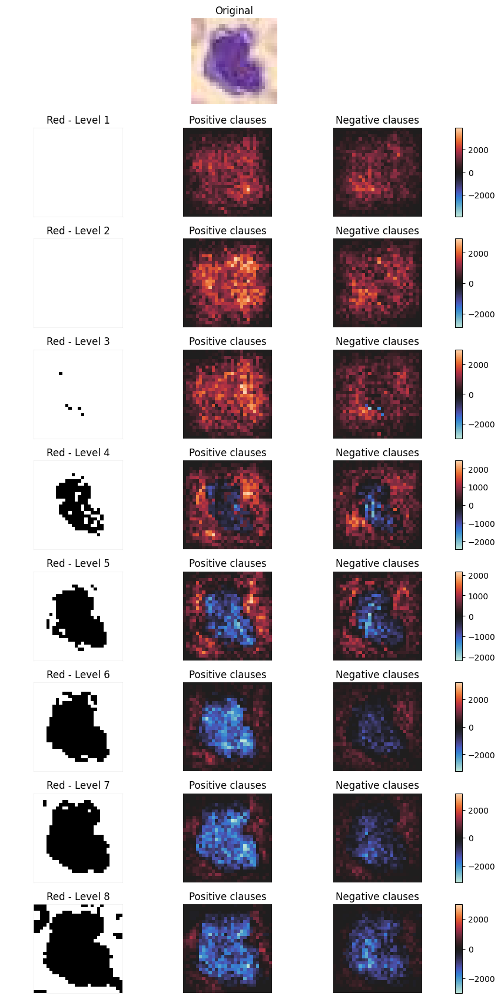

  Channel 1 (Green -)
2026-04-10 16:16:31,533 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c305d7f0>
2026-04-10 16:16:31,561 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c34d9c10>
2026-04-10 16:16:31,588 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c34a3bc0>
2026-04-10 16:16:31,615 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f7535c0>
2026-04-10 16:16:31,642 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c335f200>
2026-04-10 16:16:31,795 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c2e23fe0>
2026-04-10 16:16:31,829 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f726a80>
2026-04-10 16:16:31,855 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c30b7b30>
  

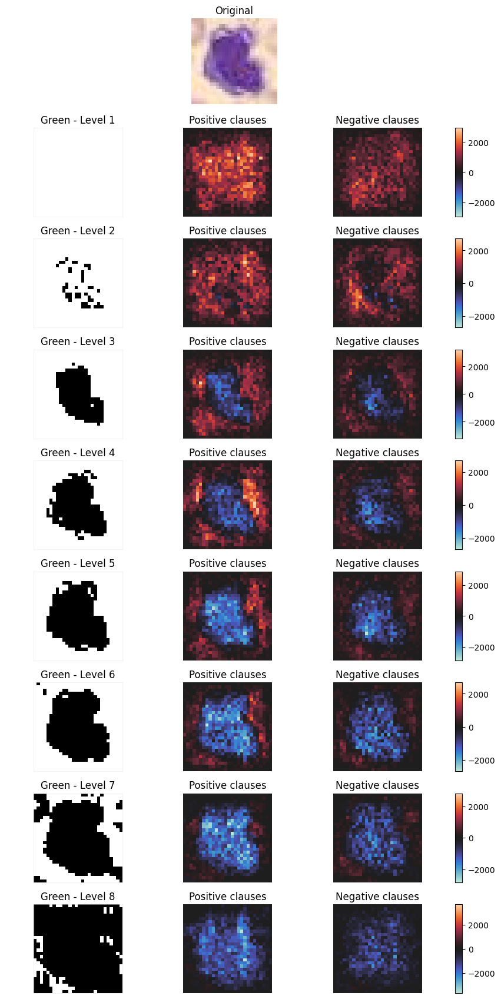

  Channel 2 (Blue -)
2026-04-10 16:16:33,440 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f42b530>
2026-04-10 16:16:33,467 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f753ef0>
2026-04-10 16:16:33,495 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c2fbf680>
2026-04-10 16:16:33,522 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da4057b440>
2026-04-10 16:16:33,551 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c347cef0>
2026-04-10 16:16:33,579 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da401fc7a0>
2026-04-10 16:16:33,610 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c364f470>
2026-04-10 16:16:33,637 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da40274e30>
  S

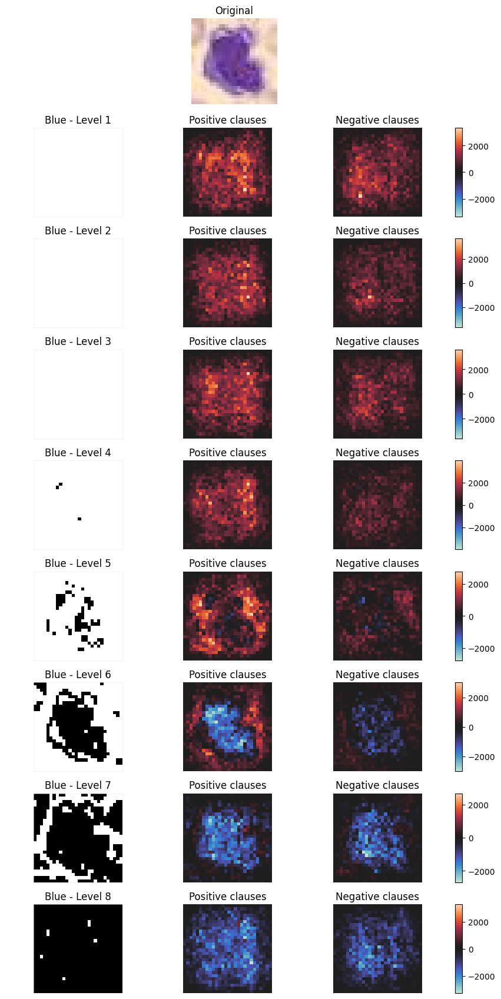

In [32]:
image_index =  1599
target_class = Y_test[image_index]
print(Y_test[image_index])
save_path_aggregated=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.AGGREGATED_HEATMAP, image_index)
visualize_aggregated_heatmap(X_test, X_test_org, tm, image_index,
    resolution= CURRENT_RESOLUTION, n_channels = config.CHANNELS, image_shape=(28, 28), show_diff=False, save_path=save_path_aggregated)

    
save_path_per_channel_r=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_R, image_index)
save_path_per_channel_g=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_G, image_index)
save_path_per_channel_b=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_B, image_index)
visualize_per_channel_level_heatmaps(X_test, X_test_org, tm, image_index,
    resolution= CURRENT_RESOLUTION, n_channels = config.CHANNELS, image_shape=(28, 28), show_diff=False, channel_names=["Red -", "Green -", "Blue -"], save_path=[save_path_per_channel_r, save_path_per_channel_g, save_path_per_channel_b])

5


Visualizing sample 754  |  predicted class: 5
2026-04-10 16:17:24,556 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da4067dd60>
Saved to saved_heatmaps/color_encoding/blood_color_encoding_lh_c5_s754_aggr.svg


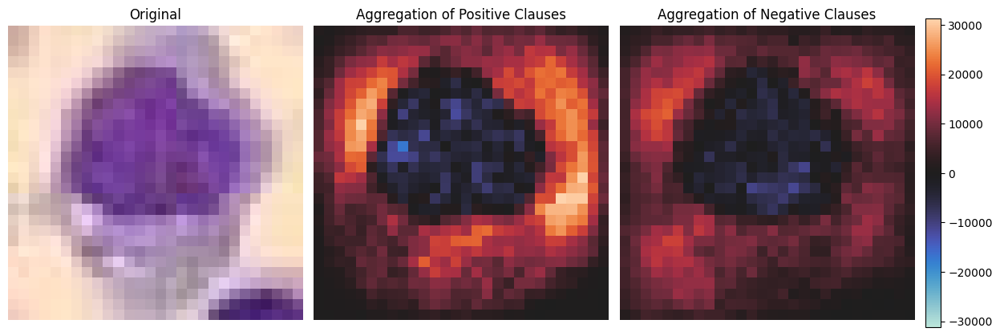

Visualizing sample 754  |  predicted class: 5
  Channel 0 (Red -)
2026-04-10 16:18:13,655 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c8114950>
2026-04-10 16:18:13,684 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da8c0b1130>
2026-04-10 16:18:13,712 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da61cc5400>
2026-04-10 16:18:13,741 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c30266c0>
2026-04-10 16:18:13,770 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c3259bb0>
2026-04-10 16:18:13,798 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f3ece30>
2026-04-10 16:18:13,827 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da403aa4b0>
2026-04-10 16:18:13,856 - matplotlib.colorbar - DEBUG - locator: <matplotlib.tic

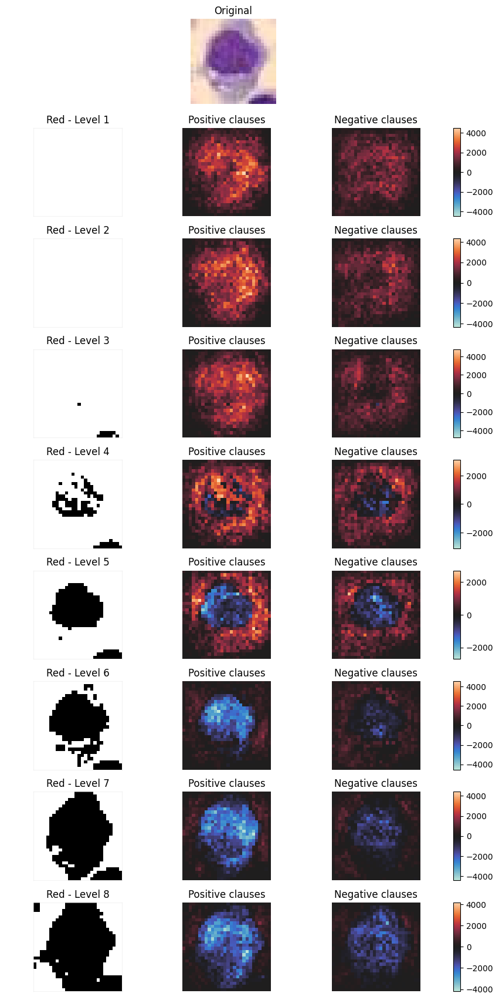

  Channel 1 (Green -)
2026-04-10 16:18:15,588 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da4094dcd0>
2026-04-10 16:18:15,615 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da409f7b00>
2026-04-10 16:18:15,643 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da402f5910>
2026-04-10 16:18:15,670 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da403eb770>
2026-04-10 16:18:15,697 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da40441ee0>
2026-04-10 16:18:15,726 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da407e7b30>
2026-04-10 16:18:15,754 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da4064c2c0>
2026-04-10 16:18:15,781 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c368c0e0>
  

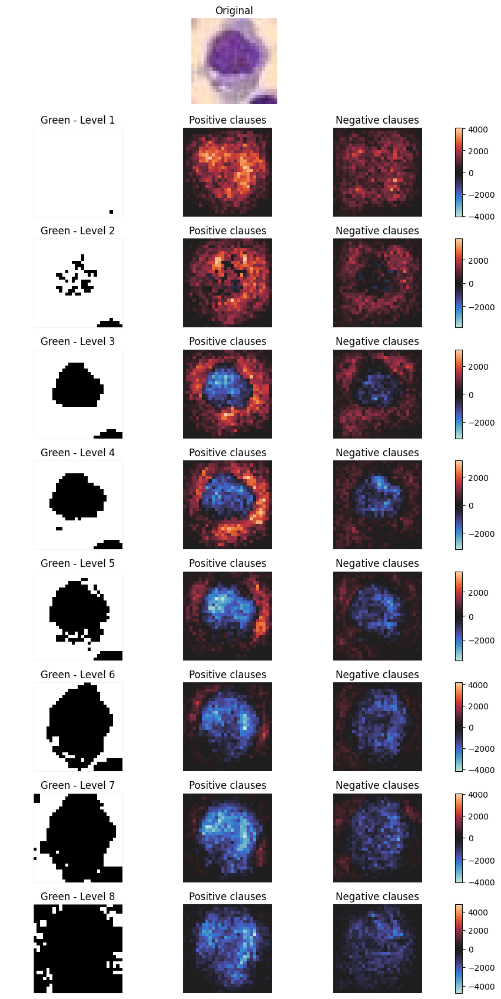

  Channel 2 (Blue -)
2026-04-10 16:18:17,314 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c8149880>
2026-04-10 16:18:17,502 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f7b1fa0>
2026-04-10 16:18:17,529 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f7a7380>
2026-04-10 16:18:17,556 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f547dd0>
2026-04-10 16:18:17,583 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f7529f0>
2026-04-10 16:18:17,610 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f3ee2d0>
2026-04-10 16:18:17,637 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da40406510>
2026-04-10 16:18:17,665 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c3549970>
  S

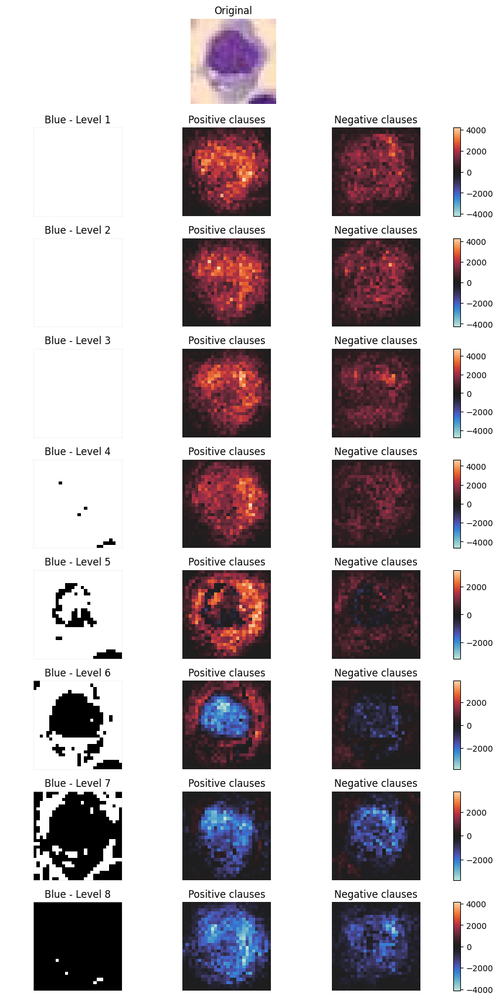

In [33]:
image_index =  754
target_class = Y_test[image_index]
print(Y_test[image_index])
save_path_aggregated=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.AGGREGATED_HEATMAP, image_index)
visualize_aggregated_heatmap(X_test, X_test_org, tm, image_index,
    resolution= CURRENT_RESOLUTION, n_channels = config.CHANNELS, image_shape=(28, 28), show_diff=False, save_path=save_path_aggregated)

    
save_path_per_channel_r=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_R, image_index)
save_path_per_channel_g=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_G, image_index)
save_path_per_channel_b=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_B, image_index)
visualize_per_channel_level_heatmaps(X_test, X_test_org, tm, image_index,
    resolution= CURRENT_RESOLUTION, n_channels = config.CHANNELS, image_shape=(28, 28), show_diff=False, channel_names=["Red -", "Green -", "Blue -"], save_path=[save_path_per_channel_r, save_path_per_channel_g, save_path_per_channel_b])

# Class 6 Local Examples 

In [34]:
# for i in range(3): 
#     print("============================================")
#     image_index = get_correct_sample_index(tm, X_test, Y_test, target_class=6, random=True)
#     print(f"Selected image index: {image_index}")
#     print(f"True class: {Y_test[image_index]}")
#     print(f"Predicted class: {tm.predict(X_test[image_index:image_index+1])[0]}")

6
Visualizing sample 959  |  predicted class: 6
2026-04-10 16:18:56,626 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da406aa600>
Saved to saved_heatmaps/color_encoding/blood_color_encoding_lh_c6_s959_aggr.svg


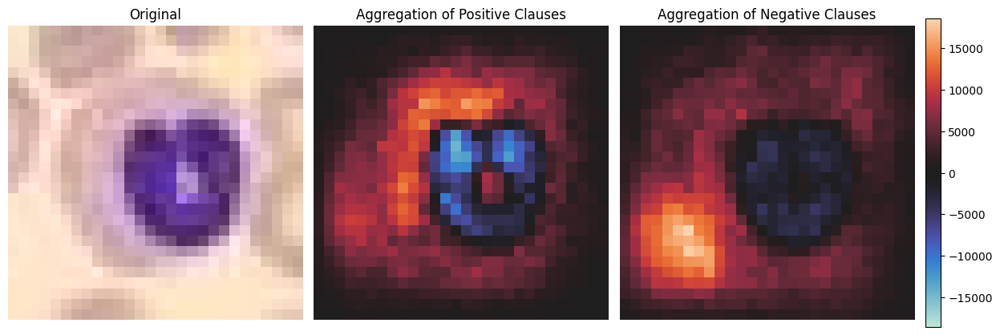

Visualizing sample 959  |  predicted class: 6
  Channel 0 (Red -)
2026-04-10 16:19:36,598 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da403d45c0>
2026-04-10 16:19:36,626 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f94e810>
2026-04-10 16:19:36,858 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f94c770>
2026-04-10 16:19:36,886 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c35cb2f0>
2026-04-10 16:19:36,913 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c36f6c60>
2026-04-10 16:19:36,940 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da403aaae0>
2026-04-10 16:19:36,968 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c2f36090>
2026-04-10 16:19:36,995 - matplotlib.colorbar - DEBUG - locator: <matplotlib.tic

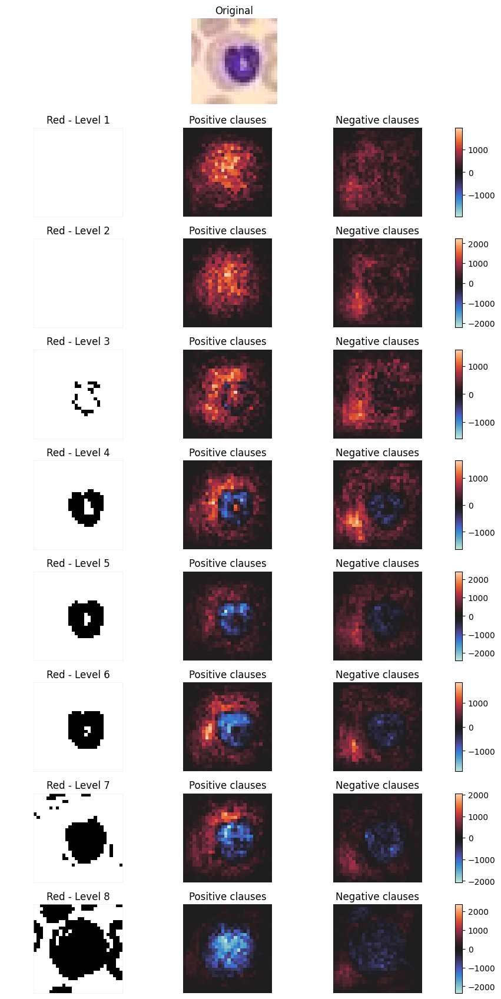

  Channel 1 (Green -)
2026-04-10 16:19:38,540 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c30b46b0>
2026-04-10 16:19:38,568 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c3131370>
2026-04-10 16:19:38,595 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da409b4230>
2026-04-10 16:19:38,623 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c3025a90>
2026-04-10 16:19:38,649 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da4094e540>
2026-04-10 16:19:38,792 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f4448f0>
2026-04-10 16:19:38,820 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f7726c0>
2026-04-10 16:19:38,847 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da40317950>
  

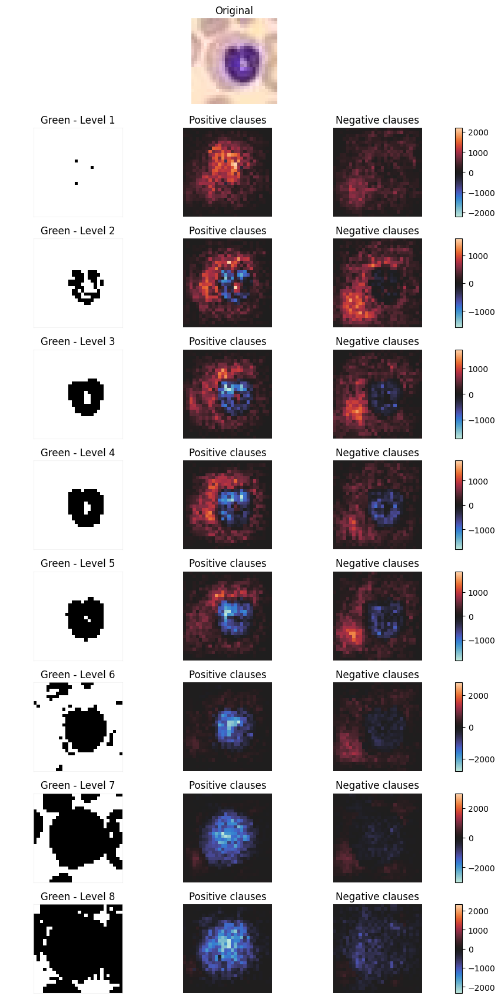

  Channel 2 (Blue -)
2026-04-10 16:19:40,356 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c33871d0>
2026-04-10 16:19:40,383 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da61bfd700>
2026-04-10 16:19:40,411 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c342d310>
2026-04-10 16:19:40,438 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da40724c50>
2026-04-10 16:19:40,465 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c3506e40>
2026-04-10 16:19:40,493 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da404d4bf0>
2026-04-10 16:19:40,520 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f40b770>
2026-04-10 16:19:40,548 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c307d310>
  S

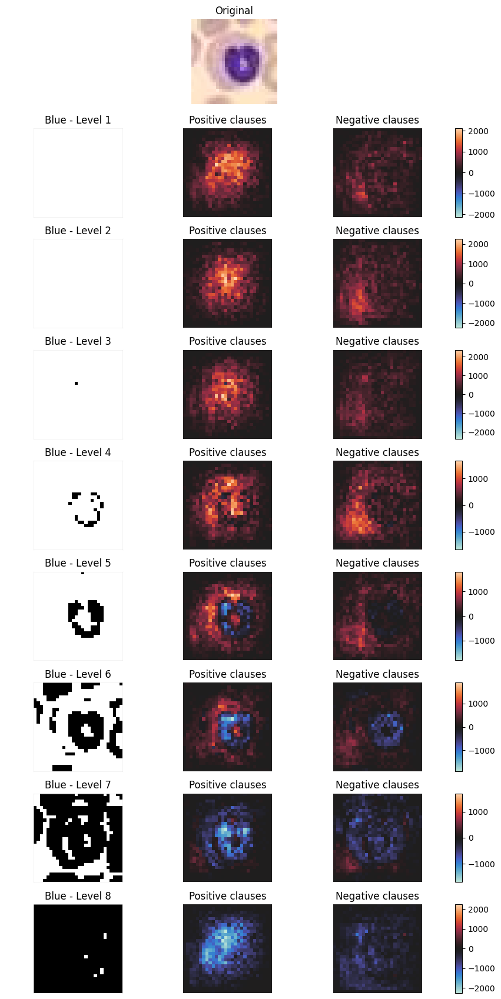

In [35]:
image_index =  959
target_class = Y_test[image_index]
print(Y_test[image_index])
save_path_aggregated=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.AGGREGATED_HEATMAP, image_index)
visualize_aggregated_heatmap(X_test, X_test_org, tm, image_index,
    resolution= CURRENT_RESOLUTION, n_channels = config.CHANNELS, image_shape=(28, 28), show_diff=False, save_path=save_path_aggregated)

    
save_path_per_channel_r=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_R, image_index)
save_path_per_channel_g=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_G, image_index)
save_path_per_channel_b=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_B, image_index)
visualize_per_channel_level_heatmaps(X_test, X_test_org, tm, image_index,
    resolution= CURRENT_RESOLUTION, n_channels = config.CHANNELS, image_shape=(28, 28), show_diff=False, channel_names=["Red -", "Green -", "Blue -"], save_path=[save_path_per_channel_r, save_path_per_channel_g, save_path_per_channel_b])

6
Visualizing sample 977  |  predicted class: 6
2026-04-10 16:20:18,913 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da40275f10>
Saved to saved_heatmaps/color_encoding/blood_color_encoding_lh_c6_s977_aggr.svg


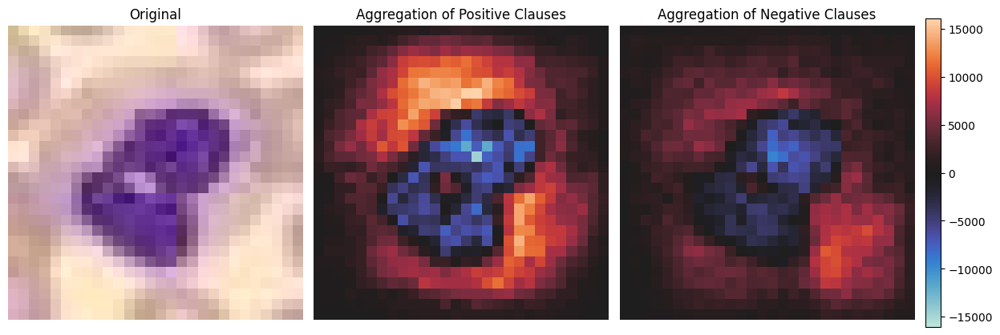

Visualizing sample 977  |  predicted class: 6
  Channel 0 (Red -)
2026-04-10 16:20:55,882 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c36f5fd0>
2026-04-10 16:20:55,911 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c3548d40>
2026-04-10 16:20:55,941 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c3387170>
2026-04-10 16:20:55,971 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f523b60>
2026-04-10 16:20:56,000 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c35a7b90>
2026-04-10 16:20:56,029 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c310d250>
2026-04-10 16:20:56,057 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c315f830>
2026-04-10 16:20:56,087 - matplotlib.colorbar - DEBUG - locator: <matplotlib.tic

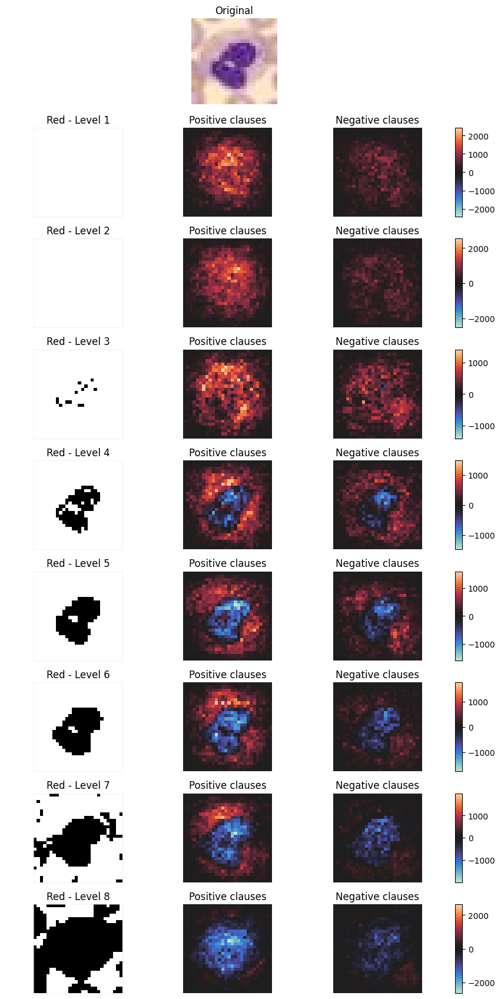

  Channel 1 (Green -)
2026-04-10 16:20:57,778 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da402d88f0>
2026-04-10 16:20:57,806 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c342ce90>
2026-04-10 16:20:57,834 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f82eb70>
2026-04-10 16:20:57,861 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f7d2b10>
2026-04-10 16:20:57,889 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da407e74d0>
2026-04-10 16:20:57,915 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f545c10>
2026-04-10 16:20:57,943 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c81694c0>
2026-04-10 16:20:57,970 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da40a4ad50>
  

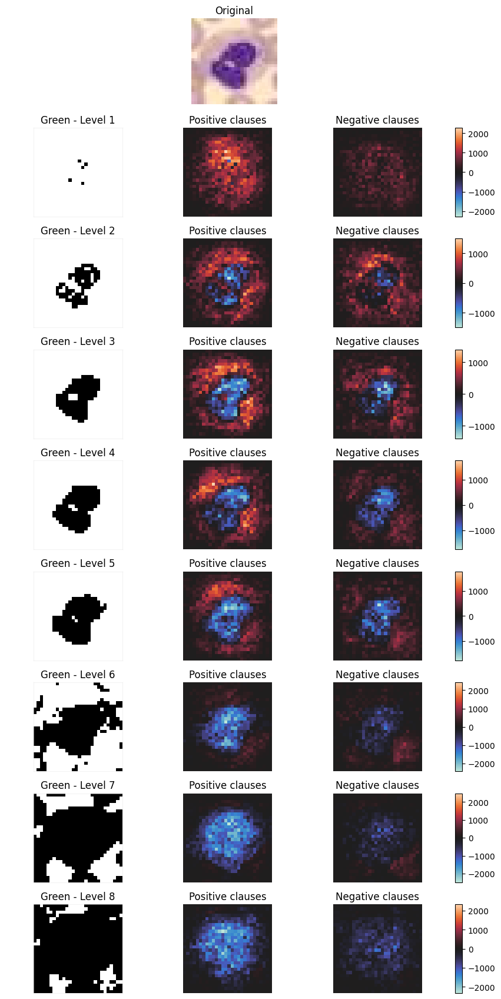

  Channel 2 (Blue -)
2026-04-10 16:20:59,508 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da40952f60>
2026-04-10 16:20:59,701 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f7518b0>
2026-04-10 16:20:59,729 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f8986b0>
2026-04-10 16:20:59,757 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c2f1e8a0>
2026-04-10 16:20:59,785 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da677e7c50>
2026-04-10 16:20:59,811 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f86da30>
2026-04-10 16:20:59,840 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f752270>
2026-04-10 16:20:59,867 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da4054ed80>
  S

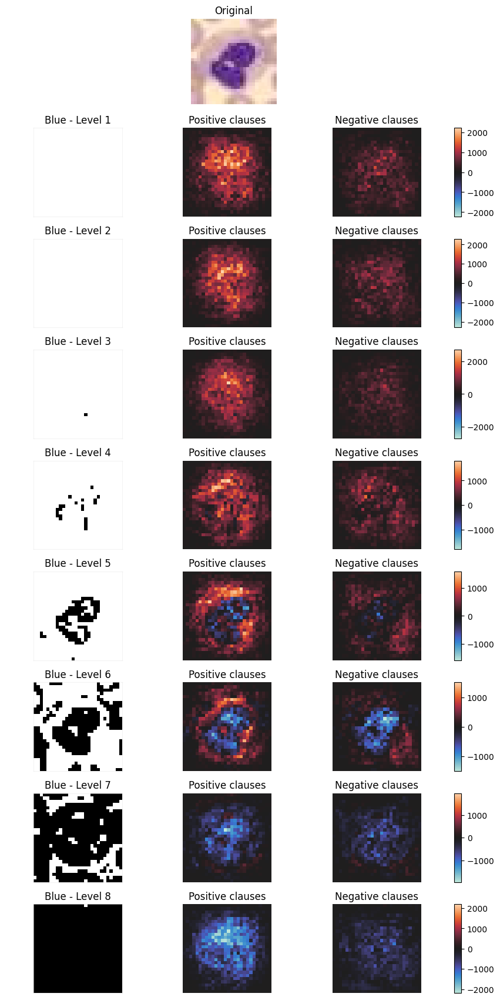

In [36]:
image_index =  977
target_class = Y_test[image_index]
print(Y_test[image_index])
save_path_aggregated=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.AGGREGATED_HEATMAP, image_index)
visualize_aggregated_heatmap(X_test, X_test_org, tm, image_index,
    resolution= CURRENT_RESOLUTION, n_channels = config.CHANNELS, image_shape=(28, 28), show_diff=False, save_path=save_path_aggregated)

    
save_path_per_channel_r=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_R, image_index)
save_path_per_channel_g=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_G, image_index)
save_path_per_channel_b=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_B, image_index)
visualize_per_channel_level_heatmaps(X_test, X_test_org, tm, image_index,
    resolution= CURRENT_RESOLUTION, n_channels = config.CHANNELS, image_shape=(28, 28), show_diff=False, channel_names=["Red -", "Green -", "Blue -"], save_path=[save_path_per_channel_r, save_path_per_channel_g, save_path_per_channel_b])

6


Visualizing sample 569  |  predicted class: 6
2026-04-10 16:21:32,588 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c3338170>
Saved to saved_heatmaps/color_encoding/blood_color_encoding_lh_c6_s569_aggr.svg


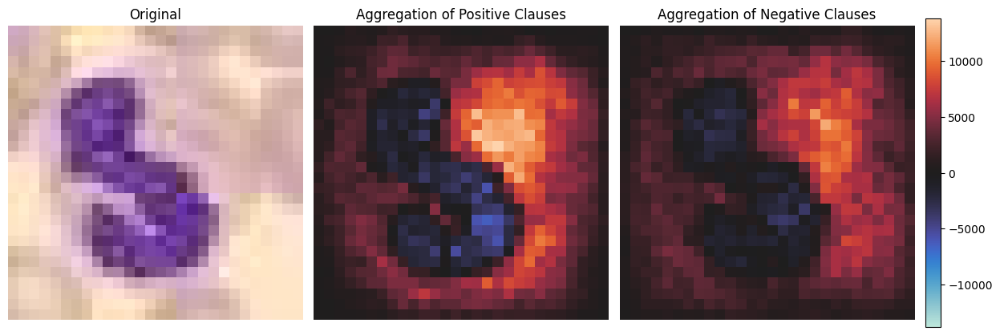

Visualizing sample 569  |  predicted class: 6
  Channel 0 (Red -)
2026-04-10 16:22:04,194 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da402d9df0>
2026-04-10 16:22:04,221 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c30b5190>
2026-04-10 16:22:04,449 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f8d7260>
2026-04-10 16:22:04,476 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f899370>
2026-04-10 16:22:04,503 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c3514bc0>
2026-04-10 16:22:04,530 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da403d6ae0>
2026-04-10 16:22:04,556 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c36f41a0>
2026-04-10 16:22:04,584 - matplotlib.colorbar - DEBUG - locator: <matplotlib.tic

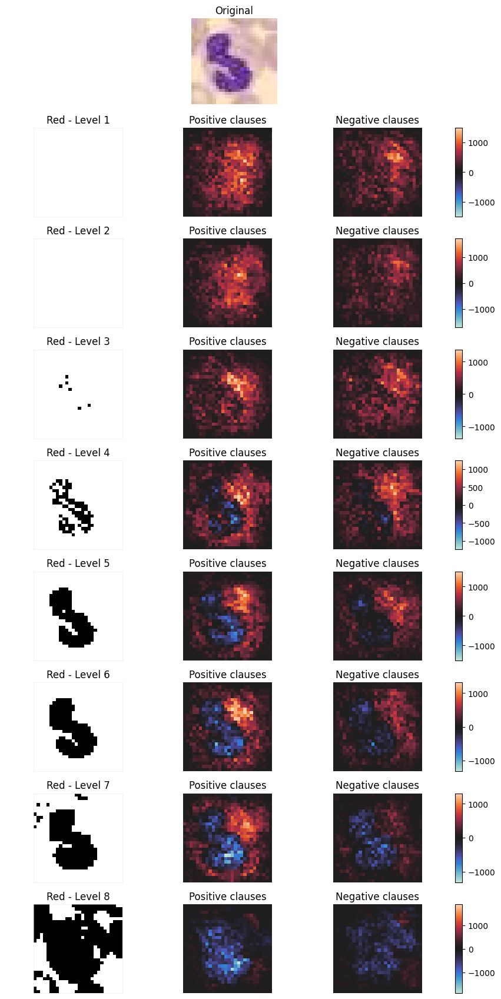

  Channel 1 (Green -)
2026-04-10 16:22:06,089 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c333cb30>
2026-04-10 16:22:06,116 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f4a84d0>
2026-04-10 16:22:06,143 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da40a4a720>
2026-04-10 16:22:06,171 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f5458e0>
2026-04-10 16:22:06,325 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da40523ef0>
2026-04-10 16:22:06,353 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c30e6e40>
2026-04-10 16:22:06,381 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da40579040>
2026-04-10 16:22:06,408 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c2e21190>
  

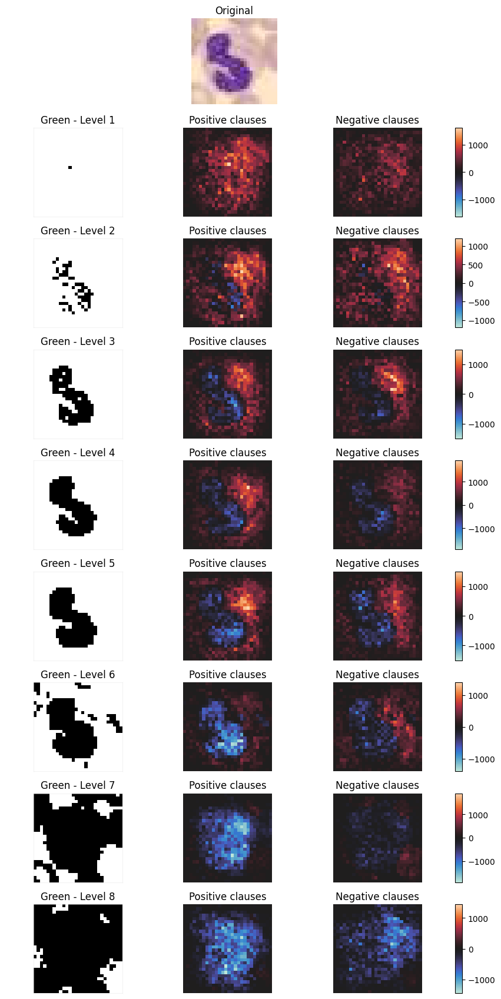

  Channel 2 (Blue -)
2026-04-10 16:22:07,900 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c3380a10>
2026-04-10 16:22:07,928 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c33854f0>
2026-04-10 16:22:07,955 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da61c9c200>
2026-04-10 16:22:07,982 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c30e66f0>
2026-04-10 16:22:08,009 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c3562a80>
2026-04-10 16:22:08,037 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f7a4980>
2026-04-10 16:22:08,065 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c351fa10>
2026-04-10 16:22:08,093 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f42b1d0>
  S

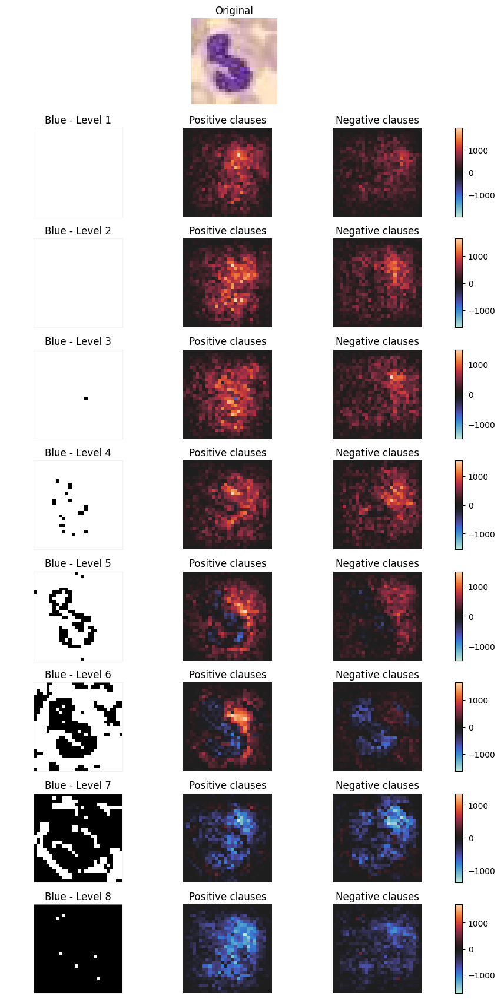

In [37]:
image_index =  569
target_class = Y_test[image_index]
print(Y_test[image_index])
save_path_aggregated=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.AGGREGATED_HEATMAP, image_index)
visualize_aggregated_heatmap(X_test, X_test_org, tm, image_index,
    resolution= CURRENT_RESOLUTION, n_channels = config.CHANNELS, image_shape=(28, 28), show_diff=False, save_path=save_path_aggregated)

    
save_path_per_channel_r=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_R, image_index)
save_path_per_channel_g=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_G, image_index)
save_path_per_channel_b=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_B, image_index)
visualize_per_channel_level_heatmaps(X_test, X_test_org, tm, image_index,
    resolution= CURRENT_RESOLUTION, n_channels = config.CHANNELS, image_shape=(28, 28), show_diff=False, channel_names=["Red -", "Green -", "Blue -"], save_path=[save_path_per_channel_r, save_path_per_channel_g, save_path_per_channel_b])

# Class 7 Local Examples 

In [38]:
# for i in range(3): 
#     print("============================================")
#     image_index = get_correct_sample_index(tm, X_test, Y_test, target_class=7, random=True)
#     print(f"Selected image index: {image_index}")
#     print(f"True class: {Y_test[image_index]}")
#     print(f"Predicted class: {tm.predict(X_test[image_index:image_index+1])[0]}")

7
Visualizing sample 26  |  predicted class: 7
2026-04-10 16:23:25,301 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f4a9910>
Saved to saved_heatmaps/color_encoding/blood_color_encoding_lh_c7_s26_aggr.svg


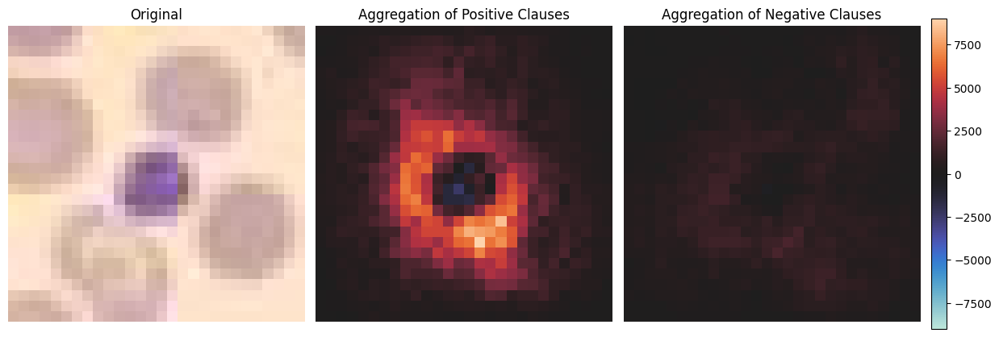

Visualizing sample 26  |  predicted class: 7
  Channel 0 (Red -)
2026-04-10 16:24:40,672 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da406253d0>
2026-04-10 16:24:40,700 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da405a5dc0>
2026-04-10 16:24:40,728 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c30b45c0>
2026-04-10 16:24:40,756 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da40925610>
2026-04-10 16:24:40,784 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c3025310>
2026-04-10 16:24:40,812 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f4abfb0>
2026-04-10 16:24:40,839 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c8181430>
2026-04-10 16:24:40,867 - matplotlib.colorbar - DEBUG - locator: <matplotlib.tick

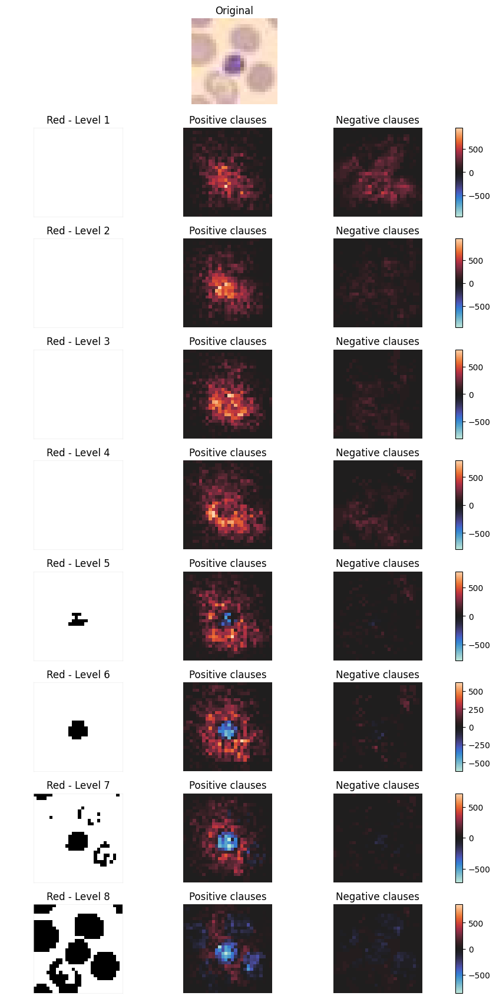

  Channel 1 (Green -)
2026-04-10 16:24:42,515 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da409746e0>
2026-04-10 16:24:42,542 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c34d9130>
2026-04-10 16:24:42,571 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c35a7dd0>
2026-04-10 16:24:42,598 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c814a8d0>
2026-04-10 16:24:42,626 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c310e360>
2026-04-10 16:24:42,653 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f4a8890>
2026-04-10 16:24:42,680 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c320b230>
2026-04-10 16:24:42,708 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da4032a480>
  

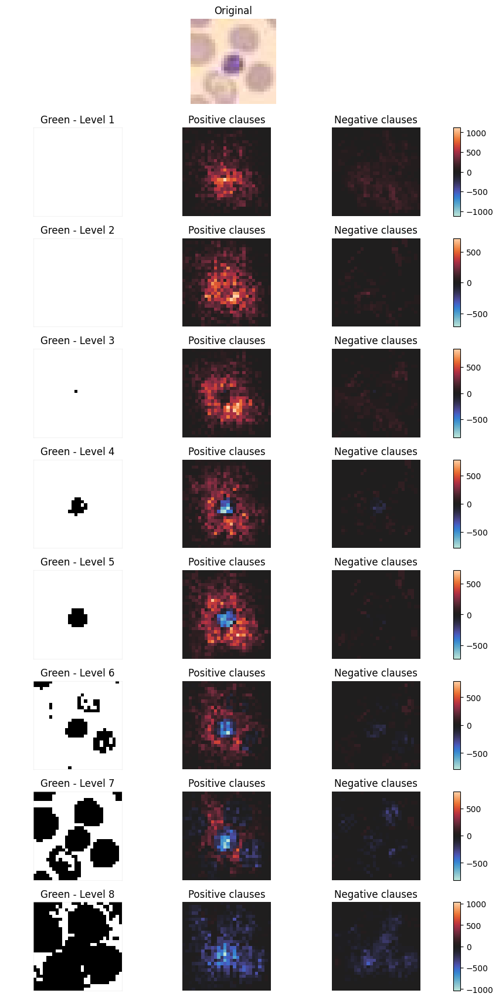

  Channel 2 (Blue -)
2026-04-10 16:24:44,212 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f751f10>
2026-04-10 16:24:44,394 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da403d6270>
2026-04-10 16:24:44,422 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c37c0590>
2026-04-10 16:24:44,450 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c354e1b0>
2026-04-10 16:24:44,476 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c325a720>
2026-04-10 16:24:44,502 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c36e94c0>
2026-04-10 16:24:44,529 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c35a77a0>
2026-04-10 16:24:44,560 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c36f47a0>
  S

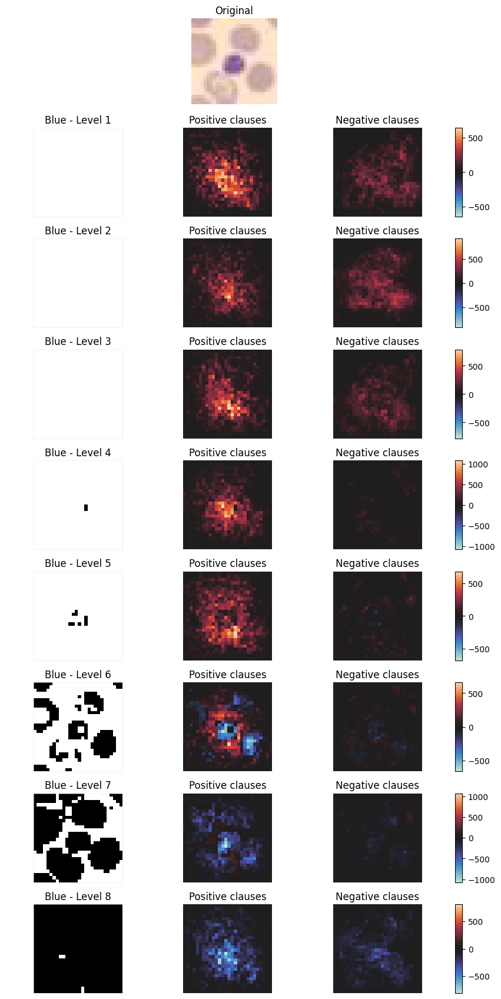

In [39]:
image_index =  26
target_class = Y_test[image_index]
print(Y_test[image_index])
save_path_aggregated=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.AGGREGATED_HEATMAP, image_index)
visualize_aggregated_heatmap(X_test, X_test_org, tm, image_index,
    resolution= CURRENT_RESOLUTION, n_channels = config.CHANNELS, image_shape=(28, 28), show_diff=False, save_path=save_path_aggregated)

    
save_path_per_channel_r=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_R, image_index)
save_path_per_channel_g=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_G, image_index)
save_path_per_channel_b=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_B, image_index)
visualize_per_channel_level_heatmaps(X_test, X_test_org, tm, image_index,
    resolution= CURRENT_RESOLUTION, n_channels = config.CHANNELS, image_shape=(28, 28), show_diff=False, channel_names=["Red -", "Green -", "Blue -"], save_path=[save_path_per_channel_r, save_path_per_channel_g, save_path_per_channel_b])

7


Visualizing sample 2186  |  predicted class: 7
2026-04-10 16:26:03,872 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da40896060>
Saved to saved_heatmaps/color_encoding/blood_color_encoding_lh_c7_s2186_aggr.svg


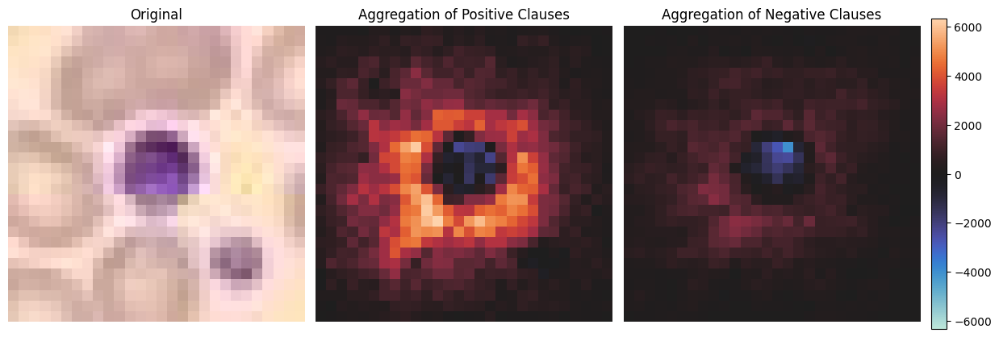

Visualizing sample 2186  |  predicted class: 7
  Channel 0 (Red -)
2026-04-10 16:27:22,186 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f42a9c0>
2026-04-10 16:27:22,213 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c315f020>
2026-04-10 16:27:22,434 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c335f410>
2026-04-10 16:27:22,461 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f750a10>
2026-04-10 16:27:22,487 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da4074f560>
2026-04-10 16:27:22,514 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f4cc710>
2026-04-10 16:27:22,541 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c3648260>
2026-04-10 16:27:22,568 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ti

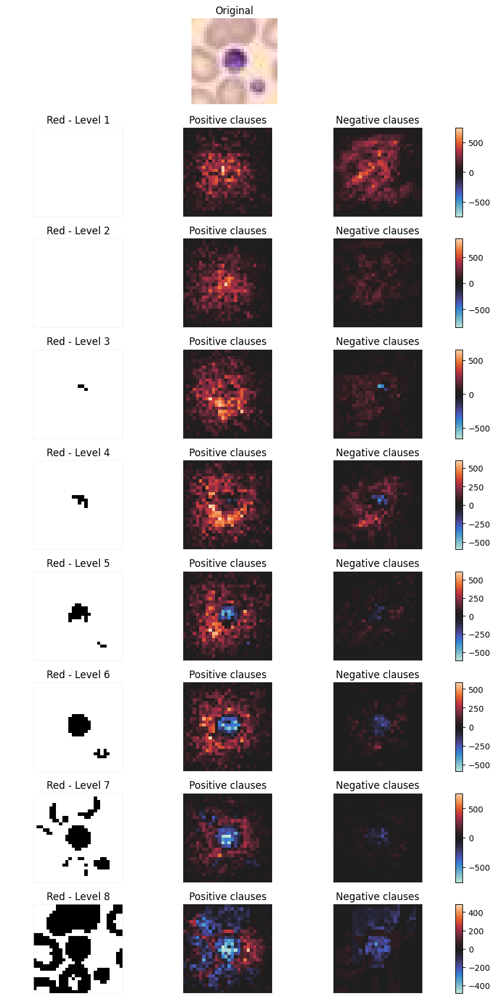

  Channel 1 (Green -)
2026-04-10 16:27:24,138 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da61c3c440>
2026-04-10 16:27:24,165 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da40331e50>
2026-04-10 16:27:24,193 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da401ab170>
2026-04-10 16:27:24,219 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f5476b0>
2026-04-10 16:27:24,366 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c36e9640>
2026-04-10 16:27:24,392 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f87ca40>
2026-04-10 16:27:24,419 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f8d5f70>
2026-04-10 16:27:24,446 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c2e5a2d0>
  

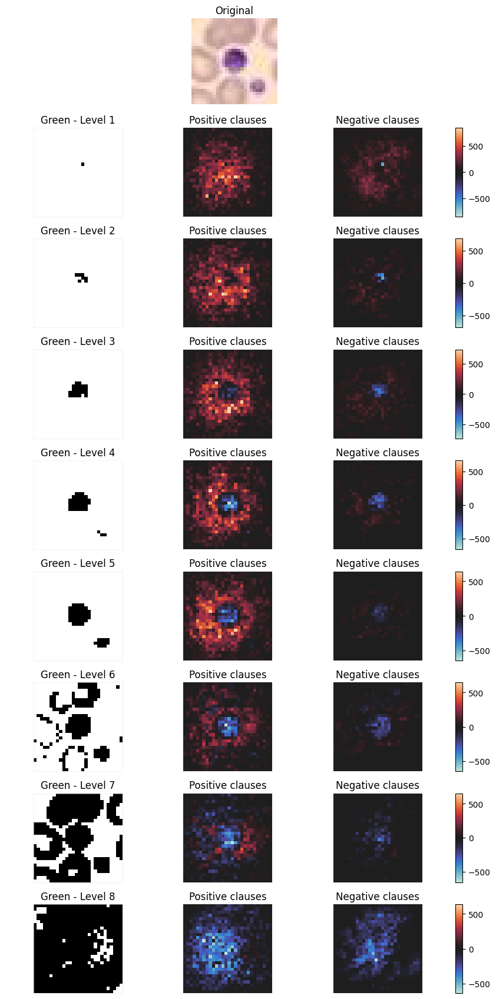

  Channel 2 (Blue -)
2026-04-10 16:27:25,905 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c364ab10>
2026-04-10 16:27:25,932 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da403ea600>
2026-04-10 16:27:25,959 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da401fe750>
2026-04-10 16:27:25,985 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da402c8800>
2026-04-10 16:27:26,013 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da40850ef0>
2026-04-10 16:27:26,039 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c335ac30>
2026-04-10 16:27:26,066 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c2f457c0>
2026-04-10 16:27:26,094 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f3c2570>
  S

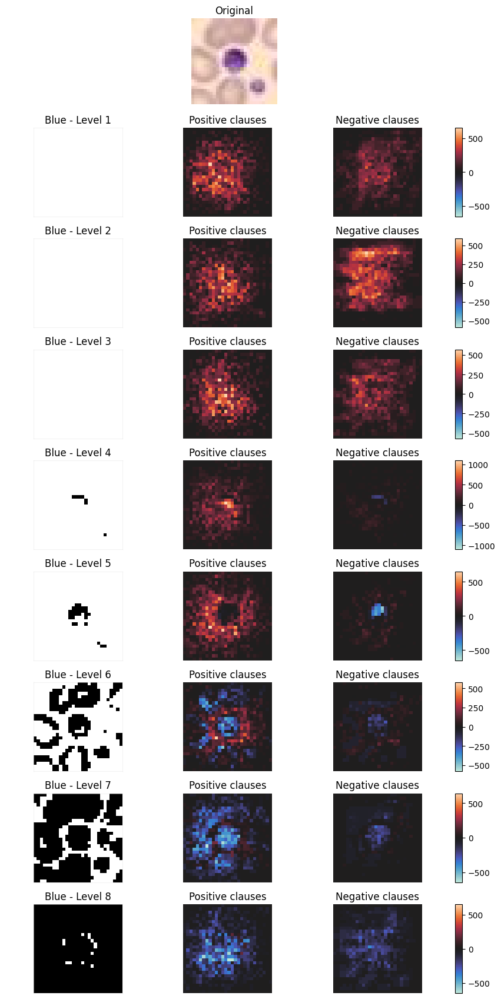

In [40]:
image_index =  2186
target_class = Y_test[image_index]
print(Y_test[image_index])
save_path_aggregated=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.AGGREGATED_HEATMAP, image_index)
visualize_aggregated_heatmap(X_test, X_test_org, tm, image_index,
    resolution= CURRENT_RESOLUTION, n_channels = config.CHANNELS, image_shape=(28, 28), show_diff=False, save_path=save_path_aggregated)

    
save_path_per_channel_r=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_R, image_index)
save_path_per_channel_g=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_G, image_index)
save_path_per_channel_b=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_B, image_index)
visualize_per_channel_level_heatmaps(X_test, X_test_org, tm, image_index,
    resolution= CURRENT_RESOLUTION, n_channels = config.CHANNELS, image_shape=(28, 28), show_diff=False, channel_names=["Red -", "Green -", "Blue -"], save_path=[save_path_per_channel_r, save_path_per_channel_g, save_path_per_channel_b])

7


Visualizing sample 840  |  predicted class: 7
2026-04-10 16:28:47,562 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da4054d940>
Saved to saved_heatmaps/color_encoding/blood_color_encoding_lh_c7_s840_aggr.svg


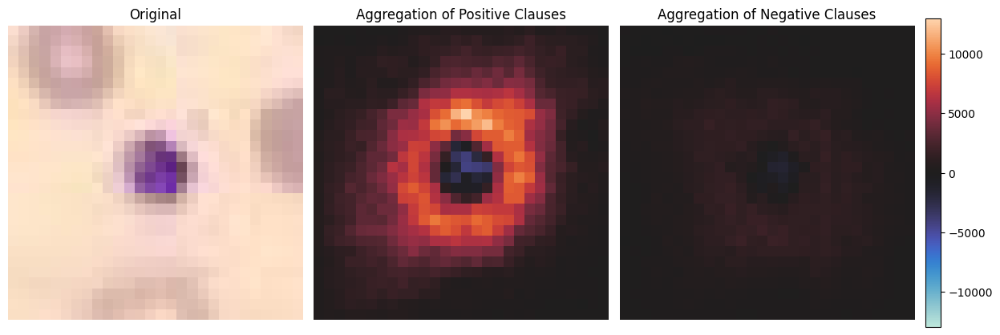

Visualizing sample 840  |  predicted class: 7
  Channel 0 (Red -)
2026-04-10 16:30:08,017 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c35a47a0>
2026-04-10 16:30:08,045 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c35a4b30>
2026-04-10 16:30:08,074 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f87ec90>
2026-04-10 16:30:08,102 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f4abda0>
2026-04-10 16:30:08,130 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da404a7a10>
2026-04-10 16:30:08,158 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c3380530>
2026-04-10 16:30:08,186 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da409f41a0>
2026-04-10 16:30:08,214 - matplotlib.colorbar - DEBUG - locator: <matplotlib.tic

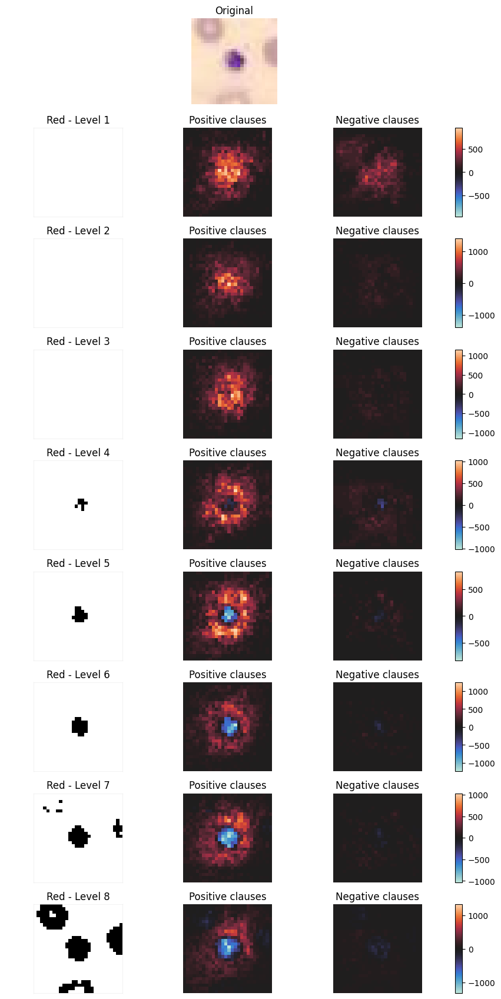

  Channel 1 (Green -)
2026-04-10 16:30:09,929 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da406247a0>
2026-04-10 16:30:09,956 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c325b290>
2026-04-10 16:30:09,983 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da406ff7d0>
2026-04-10 16:30:10,010 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f7248f0>
2026-04-10 16:30:10,038 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da4057b650>
2026-04-10 16:30:10,065 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c354c3e0>
2026-04-10 16:30:10,092 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da406fef30>
2026-04-10 16:30:10,120 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c342d760>
  

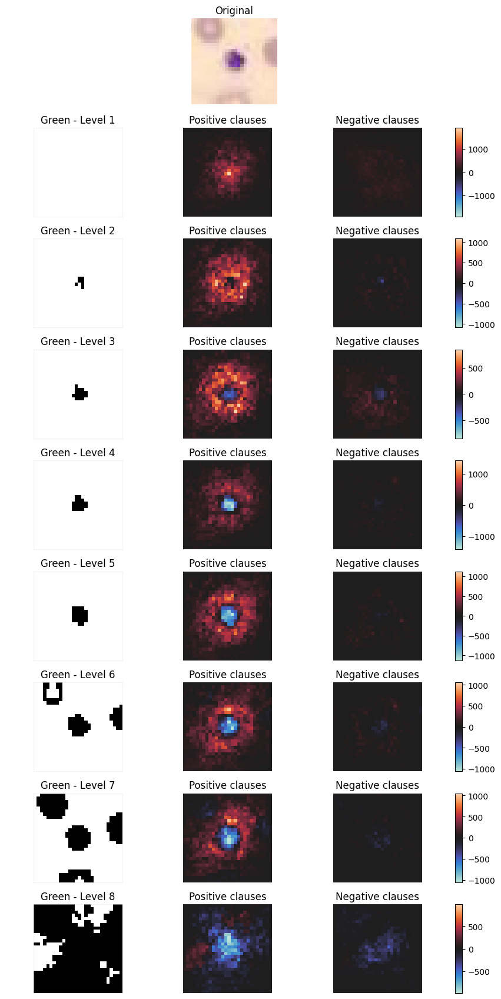

  Channel 2 (Blue -)
2026-04-10 16:30:11,642 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c2f92540>
2026-04-10 16:30:11,826 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da61cc7b00>
2026-04-10 16:30:11,854 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c307c650>
2026-04-10 16:30:11,881 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da409f7650>
2026-04-10 16:30:11,908 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f3c19d0>
2026-04-10 16:30:11,936 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da3f82e180>
2026-04-10 16:30:11,962 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72d9c309d310>
2026-04-10 16:30:11,989 - matplotlib.colorbar - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x72da408a0560>
  S

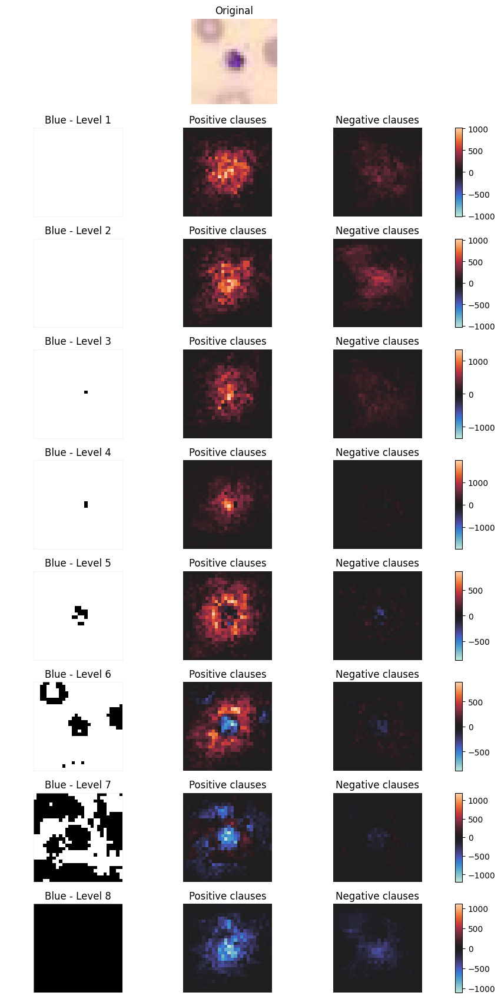

In [41]:
image_index =  840
target_class = Y_test[image_index]
print(Y_test[image_index])
save_path_aggregated=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.AGGREGATED_HEATMAP, image_index)
visualize_aggregated_heatmap(X_test, X_test_org, tm, image_index,
    resolution= CURRENT_RESOLUTION, n_channels = config.CHANNELS, image_shape=(28, 28), show_diff=False, save_path=save_path_aggregated)

    
save_path_per_channel_r=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_R, image_index)
save_path_per_channel_g=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_G, image_index)
save_path_per_channel_b=build_save_path(os.path.join(config.SAVE_DIR_HEATMAPS, CURRENT_SPECIALIST), CURRENT_DATASET, CURRENT_SPECIALIST, config.LOCAL_HEATMAP, target_class, config.RES_HEATMAP_B, image_index)
visualize_per_channel_level_heatmaps(X_test, X_test_org, tm, image_index,
    resolution= CURRENT_RESOLUTION, n_channels = config.CHANNELS, image_shape=(28, 28), show_diff=False, channel_names=["Red -", "Green -", "Blue -"], save_path=[save_path_per_channel_r, save_path_per_channel_g, save_path_per_channel_b])